In [ ]:
import kagglehub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer
from imblearn.under_sampling import RandomUnderSampler
import warnings
warnings.filterwarnings('ignore')

path = kagglehub.dataset_download("rameshmehta/credit-risk-analysis")
data_file = 'data.csv'
df = pd.read_csv(f'{path}/{data_file}')

missing_stats = df.isnull().sum()
missing_percent = (missing_stats / len(df)) * 100
missing_df = pd.DataFrame({
    'Feature': missing_stats.index,
    'Missing_Count': missing_stats.values,
    'Missing_Percentage': missing_percent.values
}).sort_values('Missing_Percentage', ascending=False)
features_with_missing = missing_df[missing_df['Missing_Count'] > 0]

features_to_remove = []
id_patterns = ['id', 'member_id', 'emp_title', 'desc', 'zip_code', 'addr_state', 'verification_status_joint', 'dti_joint', 'annual_inc_joint', 'next_pymnt_d',
               'il_util', 'mths_since_rcnt_il', 'max_bal_bc', 'open_acc_6m', 'open_rv_24m', 'inq_last_12m', 'total_cu_tl', 'inq_fi', 'all_util', 'open_il_6m',
               'open_il_24m', 'open_il_12m', 'total_bal_il', 'open_rv_12m', 'title', 'initial_list_status', 'policy_code', 'last_pymnt_d', 'last_credit_pull_d',
               'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'last_pymnt_amnt', 'recoveries', 'collection_recovery_fee',
               'collections_12_mths_ex_med', 'acc_now_delinq', 'tot_coll_amt', 'out_prncp', 'out_prncp_inv', 'tot_cur_bal', 'mths_since_last_delinq',
               'mths_since_last_major_derog', 'mths_since_last_record', 'funded_amnt', 'funded_amnt_inv', 'installment']

for col in id_patterns:
    features_to_remove.append(col)

df_clean = df.drop(columns=features_to_remove, errors='ignore')
df_clean['emp_length'].fillna(df_clean['emp_length'].mode()[0], inplace=True)
df_clean['total_rev_hi_lim_missing'] = df_clean['total_rev_hi_lim'].isnull().astype(int)
df_clean['total_rev_hi_lim'].fillna(df_clean['total_rev_hi_lim'].median(), inplace=True)
df_clean['revol_util_missing'] = df_clean['revol_util'].isnull().astype(int)
df_clean['revol_util'].fillna(df_clean['revol_util'].median(), inplace=True)

emp_length_order = {
    'n/a': 0,
    '< 1 year': 1,
    '1 year': 2,
    '2 years': 3,
    '3 years': 4,
    '4 years': 5,
    '5 years': 6,
    '6 years': 7,
    '7 years': 8,
    '8 years': 9,
    '9 years': 10,
    '10+ years': 11
}
emp_length_mode = df_clean['emp_length'].mode()[0]

grade_mapping = {
    'A': 0,
    'B': 1,
    'C': 2,
    'D': 3,
    'E': 4,
    'F': 5,
    'G': 6
}
sub_grades = [f"{g}{n}" for g in "ABCDEFG" for n in range(1, 6)]
sub_grade_mapping = {sub: idx for idx, sub in enumerate(sub_grades)}

df_clean['emp_length'] = df_clean['emp_length'].map(emp_length_order).fillna(emp_length_mode)
df_clean['grade'] = df_clean['grade'].map(grade_mapping)
df_clean['sub_grade'] = df_clean['sub_grade'].map(sub_grade_mapping)

categorical_cols = [
    'term', 'home_ownership', 'verification_status',
    'pymnt_plan', 'purpose', 'application_type'
]

date_cols = [
    'issue_d', 'earliest_cr_line']
for col in date_cols:
    df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce')

reference_date = pd.Timestamp('2007-01-01')
for col in date_cols:
    df_clean[f'{col}_year'] = df_clean[col].dt.year.fillna(2007).astype(int)
    df_clean[f'{col}_month'] = df_clean[col].dt.month.fillna(1).astype(int)
    df_clean[f'{col}_days_since'] = (reference_date - df_clean[col]).dt.days.fillna(9999).astype(int)
df_clean.drop(columns=date_cols, inplace=True)

numerical_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
if 'default_ind' in numerical_cols:
    numerical_cols.remove('default_ind')

constant_features = []
for col in numerical_cols:
    if df_clean[col].nunique() <= 1:
        constant_features.append(col)
numerical_cols = [col for col in numerical_cols if col not in constant_features]

try:
    pt = PowerTransformer(method='yeo-johnson', standardize=True)
    df_clean[numerical_cols] = pt.fit_transform(df_clean[numerical_cols])
except Exception as e:
    scaler = StandardScaler()
    df_clean[numerical_cols] = scaler.fit_transform(df_clean[numerical_cols])

df_clean = pd.get_dummies(df_clean, columns=categorical_cols, drop_first=True)
bool_cols = df_clean.select_dtypes(include='bool').columns
df_clean[bool_cols] = df_clean[bool_cols].astype(int)

X = df_clean.drop(columns=['default_ind'])
y = df_clean['default_ind']

rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(X, y)


X_train, X_temp, y_train, y_temp = train_test_split(
    X_resampled, y_resampled,
    test_size=0.30,
    random_state=42,
    stratify=y_resampled
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=42,
    stratify=y_temp
)


features_to_remove = [
    'grade', 'sub_grade'
]

X_test_subset = X_test.drop(columns=features_to_remove, errors='ignore')

X_test_subset_aligned = X_test_subset.reindex(columns=X_train.columns, fill_value=0)



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score
import random
import pickle

class TabularDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32)
        self.y = torch.tensor(y.values, dtype=torch.float32).unsqueeze(1)  # Shape (N, 1)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


def prepare_data(df_resampled):
    #  Separate features and target
    X = df_resampled.drop(columns=['default_ind'])
    y = df_resampled['default_ind']

    # Train/Val/Test split (70/15/15) with stratification. WE could have gone with 80/10/10 too.
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.30, stratify=y, random_state=42
    )
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=42
    )

    # Standardize features (fit on train only)
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X.columns)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X.columns)
    X_test_subset_scaled = pd.DataFrame(scaler.transform(X_test_subset_aligned), columns=X.columns)

    # Wrap in PyTorch Dataset
    train_dataset = TabularDataset(X_train_scaled, y_train)
    val_dataset = TabularDataset(X_val_scaled, y_val)
    test_dataset = TabularDataset(X_test_scaled, y_test)
    test_subset_dataset = TabularDataset(X_test_subset_scaled, y_test)

    return train_dataset, val_dataset, test_dataset, test_subset_dataset, X.columns.tolist()

def create_loaders(train_dataset, val_dataset, test_dataset, test_subset_dataset, batch_size=64):
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    test_subset_loader = DataLoader(test_subset_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader, test_loader, test_subset_loader

class AttentionBranch(nn.Module):
    def __init__(self, input_dim, embed_dim=32, num_heads=4, dropout=0.1):
        super(AttentionBranch, self).__init__()
        self.input_dim = input_dim      # Number of features
        self.embed_dim = embed_dim      # Embedding size per feature
        self.num_heads = num_heads

        # 1. Feature embedding layer: project each scalar feature to a vector
        # Input: (batch_size, input_dim) → Output: (batch_size, input_dim, embed_dim)
        self.feature_embedding = nn.Linear(1, embed_dim)

        # 2. Multi-head self-attention layer
        # PyTorch MultiheadAttention expects shape: (seq_len, batch, embed_dim)
        self.attention = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=num_heads, dropout=dropout)

        # 3. Final projection after attention (optional)
        self.output_proj = nn.Linear(embed_dim, embed_dim)

        self.dropout = nn.Dropout(dropout)
        self.layernorm = nn.LayerNorm(embed_dim)

    def forward(self, x):
        """
        x: Tensor of shape (batch_size, input_dim)
        """
        batch_size, input_dim = x.shape

        # Step 1: Embed each feature separately

        # Reshape to (batch_size * input_dim, 1) to embed each scalar feature
        x_reshaped = x.view(-1, 1)  # (batch_size*input_dim, 1)
        embedded = self.feature_embedding(x_reshaped)  # (batch_size*input_dim, embed_dim)
        embedded = embedded.view(batch_size, input_dim, self.embed_dim)  # (batch_size, input_dim, embed_dim)

        embedded = embedded.permute(1, 0, 2)  # (input_dim, batch_size, embed_dim)

        attn_output, attn_weights = self.attention(embedded, embedded, embedded)
        # attn_output shape: (input_dim, batch_size, embed_dim)

        attn_output = self.dropout(attn_output)
        out = self.layernorm(attn_output + embedded)  # (input_dim, batch_size, embed_dim)

        out = self.output_proj(out)  # (input_dim, batch_size, embed_dim)
        out = out.permute(1, 0, 2).contiguous()  # (batch_size, input_dim, embed_dim)
        out = out.view(batch_size, -1)  # flatten all features: (batch_size, input_dim * embed_dim)

        return out, attn_weights  # return output and attention weights for interpretability


# MLP branch: stack of fully connected layers with ReLU and dropout
class MLPBranch(nn.Module):
    def __init__(self, input_dim, hidden_dims=[64, 32, 16], dropout=0.1):
        super(MLPBranch, self).__init__()
        layers = []
        in_dim = input_dim

        for h_dim in hidden_dims:
            layers.append(nn.Linear(in_dim, h_dim))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout))
            in_dim = h_dim

        self.mlp = nn.Sequential(*layers)

    def forward(self, x):
        return self.mlp(x)  # (batch_size, last_hidden_dim)

class HybridAttentionNet(nn.Module):
    def __init__(
        self,
        input_dim,
        embed_dim=32,
        num_heads=4,
        mlp_hidden_dims=[64, 32, 16],
        dropout=0.1,
    ):
        super(HybridAttentionNet, self).__init__()

        # Attention branch
        self.attention_branch = AttentionBranch(input_dim, embed_dim, num_heads, dropout)

        # MLP branch
        self.mlp_branch = MLPBranch(input_dim, mlp_hidden_dims, dropout)

        # Fusion layer: combine attention output and MLP output
        fusion_input_dim = input_dim * embed_dim + mlp_hidden_dims[-1]
        self.fusion_layer = nn.Sequential(
            nn.Linear(fusion_input_dim, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 1),  # final output = probability of default
            nn.Sigmoid(),
        )

    def forward(self, x):
        # Attention branch output (flattened)
        attn_out, attn_weights = self.attention_branch(x)  # (batch_size, input_dim * embed_dim)

        # MLP branch output
        mlp_out = self.mlp_branch(x)  # (batch_size, last_hidden_dim)

        # Concatenate features from both branches
        combined = torch.cat([attn_out, mlp_out], dim=1)  # (batch_size, fusion_input_dim)

        # Pass through fusion layers to get final probability
        output = self.fusion_layer(combined)  # (batch_size, 1)

        return output, attn_weights  # output

def train_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    all_preds = []
    all_targets = []

    for X_batch, y_batch in dataloader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        outputs, _ = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X_batch.size(0)
        all_preds.append(outputs.detach().cpu())
        all_targets.append(y_batch.detach().cpu())

    epoch_loss = running_loss / len(dataloader.dataset)
    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_preds_label = (all_preds >= 0.5).astype(int)

    epoch_auc = roc_auc_score(all_targets, all_preds)
    epoch_precision = precision_score(all_targets, all_preds_label)
    epoch_recall = recall_score(all_targets, all_preds_label)
    epoch_accuracy = accuracy_score(all_targets, all_preds_label)


    return epoch_loss, epoch_auc, epoch_precision, epoch_recall, epoch_accuracy

def eval_epoch(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs, _ = model(X_batch)
            loss = criterion(outputs, y_batch)

            running_loss += loss.item() * X_batch.size(0)
            all_preds.append(outputs.cpu())
            all_targets.append(y_batch.cpu())

    epoch_loss = running_loss / len(dataloader.dataset)
    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_preds_label = (all_preds >= 0.5).astype(int)

    epoch_auc = roc_auc_score(all_targets, all_preds)
    epoch_precision = precision_score(all_targets, all_preds_label)
    epoch_recall = recall_score(all_targets, all_preds_label)
    epoch_accuracy = accuracy_score(all_targets, all_preds_label)


    return epoch_loss, epoch_auc, epoch_precision, epoch_recall, epoch_accuracy

def train_model(
    model,
    train_loader,
    val_loader,
    n_epochs=20,
    lr=1e-3,
    device=None,
    save_path="best_model.pth"
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCELoss()
    history = {
        'train_loss': [],
        'train_auc': [],
        'train_acc': [],
        'val_loss': [],
        'val_auc': [],
        'val_acc': []
    }

    best_val_auc = 0.0

    for epoch in range(1, n_epochs + 1):
        train_loss, train_auc, train_prec, train_rec, train_acc = train_epoch(model, train_loader, optimizer, criterion, device)
        val_loss, val_auc, val_prec, val_rec, val_acc = eval_epoch(model, val_loader, criterion, device)

        history['train_loss'].append(train_loss)
        history['train_auc'].append(train_auc)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_auc'].append(val_auc)
        history['val_acc'].append(val_acc)

        print(
            f"Epoch {epoch}/{n_epochs} | "
            f"Train Loss: {train_loss:.4f} | Train AUC: {train_auc:.4f} | Train Precision: {train_prec:.4f} | Train Recall: {train_rec:.4f} | Train Accuracy: {train_acc:.4f} || "
            f"Val Loss: {val_loss:.4f} | Val AUC: {val_auc:.4f} | Val Precision: {val_prec:.4f} | Val Recall: {val_rec:.4f} | Val Accuracy: {val_acc:.4f}"
        )

        # Save model if validation AUC improves
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            torch.save(model.state_dict(), save_path)
            print(f"--> Saved best model with Val AUC: {best_val_auc:.4f}")

    print("Training complete.")
    print(f"Best Val AUC: {best_val_auc:.4f}")

    # Load best model weights before returning
    model.load_state_dict(torch.load(save_path))
    return model, history

def test_model(model, test_loader, device):
    model.eval()
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs, _ = model(X_batch)
            all_preds.append(outputs.cpu())
            all_targets.append(y_batch.cpu())

    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_preds_label = (all_preds >= 0.5).astype(int)

    auc = roc_auc_score(all_targets, all_preds)
    precision = precision_score(all_targets, all_preds_label)
    recall = recall_score(all_targets, all_preds_label)
    accuracy = accuracy_score(all_targets, all_preds_label)

    print(f"Test AUC: {auc:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}")

def calculate_fit_metrics(epochs, values):
    coeffs = np.polyfit(epochs, values, 1)
    fit_line = np.polyval(coeffs, epochs)
    residuals = np.array(values) - fit_line
    r2 = 1 - (np.sum(residuals**2) / np.sum((np.array(values) - np.mean(values))**2))
    equation = f"y = {coeffs[0]:.4f}x + {coeffs[1]:.4f}"
    return r2, residuals, equation, fit_line

def plot_loss_and_auc_with_fit(history):
    epochs = np.arange(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12, 6))

    # Loss subplot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss per Epoch')
    plt.legend()
    plt.grid(True)

    # Auc subplot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_auc'], label='Train AUC', color='blue')
    plt.plot(epochs, history['val_auc'], label='Val AUC', color='orange')

    train_r2, train_res, train_eq, train_fit = calculate_fit_metrics(epochs, history['train_auc'])
    val_r2, val_res, val_eq, val_fit = calculate_fit_metrics(epochs, history['val_auc'])

    plt.plot(epochs, train_fit, '--', color='blue', label=f'Train Fit (R²={train_r2:.3f})')
    plt.plot(epochs, val_fit, '--', color='orange', label=f'Val Fit (R²={val_r2:.3f})')

    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.title('AUC per Epoch with Best Fit Lines')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return {
        'train_r2': train_r2,
        'train_residuals': train_res,
        'train_equation': train_eq,
        'val_r2': val_r2,
        'val_residuals': val_res,
        'val_equation': val_eq
    }

def get_preds_probs_labels(model, dataloader, device):
    model.eval()
    all_probs, all_targets = [], []
    with torch.no_grad():
        for X, y in dataloader:
            X = X.to(device)
            outputs, _ = model(X)
            all_probs.append(outputs.cpu())
            all_targets.append(y)
    probs = torch.cat(all_probs).numpy().flatten()
    targets = torch.cat(all_targets).numpy().flatten()
    preds = (probs >= 0.5).astype(int)
    return targets, probs, preds

def print_metrics_and_plot_roc(model, train_loader, val_loader, test_loader, device):
    y_train, y_train_probs, y_train_preds = get_preds_probs_labels(model, train_loader, device)
    y_val, y_val_probs, y_val_preds = get_preds_probs_labels(model, val_loader, device)
    y_test, y_test_probs, y_test_preds = get_preds_probs_labels(model, test_loader, device)
    y_test_subset, y_test_subset_probs, y_test_subset_preds = get_preds_probs_labels(model, test_subset_loader, device)

    # Print metrics
    for name, y_true, y_prob, y_pred in [
        ("Training", y_train, y_train_probs, y_train_preds),
        ("Validation", y_val, y_val_probs, y_val_preds),
        ("Testing", y_test, y_test_probs, y_test_preds),
        ("Subset Testing", y_test_subset, y_test_subset_probs, y_test_subset_preds)
    ]:
        auc_score = roc_auc_score(y_true, y_prob)
        print(f"{name} AUC-ROC Score: {auc_score:.4f}")
        print(f"{name} Classification Report:")
        print(classification_report(y_true, y_pred, digits=6))
        print()

    # Compute ROC curves
    fpr_train, tpr_train, _ = roc_curve(y_train, y_train_probs)
    fpr_val, tpr_val, _ = roc_curve(y_val, y_val_probs)
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_probs)
    fpr_test_subset, tpr_test_subset, _ = roc_curve(y_test_subset, y_test_subset_probs)

    # Plot
    fig, axs = plt.subplots(1, 2, figsize=(18, 5))

    axs[0].plot(fpr_train, tpr_train, color='blue', label=f'Train AUC = {roc_auc_score(y_train, y_train_probs):.2f}')
    axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[0].set_title('ROC Curve - Train Set')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].legend(loc='lower right')
    axs[0].grid(True)

    axs[1].plot(fpr_val, tpr_val, color='green', label=f'Val AUC = {roc_auc_score(y_val, y_val_probs):.2f}')
    axs[1].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[1].set_title('ROC Curve - Validation Set')
    axs[1].set_xlabel('False Positive Rate')
    axs[1].set_ylabel('True Positive Rate')
    axs[1].legend(loc='lower right')
    axs[1].grid(True)

    fig, axs = plt.subplots(1, 2, figsize=(18, 5))

    axs[0].plot(fpr_test, tpr_test, color='red', label=f'Test AUC = {roc_auc_score(y_test, y_test_probs):.2f}')
    axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[0].set_title('ROC Curve - Test Set')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].legend(loc='lower right')
    axs[0].grid(True)

    axs[1].plot(fpr_test_subset, tpr_test_subset, color='orange', label=f'Subset Test AUC = {roc_auc_score(y_test_subset, y_test_subset_probs):.2f}')
    axs[1].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[1].set_title('ROC Curve - Subset Test Set')
    axs[1].set_xlabel('False Positive Rate')
    axs[1].set_ylabel('True Positive Rate')
    axs[1].legend(loc='lower right')
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()

train_dataset, val_dataset, test_dataset, test_subset_dataset, feature_names = prepare_data(df_resampled)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

NameError: name 'df_resampled' is not defined

In [ ]:
import kagglehub
# Download latest version
path = kagglehub.dataset_download("rameshmehta/credit-risk-analysis")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/credit-risk-analysis


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler
import warnings
warnings.filterwarnings('ignore')

data_file = 'data.csv'
df = pd.read_csv(f'{path}/{data_file}')

print("="*60)
print("INITIAL DATA")
print("="*60)

# Basic dataset information
print(f"Dataset shape: {df.shape}")

# Basic statistics
print(f"\nDataset Info:")
print(f"  - Total records: {len(df):,}")
print(f"  - Total features: {df.shape[1]}")
print(f"  - Numerical features: {len(df.select_dtypes(include=[np.number]).columns)}")
print(f"  - Categorical features: {len(df.select_dtypes(include=['object']).columns)}")

# Check for missing values
print("\nMissing Value Analysis:")
missing_stats = df.isnull().sum()
missing_percent = (missing_stats / len(df)) * 100
missing_df = pd.DataFrame({
    'Feature': missing_stats.index,
    'Missing_Count': missing_stats.values,
    'Missing_Percentage': missing_percent.values
}).sort_values('Missing_Percentage', ascending=False)

# Display features with missing values
features_with_missing = missing_df[missing_df['Missing_Count'] > 0]
if len(features_with_missing) > 0:
    print(f"Features with missing values: {len(features_with_missing)}")
    print(features_with_missing.head)

INITIAL DATA
Dataset shape: (855969, 73)

Dataset Info:
  - Total records: 855,969
  - Total features: 73
  - Numerical features: 52
  - Categorical features: 21

Missing Value Analysis:
Features with missing values: 32
<bound method NDFrame.head of                         Feature  Missing_Count  Missing_Percentage
53    verification_status_joint         855527           99.948363
52                    dti_joint         855527           99.948363
51             annual_inc_joint         855527           99.948363
63                      il_util         844360           98.643759
61           mths_since_rcnt_il         843035           98.488964
66                   max_bal_bc         842681           98.447607
57                  open_acc_6m         842681           98.447607
65                  open_rv_24m         842681           98.447607
71                 inq_last_12m         842681           98.447607
70                  total_cu_tl         842681           98.447607
69           

***
More than 98% Missing
***

verification_status_joint: Remove

dti_joint: Remove

annual_inc_joint: Remove

il_util: Remove

mths_since_rcnt_il: Remove

max_bal_bc: Remove

open_acc_6m: Remove

open_rv_24m: Remove

inq_last_12m: Remove

total_cu_tl: Remove

inq_fi: Remove

all_util: Remove

open_il_6m: Remove

open_il_24m: Remove

open_il_12m: Remove

total_bal_il: Remove

open_rv_12m: Remove

desc: Remove

***
Does Not Exist
***

mths_since_last_record: High Number

mths_since_last_major_derog: High Number

mths_since_last_delinq: High Number

last_credit_pull_d = High Number

***
Other
***

next_pymnt_d: Remove (Not Relevant)

tot_cur_bal: mean

tot_coll_amt: Remove (Data Leak)

total_rev_hi_lim: New missing category (Null values were significant)

emp_title: Remove (High Variation)

emp_length: Mode

last_pymnt_d: Remove (Data Leak)

revol_util: New missing category (Null values were significant)

collections_12_mths_ex_med: Remove (Data Leak)

title: Remove (similar to 'purpose')

In [ ]:
df.groupby(df['total_rev_hi_lim'].isnull())['default_ind'].mean() # Check if null values are significant

,default_ind
total_rev_hi_lim,
False,0.046193
True,0.149109


In [ ]:
print("\n" + "="*60)
print("FEATURE CLEANING")
print("="*60)

features_to_remove = []

# Remove description and missing value columns
id_patterns = ['id', 'member_id', 'emp_title', 'desc', 'zip_code', 'addr_state', 'verification_status_joint', 'dti_joint', 'annual_inc_joint', 'next_pymnt_d',
               'il_util', 'mths_since_rcnt_il', 'max_bal_bc', 'open_acc_6m', 'open_rv_24m', 'inq_last_12m', 'total_cu_tl', 'inq_fi', 'all_util', 'open_il_6m',
               'open_il_24m', 'open_il_12m', 'total_bal_il', 'open_rv_12m', 'title', 'initial_list_status', 'policy_code', 'last_pymnt_d', 'last_credit_pull_d',
               'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'last_pymnt_amnt', 'recoveries', 'collection_recovery_fee',
               'collections_12_mths_ex_med', 'acc_now_delinq', 'tot_coll_amt', 'out_prncp', 'out_prncp_inv', 'tot_cur_bal', 'mths_since_last_delinq',
               'mths_since_last_major_derog', 'mths_since_last_record', 'funded_amnt', 'funded_amnt_inv', 'installment']

for col in id_patterns:
    features_to_remove.append(col)

print(f"Features to remove ({len(features_to_remove)}):")
for feature in features_to_remove:
    print(f"  - {feature}")

# Remove features
df_clean = df.drop(columns=features_to_remove, errors='ignore')

# Fill missing values
# Mode
df_clean['emp_length'].fillna(df_clean['emp_length'].mode()[0], inplace=True)

# Create missing flag + fill with 0
df_clean['total_rev_hi_lim_missing'] = df_clean['total_rev_hi_lim'].isnull().astype(int)
df_clean['total_rev_hi_lim'].fillna(df_clean['total_rev_hi_lim'].median(), inplace=True)
df_clean['revol_util_missing'] = df_clean['revol_util'].isnull().astype(int)
df_clean['revol_util'].fillna(df_clean['revol_util'].median(), inplace=True)

print(f"\nData Shape: {df_clean.shape}")


FEATURE CLEANING
Features to remove (49):
  - id
  - member_id
  - emp_title
  - desc
  - zip_code
  - addr_state
  - verification_status_joint
  - dti_joint
  - annual_inc_joint
  - next_pymnt_d
  - il_util
  - mths_since_rcnt_il
  - max_bal_bc
  - open_acc_6m
  - open_rv_24m
  - inq_last_12m
  - total_cu_tl
  - inq_fi
  - all_util
  - open_il_6m
  - open_il_24m
  - open_il_12m
  - total_bal_il
  - open_rv_12m
  - title
  - initial_list_status
  - policy_code
  - last_pymnt_d
  - last_credit_pull_d
  - total_pymnt
  - total_pymnt_inv
  - total_rec_prncp
  - total_rec_int
  - total_rec_late_fee
  - last_pymnt_amnt
  - recoveries
  - collection_recovery_fee
  - collections_12_mths_ex_med
  - acc_now_delinq
  - tot_coll_amt
  - out_prncp
  - out_prncp_inv
  - tot_cur_bal
  - mths_since_last_delinq
  - mths_since_last_major_derog
  - mths_since_last_record
  - funded_amnt
  - funded_amnt_inv
  - installment

Data Shape: (855969, 26)


In [ ]:
from sklearn.preprocessing import PowerTransformer

# Ordinal Mapping
emp_length_order = {
    'n/a': 0,
    '< 1 year': 1,
    '1 year': 2,
    '2 years': 3,
    '3 years': 4,
    '4 years': 5,
    '5 years': 6,
    '6 years': 7,
    '7 years': 8,
    '8 years': 9,
    '9 years': 10,
    '10+ years': 11
}
emp_length_mode = df_clean['emp_length'].mode()[0]

grade_mapping = {
    'A': 0,
    'B': 1,
    'C': 2,
    'D': 3,
    'E': 4,
    'F': 5,
    'G': 6
}
sub_grades = [f"{g}{n}" for g in "ABCDEFG" for n in range(1, 6)]
sub_grade_mapping = {sub: idx for idx, sub in enumerate(sub_grades)}

df_clean['emp_length'] = df_clean['emp_length'].map(emp_length_order).fillna(emp_length_mode)
df_clean['grade'] = df_clean['grade'].map(grade_mapping)
df_clean['sub_grade'] = df_clean['sub_grade'].map(sub_grade_mapping)

categorical_cols = [
    'term', 'home_ownership', 'verification_status',
    'pymnt_plan', 'purpose', 'application_type'
]

date_cols = [
    'issue_d', 'earliest_cr_line']

# Convert date columns

for col in date_cols:
    df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce')

reference_date = pd.Timestamp('2007-01-01')
for col in date_cols:
    df_clean[f'{col}_year'] = df_clean[col].dt.year.fillna(2007).astype(int)
    df_clean[f'{col}_month'] = df_clean[col].dt.month.fillna(1).astype(int)
    df_clean[f'{col}_days_since'] = (reference_date - df_clean[col]).dt.days.fillna(9999).astype(int)
df_clean.drop(columns=date_cols, inplace=True)

# Normalize numerical features
numerical_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
if 'default_ind' in numerical_cols:
    numerical_cols.remove('default_ind')

constant_features = []
for col in numerical_cols:
    if df_clean[col].nunique() <= 1:
        constant_features.append(col)
numerical_cols = [col for col in numerical_cols if col not in constant_features]

# Apply PowerTransformer to remaining features
try:
    pt = PowerTransformer(method='yeo-johnson', standardize=True)
    df_clean[numerical_cols] = pt.fit_transform(df_clean[numerical_cols])
except Exception as e:
    scaler = StandardScaler()
    df_clean[numerical_cols] = scaler.fit_transform(df_clean[numerical_cols])


# One-hot encode the updated categorical columns
df_clean = pd.get_dummies(df_clean, columns=categorical_cols, drop_first=True)
bool_cols = df_clean.select_dtypes(include='bool').columns
df_clean[bool_cols] = df_clean[bool_cols].astype(int)

print("="*60)
print("DATASET STATS AFTER CLEANING")
print("="*60)

print(f"Shape after cleaning: {df_clean.shape}")
print(f"Number of numerical features: {len(df_clean.select_dtypes(include=[np.number]).columns)}")
print(f"Number of categorical features: {len(df_clean.select_dtypes(include=['uint8', 'category']).columns)}")

print("\nMissing values per feature after cleaning:")
missing_after = df_clean.isnull().sum()
missing_after = missing_after[missing_after > 0]
if missing_after.empty:
    print("None")
else:
    print(missing_after)

DATASET STATS AFTER CLEANING
Shape after cleaning: (855969, 47)
Number of numerical features: 47
Number of categorical features: 0

Missing values per feature after cleaning:
None


In [ ]:
# Random undersampling majority class
X = df_clean.drop(columns=['default_ind'])
y = df_clean['default_ind']

rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(X, y)

print("\n" + "="*60)
print("TARGET VARIABLE ANALYSIS - BEFORE UNDERSAMPLING")
print("="*60)

target_col = 'default_ind'

if target_col:
    target_distribution = y.value_counts()
    print(f"Target distribution:")
    for value, count in target_distribution.items():
        print(f"  {value}: {count:,} ({count/len(y)*100:.2f}%)")

print("\n" + "="*60)
print("TARGET VARIABLE ANALYSIS - AFTER UNDERSAMPLING")
print("="*60)

if target_col:
    resampled_distribution = pd.Series(y_resampled).value_counts()
    total_resampled = len(y_resampled)
    print(f"Target distribution:")
    for value, count in resampled_distribution.items():
        print(f"  {value}: {count:,} ({count/total_resampled*100:.2f}%)")



TARGET VARIABLE ANALYSIS - BEFORE UNDERSAMPLING
Target distribution:
  0: 809,502 (94.57%)
  1: 46,467 (5.43%)

TARGET VARIABLE ANALYSIS - AFTER UNDERSAMPLING
Target distribution:
  0: 46,467 (50.00%)
  1: 46,467 (50.00%)


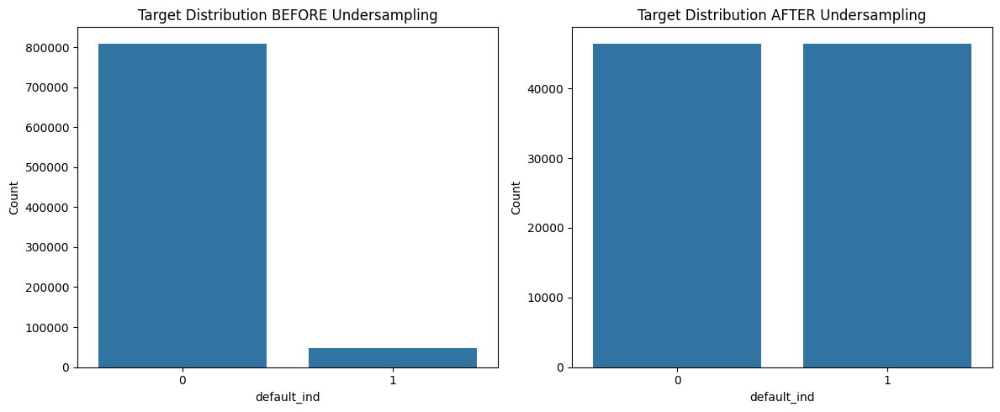

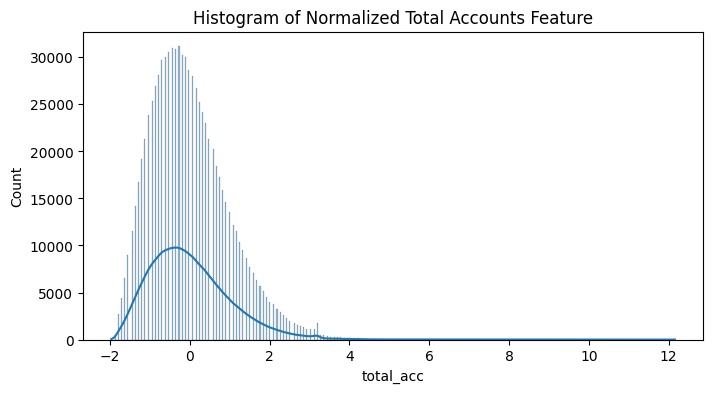

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot class distribution before and after undersampling
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Before undersampling
sns.countplot(x=y, ax=axs[0])
axs[0].set_title("Target Distribution BEFORE Undersampling")
axs[0].set_xlabel("default_ind")
axs[0].set_ylabel("Count")

# After undersampling
sns.countplot(x=y_resampled, ax=axs[1])
axs[1].set_title("Target Distribution AFTER Undersampling")
axs[1].set_xlabel("default_ind")
axs[1].set_ylabel("Count")

plt.tight_layout()
plt.show()

# Plot example of normalization
plt.figure(figsize=(8,4))
sns.histplot(df_clean['total_acc'], kde=True)
plt.title("Histogram of Normalized Total Accounts Feature")
plt.show()


In [ ]:
import pandas as pd

print("\n" + "="*60)
print("CLEANED DATA SAMPLE")
print("="*60)

with pd.option_context('display.max_columns', None):
    print(df_clean.drop(columns=['default_ind']).head())


CLEANED DATA SAMPLE
   loan_amnt  int_rate     grade  sub_grade  emp_length  annual_inc       dti  \
0  -1.156698 -0.581985 -0.596218  -0.752646    1.028757   -0.794704  0.546834   
1  -1.453422  0.475620  0.170277   0.332167   -1.692526   -0.701340 -0.982699   
2  -1.465291  0.633574  0.170277   0.487140    1.028757   -0.977511 -0.539622   
3  -0.563250  0.068145  0.170277  -0.132753    1.028757   -0.402574  0.107775   
4  -1.394078 -0.114990 -0.596218  -0.287726   -1.420398    0.076696 -0.010455   

   delinq_2yrs  inq_last_6mths  open_acc   pub_rec  revol_bal  revol_util  \
0    -0.363538        0.330990 -1.609326 -0.334495  -0.146804    1.204776   
1    -0.363538        4.480228 -1.609326 -0.334495  -0.685012   -1.916368   
2    -0.363538        1.368299 -1.797718 -0.334495  -0.627911    1.826484   
3    -0.363538        0.330990 -0.290584 -0.334495  -0.509029   -1.429083   
4    -0.363538       -0.706319  0.651374 -0.334495   0.489228   -0.047042   

   total_acc  total_rev_hi_li

In [ ]:
X_train, X_temp, y_train, y_temp = train_test_split(
    X_resampled, y_resampled,
    test_size=0.30,
    random_state=42,
    stratify=y_resampled
)

# Split temp into 50% validation, 50% test
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=42,
    stratify=y_temp
)

print(f"Train class distribution:\n{y_train.value_counts(normalize=False)}")
print(f"\nValidation class distribution:\n{y_val.value_counts(normalize=False)}")
print(f"\nTest class distribution:\n{y_test.value_counts(normalize=False)}")

Train class distribution:
default_ind
1    32527
0    32526
Name: count, dtype: int64

Validation class distribution:
default_ind
1    6970
0    6970
Name: count, dtype: int64

Test class distribution:
default_ind
0    6971
1    6970
Name: count, dtype: int64


In [ ]:
df_resampled = X_resampled.copy()
df_resampled['default_ind'] = y_resampled

df_train, df_temp = train_test_split(
    df_resampled,
    test_size=0.30,
    stratify=df_resampled['default_ind'],
    random_state=42
)

df_val, df_test = train_test_split(
    df_temp,
    test_size=0.5,
    stratify=df_temp['default_ind'],
    random_state=42
)

# Save to CSV files
df_train.to_csv('train_cleaned.csv', index=False)
df_val.to_csv('val_cleaned.csv', index=False)
df_test.to_csv('test_cleaned.csv', index=False)

In [ ]:
for col in df_clean.columns:
    print(col)

loan_amnt
int_rate
grade
sub_grade
emp_length
annual_inc
dti
delinq_2yrs
inq_last_6mths
open_acc
pub_rec
revol_bal
revol_util
total_acc
total_rev_hi_lim
default_ind
total_rev_hi_lim_missing
revol_util_missing
issue_d_year
issue_d_month
issue_d_days_since
earliest_cr_line_year
earliest_cr_line_month
earliest_cr_line_days_since
term_ 60 months
home_ownership_MORTGAGE
home_ownership_NONE
home_ownership_OTHER
home_ownership_OWN
home_ownership_RENT
verification_status_Source Verified
verification_status_Verified
pymnt_plan_y
purpose_credit_card
purpose_debt_consolidation
purpose_educational
purpose_home_improvement
purpose_house
purpose_major_purchase
purpose_medical
purpose_moving
purpose_other
purpose_renewable_energy
purpose_small_business
purpose_vacation
purpose_wedding
application_type_JOINT


Training AUC-ROC Score: 0.8128
Training Classification Report
              precision    recall  f1-score   support

           0   0.739690  0.735596  0.737637     32526
           1   0.737059  0.741138  0.739093     32527

    accuracy                       0.738367     65053
   macro avg   0.738374  0.738367  0.738365     65053
weighted avg   0.738374  0.738367  0.738365     65053


Validation AUC-ROC Score: 0.8167
Validation Classification Report
              precision    recall  f1-score   support

           0   0.740603  0.740603  0.740603      6970
           1   0.740603  0.740603  0.740603      6970

    accuracy                       0.740603     13940
   macro avg   0.740603  0.740603  0.740603     13940
weighted avg   0.740603  0.740603  0.740603     13940


Testing AUC-ROC Score: 0.8120
Testing Classification Report
              precision    recall  f1-score   support

           0   0.740344  0.734184  0.737252      6971
           1   0.736340  0.742468  0.739391    

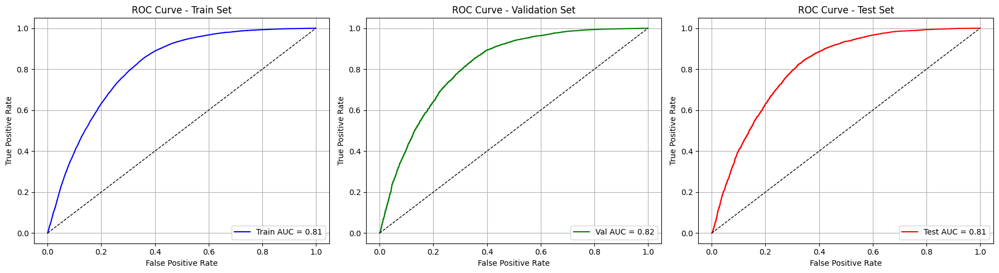

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, classification_report, roc_curve, auc
import matplotlib.pyplot as plt

# Logistic regression model with 1000 iterations
logreg_model = LogisticRegression(class_weight='balanced', max_iter=1000)
logreg_model.fit(X_train, y_train)

# Do predictions and probabilities on train, validation, and test datasets
y_train_probs = logreg_model.predict_proba(X_train)[:, 1]
y_train_preds = logreg_model.predict(X_train)

y_val_probs = logreg_model.predict_proba(X_val)[:, 1]
y_val_preds = logreg_model.predict(X_val)

y_test_probs = logreg_model.predict_proba(X_test)[:, 1]
y_test_preds = logreg_model.predict(X_test)

# Calculate auc-roc score
auc_score1 = roc_auc_score(y_train, y_train_probs)
auc_score2 = roc_auc_score(y_val, y_val_probs)
auc_score3 = roc_auc_score(y_test, y_test_probs)

print(f"Training AUC-ROC Score: {auc_score1:.4f}")
print("Training Classification Report")
print(classification_report(y_train, y_train_preds, digits=6))

print(f"\nValidation AUC-ROC Score: {auc_score2:.4f}")
print("Validation Classification Report")
print(classification_report(y_val, y_val_preds, digits=6))

print(f"\nTesting AUC-ROC Score: {auc_score3:.4f}")
print("Testing Classification Report")
print(classification_report(y_test, y_test_preds, digits=6))

# Calculate false positive rate and true positive rate
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_probs)
fpr_val, tpr_val, _ = roc_curve(y_val, y_val_probs)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_probs)

# Graph 3 auc-roc curves for training, validation, and testing
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

axs[0].plot(fpr_train, tpr_train, color='blue', label=f'Train AUC = {auc_score1:.2f}')
axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0].set_title('ROC Curve - Train Set')
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].legend(loc='lower right')
axs[0].grid(True)

axs[1].plot(fpr_val, tpr_val, color='green', label=f'Val AUC = {auc_score2:.2f}')
axs[1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[1].set_title('ROC Curve - Validation Set')
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].legend(loc='lower right')
axs[1].grid(True)

axs[2].plot(fpr_test, tpr_test, color='red', label=f'Test AUC = {auc_score3:.2f}')
axs[2].plot([0, 1], [0, 1], 'k--', lw=1)
axs[2].set_title('ROC Curve - Test Set')
axs[2].set_xlabel('False Positive Rate')
axs[2].set_ylabel('True Positive Rate')
axs[2].legend(loc='lower right')
axs[2].grid(True)

plt.tight_layout()
plt.show()

Subset Test AUC-ROC Score: 0.7732
Subset Test Classification Report:
              precision    recall  f1-score   support

           0   0.729454  0.645531  0.684932      6971
           1   0.682064  0.760545  0.719170      6970

    accuracy                       0.703034     13941
   macro avg   0.705759  0.703038  0.702051     13941
weighted avg   0.705760  0.703034  0.702049     13941



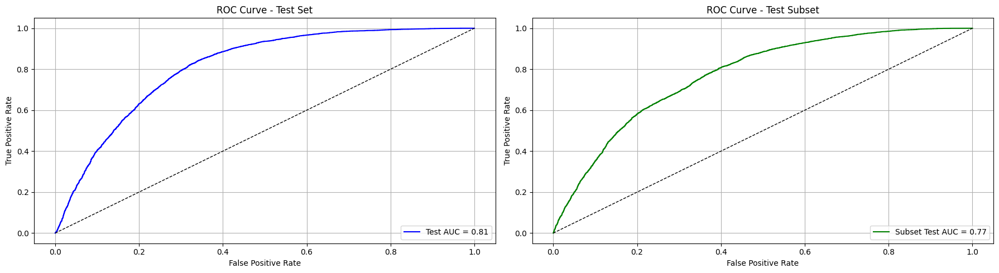

In [ ]:
# List of features to remove to simulate limited information
features_to_remove = [
    'grade', 'sub_grade'
]

# Drop features from original test dataset
X_test_subset = X_test.drop(columns=features_to_remove, errors='ignore')

# Make sure the columns are aligned in reduced test dataset
X_test_subset_aligned = X_test_subset.reindex(columns=X_train.columns, fill_value=0)

# Do predictions and probabilities on dataset
y_test_subset_probs = logreg_model.predict_proba(X_test_subset_aligned)[:, 1]
y_test_subset_preds = logreg_model.predict(X_test_subset_aligned)

# Calculate roc-auc score
auc_score4 = roc_auc_score(y_test, y_test_subset_probs)

print(f"Subset Test AUC-ROC Score: {auc_score4:.4f}")
print("Subset Test Classification Report:")
print(classification_report(y_test, y_test_subset_preds, digits=6))

# Calculate false positive rate and true positive rate
fpr_test_subset, tpr_test_subset, _ = roc_curve(y_test, y_test_subset_probs)
roc_auc_test_subset = auc(fpr_test_subset, tpr_test_subset)

# Graph test and test subset roc-auc curves
fig, axs = plt.subplots(1, 2, figsize=(18, 5))

axs[0].plot(fpr_test, tpr_test, color='blue', label=f'Test AUC = {auc_score3:.2f}')
axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0].set_title('ROC Curve - Test Set')
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].legend(loc='lower right')
axs[0].grid(True)

axs[1].plot(fpr_test_subset, tpr_test_subset, color='green', label=f'Subset Test AUC = {auc_score4:.2f}')
axs[1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[1].set_title('ROC Curve - Test Subset')
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].legend(loc='lower right')
axs[1].grid(True)

plt.tight_layout()
plt.show()


Now onto our Deep Learning model. To recap, we are going to use both deep learning and attention to learn feature importance and nonlinear patterns in tabular financial data and hopefully predict credit loan defaults.

** It has two Parallel Branches:**

#### 1. Attention Branch

* Applies multi-head attention to features
* Learns which features to focus on for each prediction
* Outputs weighted feature representations

#### 2. MLP Branch

* Stack of dense layers (e.g., 3–5 layers)
* Models non-linear interactions
* Uses ReLU activations + dropout for regularization


Then we combines outputs from Attention + MLP (e.g., via concatenation). The merged features are passed to final layers. The output (thanks to Sigmoid activation) will predict the probability of default. We will be computing loss with binary cross entropy and looking at metrics like AUC-ROC, precision, recall

1. Data Preparation

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader, random_split
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

class TabularDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32)
        self.y = torch.tensor(y.values, dtype=torch.float32).unsqueeze(1)  # Shape (N, 1)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


def prepare_data(df_resampled):
    #  Separate features and target
    X = df_resampled.drop(columns=['default_ind'])
    y = df_resampled['default_ind']

    # Train/Val/Test split (70/15/15) with stratification. WE could have gone with 80/10/10 too.
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.30, stratify=y, random_state=42
    )
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=42
    )

    # Standardize features (fit on train only)
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X.columns)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X.columns)
    X_test_subset_scaled = pd.DataFrame(scaler.transform(X_test_subset_aligned), columns=X.columns)

    # Wrap in PyTorch Dataset
    train_dataset = TabularDataset(X_train_scaled, y_train)
    val_dataset = TabularDataset(X_val_scaled, y_val)
    test_dataset = TabularDataset(X_test_scaled, y_test)
    test_subset_dataset = TabularDataset(X_test_subset_scaled, y_test)

    return train_dataset, val_dataset, test_dataset, test_subset_dataset, X.columns.tolist()

def create_loaders(train_dataset, val_dataset, test_dataset, test_subset_dataset, batch_size=64):
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    test_subset_loader = DataLoader(test_subset_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader, test_loader, test_subset_loader


We're going to build the model now

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class AttentionBranch(nn.Module):
    def __init__(self, input_dim, embed_dim=32, num_heads=4, dropout=0.1):
        super(AttentionBranch, self).__init__()
        self.input_dim = input_dim      # Number of features
        self.embed_dim = embed_dim      # Embedding size per feature
        self.num_heads = num_heads

        # 1. Feature embedding layer: project each scalar feature to a vector
        # Input: (batch_size, input_dim) → Output: (batch_size, input_dim, embed_dim)
        self.feature_embedding = nn.Linear(1, embed_dim)

        # 2. Multi-head self-attention layer
        # PyTorch MultiheadAttention expects shape: (seq_len, batch, embed_dim)
        self.attention = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=num_heads, dropout=dropout)

        # 3. Final projection after attention (optional)
        self.output_proj = nn.Linear(embed_dim, embed_dim)

        self.dropout = nn.Dropout(dropout)
        self.layernorm = nn.LayerNorm(embed_dim)

    def forward(self, x):
        """
        x: Tensor of shape (batch_size, input_dim)
        """
        batch_size, input_dim = x.shape

        # Step 1: Embed each feature separately

        # Reshape to (batch_size * input_dim, 1) to embed each scalar feature
        x_reshaped = x.view(-1, 1)  # (batch_size*input_dim, 1)
        embedded = self.feature_embedding(x_reshaped)  # (batch_size*input_dim, embed_dim)
        embedded = embedded.view(batch_size, input_dim, self.embed_dim)  # (batch_size, input_dim, embed_dim)

        embedded = embedded.permute(1, 0, 2)  # (input_dim, batch_size, embed_dim)

        attn_output, attn_weights = self.attention(embedded, embedded, embedded)
        # attn_output shape: (input_dim, batch_size, embed_dim)

        attn_output = self.dropout(attn_output)
        out = self.layernorm(attn_output + embedded)  # (input_dim, batch_size, embed_dim)

        out = self.output_proj(out)  # (input_dim, batch_size, embed_dim)
        out = out.permute(1, 0, 2).contiguous()  # (batch_size, input_dim, embed_dim)
        out = out.view(batch_size, -1)  # flatten all features: (batch_size, input_dim * embed_dim)

        return out, attn_weights  # return output and attention weights for interpretability


# MLP branch: stack of fully connected layers with ReLU and dropout
class MLPBranch(nn.Module):
    def __init__(self, input_dim, hidden_dims=[64, 32, 16], dropout=0.1):
        super(MLPBranch, self).__init__()
        layers = []
        in_dim = input_dim

        for h_dim in hidden_dims:
            layers.append(nn.Linear(in_dim, h_dim))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout))
            in_dim = h_dim

        self.mlp = nn.Sequential(*layers)

    def forward(self, x):
        return self.mlp(x)  # (batch_size, last_hidden_dim)

class HybridAttentionNet(nn.Module):
    def __init__(
        self,
        input_dim,
        embed_dim=32,
        num_heads=4,
        mlp_hidden_dims=[64, 32, 16],
        dropout=0.1,
    ):
        super(HybridAttentionNet, self).__init__()

        # Attention branch
        self.attention_branch = AttentionBranch(input_dim, embed_dim, num_heads, dropout)

        # MLP branch
        self.mlp_branch = MLPBranch(input_dim, mlp_hidden_dims, dropout)

        # Fusion layer: combine attention output and MLP output
        fusion_input_dim = input_dim * embed_dim + mlp_hidden_dims[-1]
        self.fusion_layer = nn.Sequential(
            nn.Linear(fusion_input_dim, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 1),  # final output = probability of default
            nn.Sigmoid(),
        )

    def forward(self, x):
        # Attention branch output (flattened)
        attn_out, attn_weights = self.attention_branch(x)  # (batch_size, input_dim * embed_dim)

        # MLP branch output
        mlp_out = self.mlp_branch(x)  # (batch_size, last_hidden_dim)

        # Concatenate features from both branches
        combined = torch.cat([attn_out, mlp_out], dim=1)  # (batch_size, fusion_input_dim)

        # Pass through fusion layers to get final probability
        output = self.fusion_layer(combined)  # (batch_size, 1)

        return output, attn_weights  # output


Now let's test our model

In [ ]:
import torch
import torch.nn as nn
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score

def train_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    all_preds = []
    all_targets = []

    for X_batch, y_batch in dataloader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        outputs, _ = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X_batch.size(0)
        all_preds.append(outputs.detach().cpu())
        all_targets.append(y_batch.detach().cpu())

    epoch_loss = running_loss / len(dataloader.dataset)
    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_preds_label = (all_preds >= 0.5).astype(int)

    epoch_auc = roc_auc_score(all_targets, all_preds)
    epoch_precision = precision_score(all_targets, all_preds_label)
    epoch_recall = recall_score(all_targets, all_preds_label)
    epoch_accuracy = accuracy_score(all_targets, all_preds_label)


    return epoch_loss, epoch_auc, epoch_precision, epoch_recall, epoch_accuracy

def eval_epoch(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs, _ = model(X_batch)
            loss = criterion(outputs, y_batch)

            running_loss += loss.item() * X_batch.size(0)
            all_preds.append(outputs.cpu())
            all_targets.append(y_batch.cpu())

    epoch_loss = running_loss / len(dataloader.dataset)
    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_preds_label = (all_preds >= 0.5).astype(int)

    epoch_auc = roc_auc_score(all_targets, all_preds)
    epoch_precision = precision_score(all_targets, all_preds_label)
    epoch_recall = recall_score(all_targets, all_preds_label)
    epoch_accuracy = accuracy_score(all_targets, all_preds_label)


    return epoch_loss, epoch_auc, epoch_precision, epoch_recall, epoch_accuracy

def train_model(
    model,
    train_loader,
    val_loader,
    n_epochs=20,
    lr=1e-3,
    device=None,
    save_path="best_model.pth"
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCELoss()
    history = {
        'train_loss': [],
        'train_auc': [],
        'train_acc': [],
        'val_loss': [],
        'val_auc': [],
        'val_acc': []
    }

    best_val_auc = 0.0

    for epoch in range(1, n_epochs + 1):
        train_loss, train_auc, train_prec, train_rec, train_acc = train_epoch(model, train_loader, optimizer, criterion, device)
        val_loss, val_auc, val_prec, val_rec, val_acc = eval_epoch(model, val_loader, criterion, device)

        history['train_loss'].append(train_loss)
        history['train_auc'].append(train_auc)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_auc'].append(val_auc)
        history['val_acc'].append(val_acc)

        print(
            f"Epoch {epoch}/{n_epochs} | "
            f"Train Loss: {train_loss:.4f} | Train AUC: {train_auc:.4f} | Train Precision: {train_prec:.4f} | Train Recall: {train_rec:.4f} | Train Accuracy: {train_acc:.4f} || "
            f"Val Loss: {val_loss:.4f} | Val AUC: {val_auc:.4f} | Val Precision: {val_prec:.4f} | Val Recall: {val_rec:.4f} | Val Accuracy: {val_acc:.4f}"
        )

        # Save model if validation AUC improves
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            torch.save(model.state_dict(), save_path)
            print(f"--> Saved best model with Val AUC: {best_val_auc:.4f}")

    print("Training complete.")
    print(f"Best Val AUC: {best_val_auc:.4f}")

    # Load best model weights before returning
    model.load_state_dict(torch.load(save_path))
    return model, history

In [ ]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score
import torch


def test_model(model, test_loader, device):
    model.eval()
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs, _ = model(X_batch)
            all_preds.append(outputs.cpu())
            all_targets.append(y_batch.cpu())

    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_preds_label = (all_preds >= 0.5).astype(int)

    auc = roc_auc_score(all_targets, all_preds)
    precision = precision_score(all_targets, all_preds_label)
    recall = recall_score(all_targets, all_preds_label)
    accuracy = accuracy_score(all_targets, all_preds_label)

    print(f"Test AUC: {auc:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Full Model:")
test_model(trained_model, test_loader, device)
print("Subset Model:")
test_model(trained_model, test_subset_loader, device)

Full Model:


NameError: name 'trained_model' is not defined

In [ ]:
train_dataset, val_dataset, test_dataset, test_subset_dataset, feature_names = prepare_data(df_resampled)
train_loader, val_loader, test_loader, test_subset_loader = create_loaders(train_dataset, val_dataset, test_dataset, test_subset_dataset)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Step 1: Prepare data
train_dataset, val_dataset, test_dataset, test_subset_dataset, feature_names = prepare_data(df_resampled)
train_loader, val_loader, test_loader, test_subset_loader = create_loaders(train_dataset, val_dataset, test_dataset, test_subset_dataset)

# Step 2: Initialize model
model = HybridAttentionNet(input_dim=len(feature_names))

# Step 3: Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Step 4: Train model
trained_model, history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    n_epochs=20,
    lr=1e-3,
    device=device,
    save_path="best_model.pth"
)

# Step 5: Test model
print("Testing on full test set:")
test_model(trained_model, test_loader, device)

print("Testing on subset test set:")
test_model(trained_model, test_subset_loader, device)


Using device: cuda


KeyboardInterrupt: 

Quant results above. It exceeeds the baseline of AUC > 0.8 but we want to improve these metrics later.

In [ ]:
import os
import random
import torch
import pickle
import numpy as np
import matplotlib.pyplot as plt

def calculate_fit_metrics(epochs, values):
    coeffs = np.polyfit(epochs, values, 1)
    fit_line = np.polyval(coeffs, epochs)
    residuals = np.array(values) - fit_line
    r2 = 1 - (np.sum(residuals**2) / np.sum((np.array(values) - np.mean(values))**2))
    equation = f"y = {coeffs[0]:.4f}x + {coeffs[1]:.4f}"
    return r2, residuals, equation, fit_line

def plot_loss_and_auc_with_fit(history):
    epochs = np.arange(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12, 6))

    # Loss subplot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss per Epoch')
    plt.legend()
    plt.grid(True)

    # Auc subplot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_auc'], label='Train AUC', color='blue')
    plt.plot(epochs, history['val_auc'], label='Val AUC', color='orange')

    train_r2, train_res, train_eq, train_fit = calculate_fit_metrics(epochs, history['train_auc'])
    val_r2, val_res, val_eq, val_fit = calculate_fit_metrics(epochs, history['val_auc'])

    plt.plot(epochs, train_fit, '--', color='blue', label=f'Train Fit (R²={train_r2:.3f})')
    plt.plot(epochs, val_fit, '--', color='orange', label=f'Val Fit (R²={val_r2:.3f})')

    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.title('AUC per Epoch with Best Fit Lines')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return {
        'train_r2': train_r2,
        'train_residuals': train_res,
        'train_equation': train_eq,
        'val_r2': val_r2,
        'val_residuals': val_res,
        'val_equation': val_eq
    }

In [ ]:
plot_loss_and_auc_with_fit(history)

In [ ]:
def get_preds_probs_labels(model, dataloader, device):
    model.eval()
    all_probs, all_targets = [], []
    with torch.no_grad():
        for X, y in dataloader:
            X = X.to(device)
            outputs, _ = model(X)
            all_probs.append(outputs.cpu())
            all_targets.append(y)
    probs = torch.cat(all_probs).numpy().flatten()
    targets = torch.cat(all_targets).numpy().flatten()
    preds = (probs >= 0.5).astype(int)
    return targets, probs, preds

def print_metrics_and_plot_roc(model, train_loader, val_loader, test_loader, device):
    y_train, y_train_probs, y_train_preds = get_preds_probs_labels(model, train_loader, device)
    y_val, y_val_probs, y_val_preds = get_preds_probs_labels(model, val_loader, device)
    y_test, y_test_probs, y_test_preds = get_preds_probs_labels(model, test_loader, device)
    y_test_subset, y_test_subset_probs, y_test_subset_preds = get_preds_probs_labels(model, test_subset_loader, device)

    # Print metrics
    for name, y_true, y_prob, y_pred in [
        ("Training", y_train, y_train_probs, y_train_preds),
        ("Validation", y_val, y_val_probs, y_val_preds),
        ("Testing", y_test, y_test_probs, y_test_preds),
        ("Subset Testing", y_test_subset, y_test_subset_probs, y_test_subset_preds)
    ]:
        auc_score = roc_auc_score(y_true, y_prob)
        print(f"{name} AUC-ROC Score: {auc_score:.4f}")
        print(f"{name} Classification Report:")
        print(classification_report(y_true, y_pred, digits=6))
        print()

    # Compute ROC curves
    fpr_train, tpr_train, _ = roc_curve(y_train, y_train_probs)
    fpr_val, tpr_val, _ = roc_curve(y_val, y_val_probs)
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_probs)
    fpr_test_subset, tpr_test_subset, _ = roc_curve(y_test_subset, y_test_subset_probs)

    # Plot
    fig, axs = plt.subplots(1, 2, figsize=(18, 5))

    axs[0].plot(fpr_train, tpr_train, color='blue', label=f'Train AUC = {roc_auc_score(y_train, y_train_probs):.2f}')
    axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[0].set_title('ROC Curve - Train Set')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].legend(loc='lower right')
    axs[0].grid(True)

    axs[1].plot(fpr_val, tpr_val, color='green', label=f'Val AUC = {roc_auc_score(y_val, y_val_probs):.2f}')
    axs[1].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[1].set_title('ROC Curve - Validation Set')
    axs[1].set_xlabel('False Positive Rate')
    axs[1].set_ylabel('True Positive Rate')
    axs[1].legend(loc='lower right')
    axs[1].grid(True)

    fig, axs = plt.subplots(1, 2, figsize=(18, 5))

    axs[0].plot(fpr_test, tpr_test, color='red', label=f'Test AUC = {roc_auc_score(y_test, y_test_probs):.2f}')
    axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[0].set_title('ROC Curve - Test Set')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].legend(loc='lower right')
    axs[0].grid(True)

    axs[1].plot(fpr_test_subset, tpr_test_subset, color='orange', label=f'Subset Test AUC = {roc_auc_score(y_test_subset, y_test_subset_probs):.2f}')
    axs[1].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[1].set_title('ROC Curve - Subset Test Set')
    axs[1].set_xlabel('False Positive Rate')
    axs[1].set_ylabel('True Positive Rate')
    axs[1].legend(loc='lower right')
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
print_metrics_and_plot_roc(trained_model, train_loader, val_loader, test_loader, device)

Now let's look at which features get the most attention

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def get_average_attention_weights(model, dataloader, device, feature_names):
    model.eval()
    total_attn_weights = []

    with torch.no_grad():
        for X_batch, _ in dataloader:
            X_batch = X_batch.to(device)
            _, attn_weights = model(X_batch)  # (batch_size, num_features, num_features)
            attn_weights = attn_weights.mean(dim=1)  # mean over all heads: (batch_size, num_features)
            total_attn_weights.append(attn_weights.cpu())

    # Stack and average over all batches
    all_weights = torch.cat(total_attn_weights, dim=0).numpy()  # (num_samples, num_features)
    avg_weights = np.mean(all_weights, axis=0)  # (num_features,)

    return avg_weights

In [ ]:
# Compute average attention
avg_attn_weights = get_average_attention_weights(trained_model, test_loader, device, feature_names)

#  Plot
plt.figure(figsize=(12, 10))
plt.barh(feature_names, avg_attn_weights)
plt.xlabel("Average Attention Weight")
plt.title("Feature Importance via Attention Weights on Full Model")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

NameError: name 'trained_model' is not defined

It looks like the features that got the most attention were earliest_cr_line_year, issued_year and emp_length.

Code for implementing random search

In [ ]:
def random_search(input_dim, device, possible_structures=None, n_trials=10, save_dir=None):
    best_auc = 0
    best_config = None
    best_model = None
    trial_summaries = []

    hidden_dim_options = [8, 16, 32, 64, 128, 256, 512]
    low_range = list(range(10, 35, 5))
    high_range = list(range(35, 71, 5))
    choices = low_range * 2 + high_range

    if possible_structures is None:
        possible_structures = []
        for batch_size in [16, 32, 64, 128, 256, 512]:
            for embed_dim in [16, 32, 64, 128, 256, 512]:
                for num_heads in [2, 4, 8, 16]:
                    for num_dims in [2, 3, 4, 5]:
                        start_idx = random.randint(0, len(hidden_dim_options) - num_dims)
                        mlp_hidden_dims = hidden_dim_options[start_idx:start_idx + num_dims]
                        possible_structures.append((batch_size, embed_dim, num_heads, tuple(mlp_hidden_dims)))

    for trial in range(n_trials):
        if not possible_structures:
            print("No more possible configurations left.")
            break

        batch_size, embed_dim, num_heads, mlp_hidden_dims = random.choice(possible_structures)
        dropout = round(random.uniform(0.1, 0.8), 3)
        lr = round(random.uniform(1e-4, 1e-2), 6)
        epochs = random.choice(choices)

        print(f"\nTrial {trial+1}/{n_trials}")
        print(f"batch_size={batch_size}, embed_dim={embed_dim}, num_heads={num_heads}, dropout={dropout}, "
              f"mlp_hidden_dims={mlp_hidden_dims}, lr={lr}, epochs={epochs}")

        # --- Your existing data prep and model training code ---
        train_loader, val_loader, test_loader, test_subset_loader = create_loaders(train_dataset, val_dataset, test_dataset, test_subset_dataset, batch_size)
        model = HybridAttentionNet(input_dim=input_dim, embed_dim=embed_dim, num_heads=num_heads,
                                   mlp_hidden_dims=list(mlp_hidden_dims), dropout=dropout)

        trained_model, history = train_model(model=model, train_loader=train_loader, val_loader=val_loader,
                                             n_epochs=epochs, lr=lr, device=device,
                                             save_path=f"model_trial{trial+1}.pth")

        metrics = plot_loss_and_auc_with_fit(history)

        train_below = sum(acc < 0.65 for acc in history['train_acc']) / len(history['train_acc'])
        val_below = sum(acc < 0.65 for acc in history['val_acc']) / len(history['val_acc'])
        removed = False

        if train_below > 0.75 and val_below > 0.75:
            possible_structures.remove((batch_size, embed_dim, num_heads, mlp_hidden_dims))
            removed = True
            print(f"Removed structure: batch_size={batch_size}, embed_dim={embed_dim}, num_heads={num_heads}, "
                  f"mlp_hidden_dims={mlp_hidden_dims}")

        val_auc = max(history['val_auc'])
        trial_summary = {
            'trial': trial + 1,
            'params': {
                'batch_size': batch_size,
                'embed_dim': embed_dim,
                'num_heads': num_heads,
                'dropout': dropout,
                'mlp_hidden_dims': list(mlp_hidden_dims),
                'lr': lr,
                'epochs': epochs
            },
            'val_auc': val_auc,
            'metrics': metrics,
            'history': history,   # Save full training history for re-plotting
            'removed': removed
        }
        trial_summaries.append(trial_summary)

        if val_auc > best_auc:
            best_auc = val_auc
            best_model = trained_model
            best_config = trial_summary

        if save_dir:
          os.makedirs(save_dir, exist_ok=True)
          torch.save(best_model.state_dict(), os.path.join(save_dir, 'best_model.pth'))
          with open(os.path.join(save_dir, 'trial_summaries.pkl'), 'wb') as f:
              pickle.dump(trial_summaries, f)
          with open(os.path.join(save_dir, 'possible_structures.pkl'), 'wb') as f:
              pickle.dump(possible_structures, f)
          print(f"\nSaved model and trial summaries to '{save_dir}'")

    print("\n=== Trial Summary ===")
    for summary in trial_summaries:
        print(f"\nTrial {summary['trial']} — Removed: {summary['removed']}")
        print(f"Params: {summary['params']}")
        print(f"Val AUC: {summary['val_auc']:.4f}")
        print(f"Train Fit: {summary['metrics']['train_equation']}, R²={summary['metrics']['train_r2']:.4f}")
        print(f"Val Fit:   {summary['metrics']['val_equation']}, R²={summary['metrics']['val_r2']:.4f}")
        print(f"Train Residuals (first 5): {summary['metrics']['train_residuals'][:5]}")
        print(f"Val Residuals   (first 5): {summary['metrics']['val_residuals'][:5]}")

    print("\nBest Trial:")
    if best_config is not None:
        trial_num = best_config['trial']
        params = best_config['params']
        max_train_auc = max(best_config['history']['train_auc'])
        max_val_auc = max(best_config['history']['val_auc'])
        print(f"Trial Number: {trial_num}")
        print(f"Hyperparameters: {params}")
        print(f"Max Train AUC: {max_train_auc:.4f}")
        print(f"Max Validation AUC: {max_val_auc:.4f}")
    else:
        print("No best trial found.")

    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        torch.save(best_model.state_dict(), os.path.join(save_dir, 'best_model.pth'))
        with open(os.path.join(save_dir, 'trial_summaries.pkl'), 'wb') as f:
            pickle.dump(trial_summaries, f)
        with open(os.path.join(save_dir, 'possible_structures.pkl'), 'wb') as f:
            pickle.dump(possible_structures, f)
        print(f"\nSaved best model and trial summaries to '{save_dir}'")

    return best_model, best_config, trial_summaries, possible_structures

In [ ]:
def load_experiment(save_dir, model_class, input_dim, device):
    model = model_class(input_dim=input_dim)
    model.load_state_dict(torch.load(os.path.join(save_dir, 'best_model.pth'), map_location=device))
    model.to(device)
    model.eval()

    with open(os.path.join(save_dir, 'trial_summaries.pkl'), 'rb') as f:
        trial_summaries = pickle.load(f)

    with open(os.path.join(save_dir, 'possible_structures.pkl'), 'rb') as f:
        possible_structures = pickle.load(f)

    print(f"Loaded data from {save_dir}")
    return model, trial_summaries, possible_structures

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Train model using this code

In [ ]:
import pickle
# If runtime disconnets - load possible_structures from last model
file_path = "/content/drive/MyDrive/model6/possible_structures.pkl"

with open(file_path, "rb") as f:
    possible_structures = pickle.load(f)


Trial 1/5
batch_size=32, embed_dim=32, num_heads=2, dropout=0.557, mlp_hidden_dims=(128, 256, 512), lr=0.007486, epochs=30
Using device: cpu
Epoch 1/30 | Train Loss: 0.6723 | Train AUC: 0.6215 | Train Precision: 0.5540 | Train Recall: 0.8179 | Train Accuracy: 0.5797 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/30 | Train Loss: 0.6935 | Train AUC: 0.4988 | Train Precision: 0.4995 | Train Recall: 0.4710 | Train Accuracy: 0.4995 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/30 | Train Loss: 0.6935 | Train AUC: 0.4962 | Train Precision: 0.4956 | Train Recall: 0.4919 | Train Accuracy: 0.4956 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/30 | Train Loss: 0.6933 | Train AUC: 0.5006 | Train Precision: 0.5004 | Train Recall: 0.5391 | Train Accuracy: 0

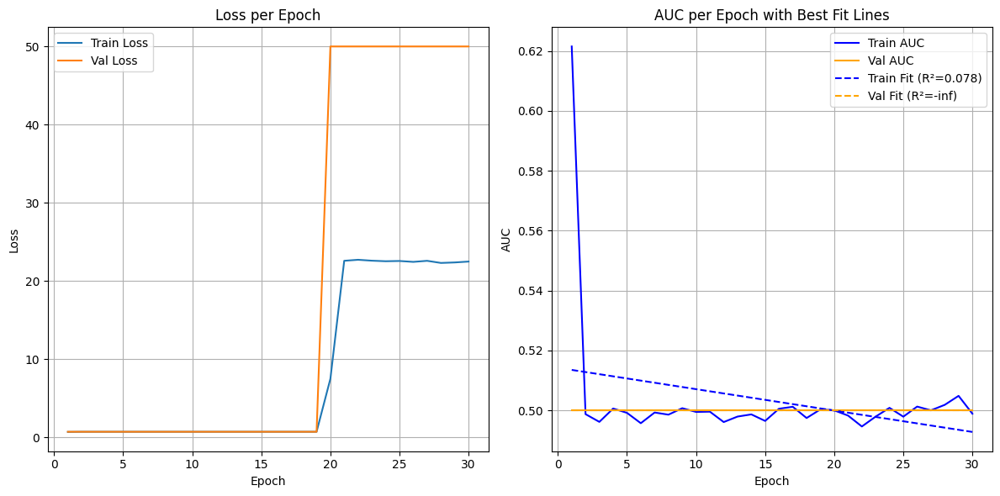

Removed structure: batch_size=32, embed_dim=32, num_heads=2, mlp_hidden_dims=(128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model1'

Trial 2/5
batch_size=32, embed_dim=128, num_heads=4, dropout=0.55, mlp_hidden_dims=(16, 32, 64), lr=0.003279, epochs=15
Using device: cpu
Epoch 1/15 | Train Loss: 0.5916 | Train AUC: 0.7582 | Train Precision: 0.6585 | Train Recall: 0.8292 | Train Accuracy: 0.6996 || Val Loss: 0.5805 | Val AUC: 0.8117 | Val Precision: 0.6458 | Val Recall: 0.9340 | Val Accuracy: 0.7109
--> Saved best model with Val AUC: 0.8117
Epoch 2/15 | Train Loss: 0.5827 | Train AUC: 0.7667 | Train Precision: 0.6631 | Train Recall: 0.8580 | Train Accuracy: 0.7110 || Val Loss: 0.5393 | Val AUC: 0.8170 | Val Precision: 0.6877 | Val Recall: 0.8964 | Val Accuracy: 0.7447
--> Saved best model with Val AUC: 0.8170
Epoch 3/15 | Train Loss: 0.5691 | Train AUC: 0.7784 | Train Precision: 0.6703 | Train Recall: 0.8743 | Train Accuracy: 0.7221 || Val Loss: 0.5318 | Val 

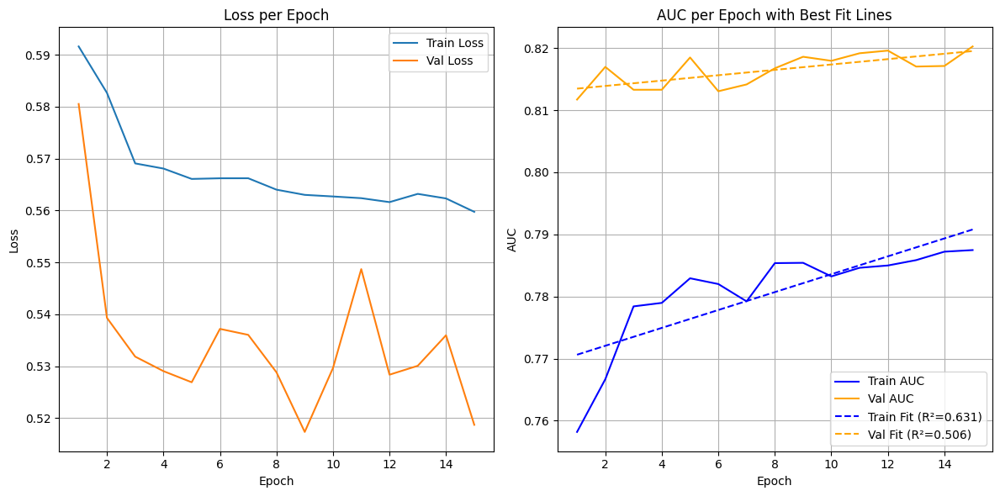


Saved model and trial summaries to '/content/drive/MyDrive/model1'

Trial 3/5
batch_size=64, embed_dim=128, num_heads=4, dropout=0.424, mlp_hidden_dims=(128, 256), lr=0.005988, epochs=35
Using device: cpu
Epoch 1/35 | Train Loss: 0.6525 | Train AUC: 0.7781 | Train Precision: 0.6813 | Train Recall: 0.8320 | Train Accuracy: 0.7214 || Val Loss: 0.5436 | Val AUC: 0.8188 | Val Precision: 0.6991 | Val Recall: 0.8650 | Val Accuracy: 0.7463
--> Saved best model with Val AUC: 0.8188
Epoch 2/35 | Train Loss: 0.5626 | Train AUC: 0.7877 | Train Precision: 0.6757 | Train Recall: 0.8667 | Train Accuracy: 0.7253 || Val Loss: 0.5380 | Val AUC: 0.8179 | Val Precision: 0.6575 | Val Recall: 0.9311 | Val Accuracy: 0.7230
Epoch 3/35 | Train Loss: 0.5579 | Train AUC: 0.7908 | Train Precision: 0.6775 | Train Recall: 0.8670 | Train Accuracy: 0.7272 || Val Loss: 0.5186 | Val AUC: 0.8216 | Val Precision: 0.7314 | Val Recall: 0.7970 | Val Accuracy: 0.7522
--> Saved best model with Val AUC: 0.8216
Epoch 4/35 | T

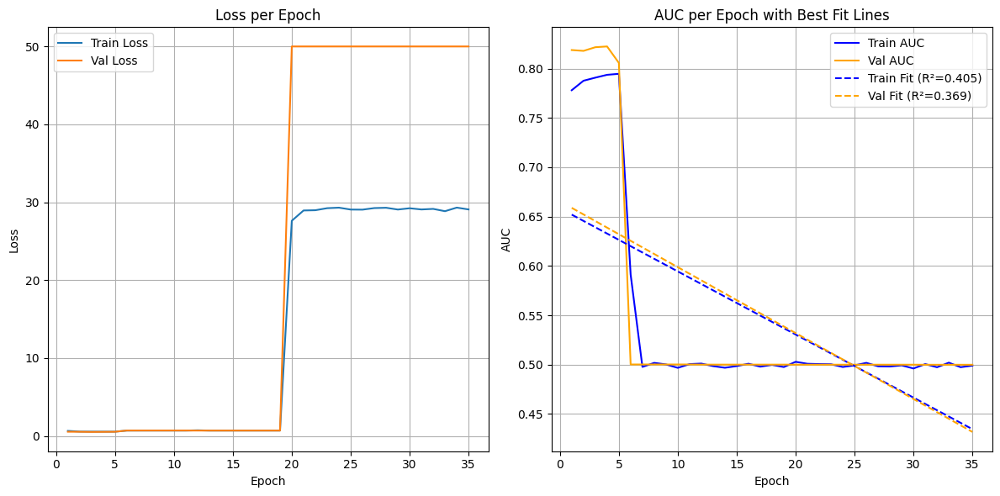

Removed structure: batch_size=64, embed_dim=128, num_heads=4, mlp_hidden_dims=(128, 256)

Saved model and trial summaries to '/content/drive/MyDrive/model1'

Trial 4/5
batch_size=32, embed_dim=256, num_heads=8, dropout=0.209, mlp_hidden_dims=(32, 64, 128, 256, 512), lr=0.00604, epochs=25
Using device: cpu
Epoch 1/25 | Train Loss: 49.8180 | Train AUC: 0.5002 | Train Precision: 0.4946 | Train Recall: 0.0028 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/25 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/25 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 

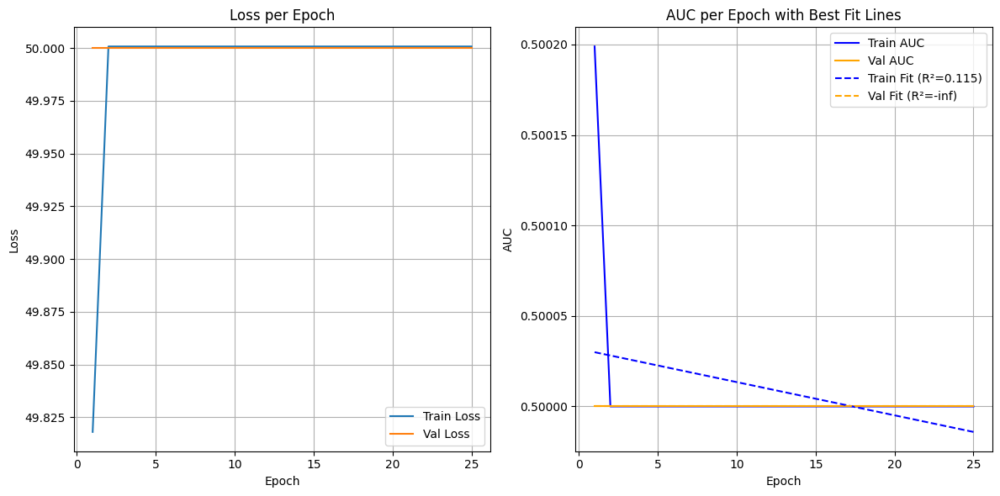

Removed structure: batch_size=32, embed_dim=256, num_heads=8, mlp_hidden_dims=(32, 64, 128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model1'

Trial 5/5
batch_size=16, embed_dim=32, num_heads=16, dropout=0.196, mlp_hidden_dims=(8, 16), lr=0.00711, epochs=35
Using device: cpu
Epoch 1/35 | Train Loss: 0.5522 | Train AUC: 0.7912 | Train Precision: 0.6946 | Train Recall: 0.8229 | Train Accuracy: 0.7306 || Val Loss: 0.5268 | Val AUC: 0.8187 | Val Precision: 0.6935 | Val Recall: 0.8785 | Val Accuracy: 0.7451
--> Saved best model with Val AUC: 0.8187
Epoch 2/35 | Train Loss: 0.5443 | Train AUC: 0.7968 | Train Precision: 0.6898 | Train Recall: 0.8469 | Train Accuracy: 0.7330 || Val Loss: 0.5289 | Val AUC: 0.8180 | Val Precision: 0.7098 | Val Recall: 0.8446 | Val Accuracy: 0.7496
Epoch 3/35 | Train Loss: 0.5452 | Train AUC: 0.7966 | Train Precision: 0.6880 | Train Recall: 0.8510 | Train Accuracy: 0.7326 || Val Loss: 0.5188 | Val AUC: 0.8182 | Val Precision: 0.7107 | 

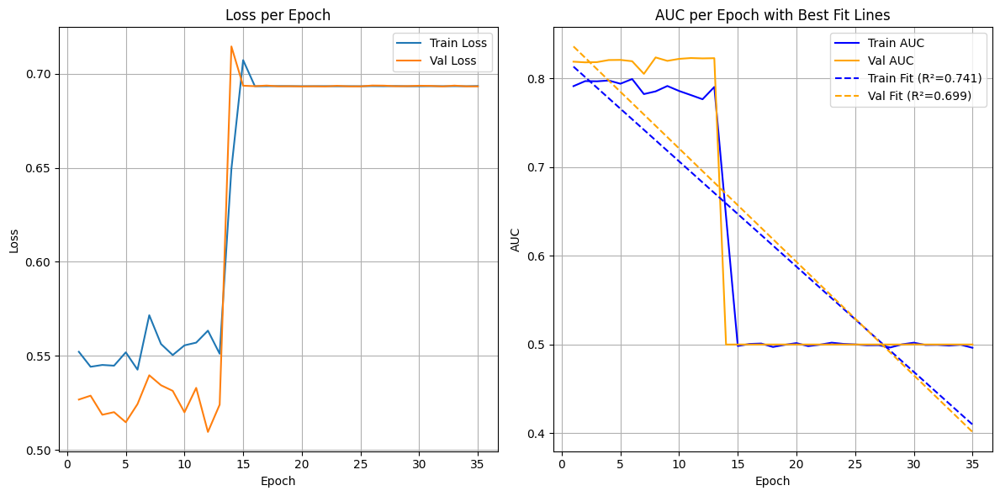


Saved model and trial summaries to '/content/drive/MyDrive/model1'

=== Trial Summary ===

Trial 1 — Removed: True
Params: {'batch_size': 32, 'embed_dim': 32, 'num_heads': 2, 'dropout': 0.557, 'mlp_hidden_dims': [128, 256, 512], 'lr': 0.007486, 'epochs': 30}
Val AUC: 0.5000
Train Fit: y = -0.0007x + 0.5143, R²=0.0784
Val Fit:   y = 0.0000x + 0.5000, R²=-inf
Train Residuals (first 5): [ 0.10799505 -0.01405781 -0.01592136 -0.01074978 -0.01148235]
Val Residuals   (first 5): [5.55111512e-17 5.55111512e-17 0.00000000e+00 0.00000000e+00
 0.00000000e+00]

Trial 2 — Removed: False
Params: {'batch_size': 32, 'embed_dim': 128, 'num_heads': 4, 'dropout': 0.55, 'mlp_hidden_dims': [16, 32, 64], 'lr': 0.003279, 'epochs': 15}
Val AUC: 0.8203
Train Fit: y = 0.0014x + 0.7692, R²=0.6315
Val Fit:   y = 0.0004x + 0.8130, R²=0.5062
Train Residuals (first 5): [-0.0124376  -0.00538478  0.00490338  0.00402618  0.006548  ]
Val Residuals   (first 5): [-0.00175915  0.00306717 -0.00104557 -0.00147345  0.00328666

In [ ]:
best_model1, best_config1, history1, possible_structures = random_search(input_dim=len(feature_names), device=device, possible_structures=possible_structures, n_trials=5, save_dir="/content/drive/MyDrive/model1")


Trial 1/20
batch_size=64, embed_dim=32, num_heads=16, dropout=0.446, mlp_hidden_dims=(64, 128), lr=0.009957, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5713 | Train AUC: 0.7790 | Train Precision: 0.6784 | Train Recall: 0.8296 | Train Accuracy: 0.7182 || Val Loss: 0.5267 | Val AUC: 0.8190 | Val Precision: 0.6910 | Val Recall: 0.8846 | Val Accuracy: 0.7445
--> Saved best model with Val AUC: 0.8190
Epoch 2/10 | Train Loss: 0.5643 | Train AUC: 0.7830 | Train Precision: 0.6724 | Train Recall: 0.8582 | Train Accuracy: 0.7201 || Val Loss: 0.5288 | Val AUC: 0.8134 | Val Precision: 0.6895 | Val Recall: 0.8871 | Val Accuracy: 0.7438
Epoch 3/10 | Train Loss: 0.5564 | Train AUC: 0.7883 | Train Precision: 0.6788 | Train Recall: 0.8634 | Train Accuracy: 0.7274 || Val Loss: 0.5432 | Val AUC: 0.8149 | Val Precision: 0.7123 | Val Recall: 0.8286 | Val Accuracy: 0.7469
Epoch 4/10 | Train Loss: 0.5619 | Train AUC: 0.7831 | Train Precision: 0.6745 | Train Recall: 0.8606 | Train Accuracy: 0.72

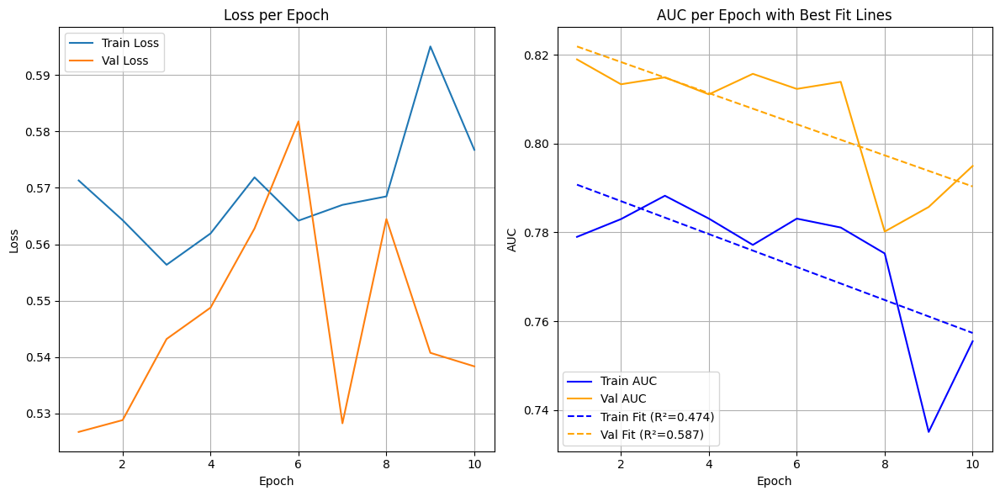


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 2/20
batch_size=128, embed_dim=64, num_heads=2, dropout=0.592, mlp_hidden_dims=(128, 256, 512), lr=0.00938, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.6415 | Train AUC: 0.7209 | Train Precision: 0.6339 | Train Recall: 0.7566 | Train Accuracy: 0.6598 || Val Loss: 0.5960 | Val AUC: 0.7839 | Val Precision: 0.6251 | Val Recall: 0.9538 | Val Accuracy: 0.6909
--> Saved best model with Val AUC: 0.7839
Epoch 2/25 | Train Loss: 0.6679 | Train AUC: 0.6235 | Train Precision: 0.5611 | Train Recall: 0.9410 | Train Accuracy: 0.6025 || Val Loss: 0.8975 | Val AUC: 0.7346 | Val Precision: 0.6810 | Val Recall: 0.8171 | Val Accuracy: 0.7171
Epoch 3/25 | Train Loss: 0.6845 | Train AUC: 0.5639 | Train Precision: 0.5322 | Train Recall: 0.9752 | Train Accuracy: 0.5591 || Val Loss: 0.6938 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/25 | Train Loss: 0.6963 | Train AUC: 0.497

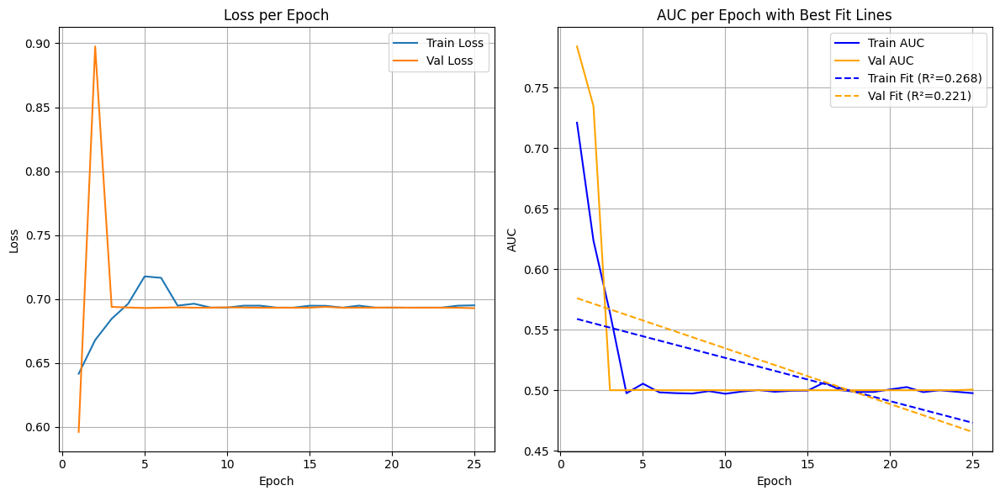

Removed structure: batch_size=128, embed_dim=64, num_heads=2, mlp_hidden_dims=(128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 3/20
batch_size=16, embed_dim=512, num_heads=2, dropout=0.437, mlp_hidden_dims=(64, 128), lr=0.008957, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 49.9635 | Train AUC: 0.4999 | Train Precision: 0.4999 | Train Recall: 0.9989 | Train Accuracy: 0.4998 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/30 | Train Loss: 49.9977 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/30 | Train Loss: 49.9962 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000

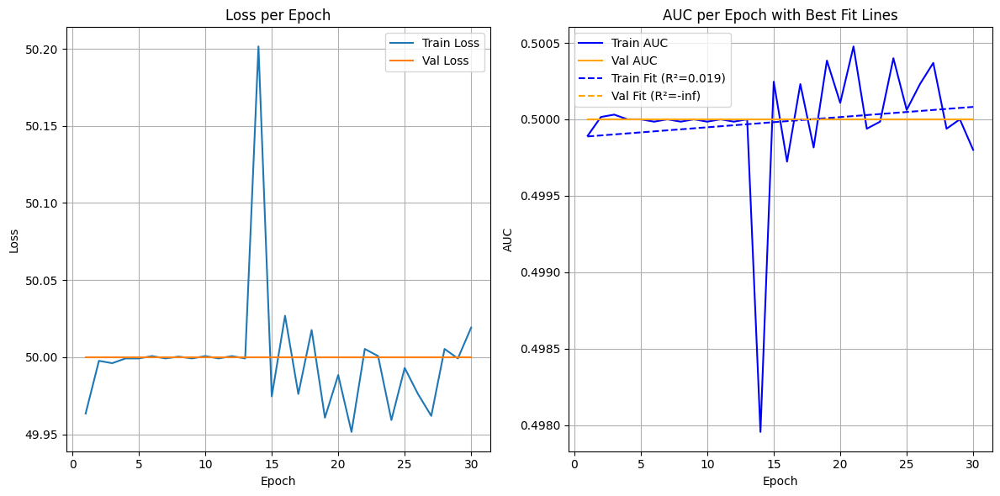

Removed structure: batch_size=16, embed_dim=512, num_heads=2, mlp_hidden_dims=(64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 4/20
batch_size=128, embed_dim=16, num_heads=4, dropout=0.732, mlp_hidden_dims=(64, 128, 256, 512), lr=0.00955, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.6347 | Train AUC: 0.7117 | Train Precision: 0.6218 | Train Recall: 0.8513 | Train Accuracy: 0.6667 || Val Loss: 0.6119 | Val AUC: 0.7858 | Val Precision: 0.7215 | Val Recall: 0.7953 | Val Accuracy: 0.7441
--> Saved best model with Val AUC: 0.7858
Epoch 2/55 | Train Loss: 0.6983 | Train AUC: 0.5377 | Train Precision: 0.5181 | Train Recall: 0.6214 | Train Accuracy: 0.5217 || Val Loss: 0.6933 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/55 | Train Loss: 0.6977 | Train AUC: 0.4989 | Train Precision: 0.5003 | Train Recall: 0.5886 | Train Accuracy: 0.5004 || Val Loss: 0.6937 | Val AUC: 0.5000 | Val Precision: 0.0000 | 

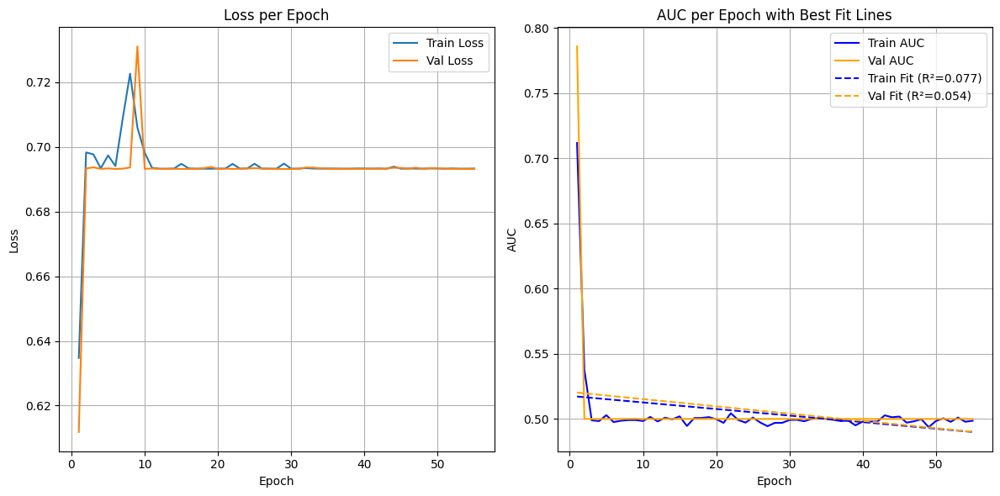

Removed structure: batch_size=128, embed_dim=16, num_heads=4, mlp_hidden_dims=(64, 128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 5/20
batch_size=512, embed_dim=16, num_heads=2, dropout=0.312, mlp_hidden_dims=(64, 128), lr=0.008159, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.5484 | Train AUC: 0.7913 | Train Precision: 0.6988 | Train Recall: 0.7954 | Train Accuracy: 0.7263 || Val Loss: 0.5094 | Val AUC: 0.8239 | Val Precision: 0.7241 | Val Recall: 0.8171 | Val Accuracy: 0.7529
--> Saved best model with Val AUC: 0.8239
Epoch 2/25 | Train Loss: 0.5194 | Train AUC: 0.8145 | Train Precision: 0.7155 | Train Recall: 0.8227 | Train Accuracy: 0.7478 || Val Loss: 0.5137 | Val AUC: 0.8255 | Val Precision: 0.7353 | Val Recall: 0.7973 | Val Accuracy: 0.7552
--> Saved best model with Val AUC: 0.8255
Epoch 3/25 | Train Loss: 0.5179 | Train AUC: 0.8157 | Train Precision: 0.7158 | Train Recall: 0.8274 | Train Accuracy: 0.7495 || Val Loss: 0.5074 |

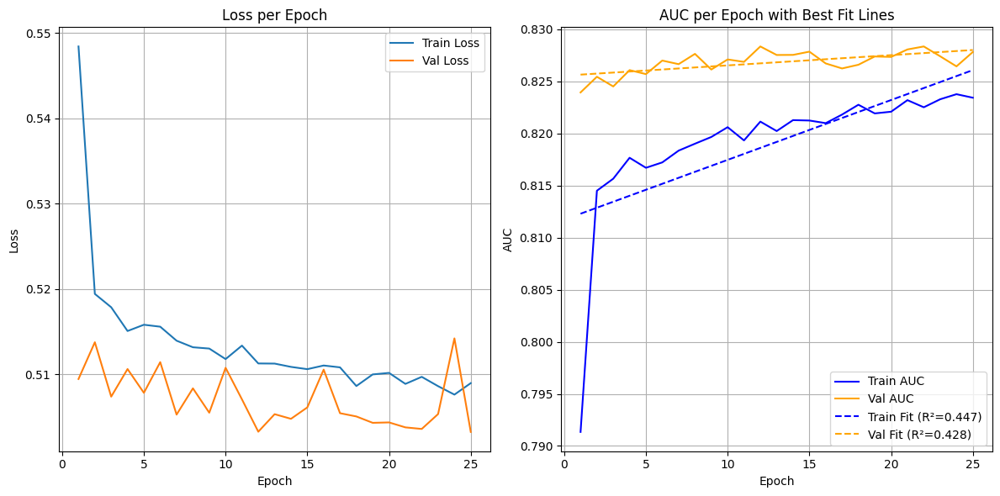


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 6/20
batch_size=64, embed_dim=128, num_heads=4, dropout=0.132, mlp_hidden_dims=(32, 64), lr=0.006631, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 1.4439 | Train AUC: 0.7734 | Train Precision: 0.7011 | Train Recall: 0.7793 | Train Accuracy: 0.7235 || Val Loss: 0.5186 | Val AUC: 0.8175 | Val Precision: 0.7265 | Val Recall: 0.7892 | Val Accuracy: 0.7461
--> Saved best model with Val AUC: 0.8175
Epoch 2/35 | Train Loss: 0.5364 | Train AUC: 0.8035 | Train Precision: 0.7087 | Train Recall: 0.8208 | Train Accuracy: 0.7417 || Val Loss: 0.5261 | Val AUC: 0.8172 | Val Precision: 0.7450 | Val Recall: 0.7273 | Val Accuracy: 0.7392
Epoch 3/35 | Train Loss: 0.5294 | Train AUC: 0.8085 | Train Precision: 0.7049 | Train Recall: 0.8397 | Train Accuracy: 0.7441 || Val Loss: 0.5119 | Val AUC: 0.8223 | Val Precision: 0.7372 | Val Recall: 0.7862 | Val Accuracy: 0.7529
--> Saved best model with Val AUC: 0.8223
Epoch 4/35 | T

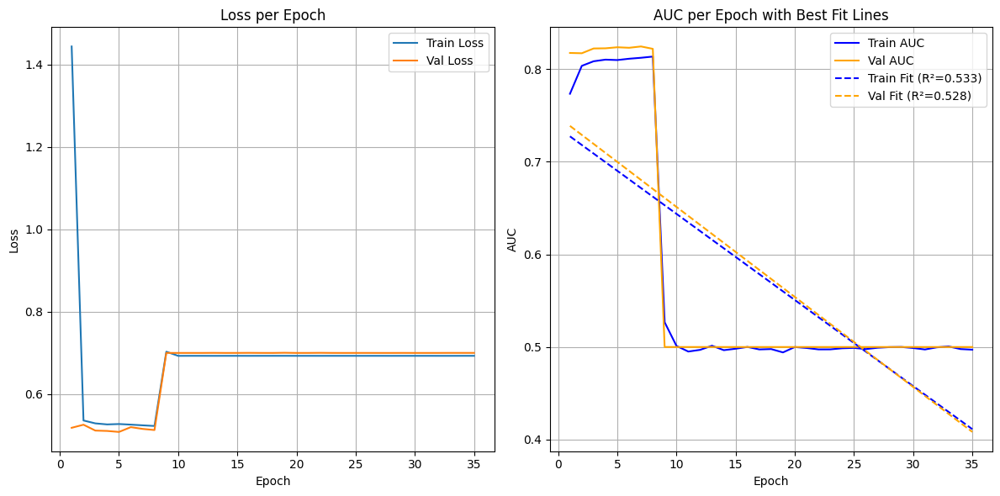

Removed structure: batch_size=64, embed_dim=128, num_heads=4, mlp_hidden_dims=(32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 7/20
batch_size=32, embed_dim=64, num_heads=16, dropout=0.526, mlp_hidden_dims=(16, 32), lr=0.006977, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5941 | Train AUC: 0.7540 | Train Precision: 0.6488 | Train Recall: 0.8420 | Train Accuracy: 0.6931 || Val Loss: 0.5324 | Val AUC: 0.8124 | Val Precision: 0.6983 | Val Recall: 0.8679 | Val Accuracy: 0.7465
--> Saved best model with Val AUC: 0.8124
Epoch 2/10 | Train Loss: 0.5929 | Train AUC: 0.7472 | Train Precision: 0.6400 | Train Recall: 0.8911 | Train Accuracy: 0.6949 || Val Loss: 0.5382 | Val AUC: 0.8106 | Val Precision: 0.6981 | Val Recall: 0.8581 | Val Accuracy: 0.7435
Epoch 3/10 | Train Loss: 0.5947 | Train AUC: 0.7478 | Train Precision: 0.6412 | Train Recall: 0.8872 | Train Accuracy: 0.6953 || Val Loss: 0.5458 | Val AUC: 0.8073 | Val Precision: 0.6705 | Val Recall:

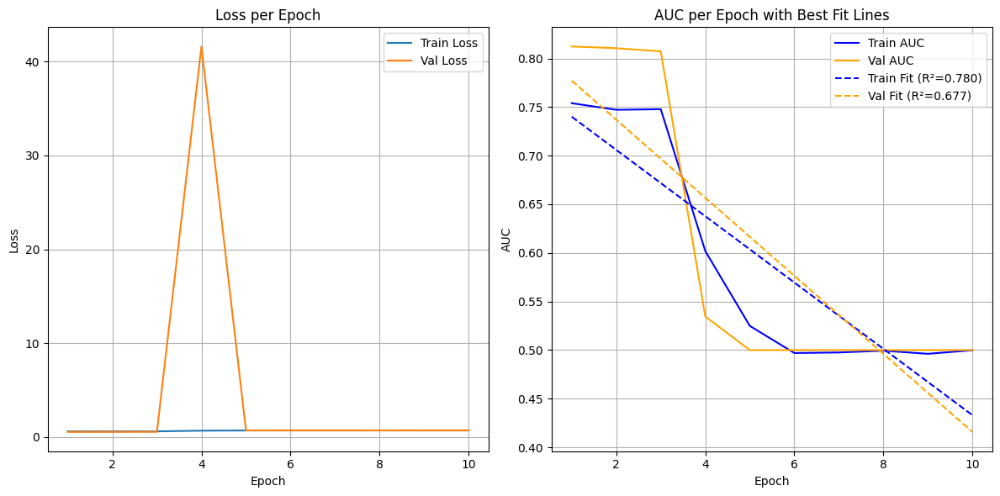


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 8/20
batch_size=32, embed_dim=512, num_heads=4, dropout=0.28, mlp_hidden_dims=(128, 256, 512), lr=0.008453, epochs=70
Using device: cuda
Epoch 1/70 | Train Loss: 49.9474 | Train AUC: 0.5001 | Train Precision: 0.5000 | Train Recall: 0.9994 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/70 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/70 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/70 | Train Loss: 49.9992 | Train AUC

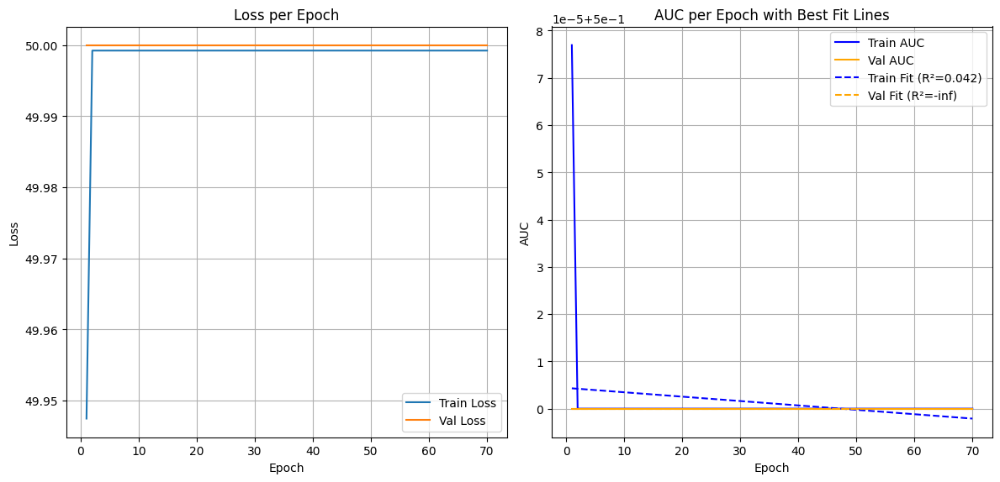

Removed structure: batch_size=32, embed_dim=512, num_heads=4, mlp_hidden_dims=(128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 9/20
batch_size=128, embed_dim=512, num_heads=2, dropout=0.726, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.007124, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 49.8015 | Train AUC: 0.5004 | Train Precision: 0.5001 | Train Recall: 0.9976 | Train Accuracy: 0.5003 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/10 | Train Loss: 49.9962 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/10 | Train Loss: 49.9962 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Preci

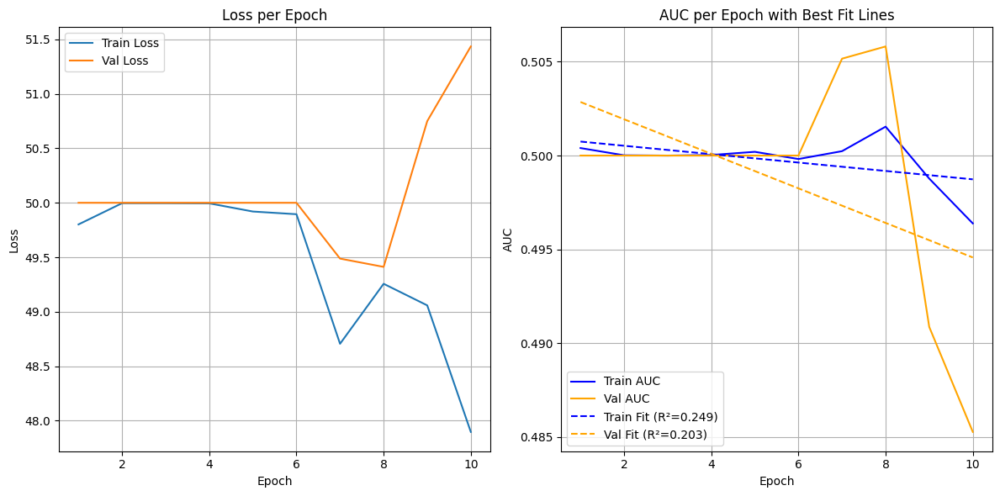

Removed structure: batch_size=128, embed_dim=512, num_heads=2, mlp_hidden_dims=(8, 16, 32, 64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 10/20
batch_size=64, embed_dim=64, num_heads=8, dropout=0.79, mlp_hidden_dims=(64, 128, 256), lr=0.005961, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 0.6870 | Train AUC: 0.6006 | Train Precision: 0.5423 | Train Recall: 0.8647 | Train Accuracy: 0.5674 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/45 | Train Loss: 0.7031 | Train AUC: 0.5005 | Train Precision: 0.5015 | Train Recall: 0.4938 | Train Accuracy: 0.5014 || Val Loss: 0.6934 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/45 | Train Loss: 0.6948 | Train AUC: 0.5021 | Train Precision: 0.5030 | Train Recall: 0.4365 | Train Accuracy: 0.5026 || Val Loss: 0.6933 | Val AUC: 0.5000 | Val Precision: 0.

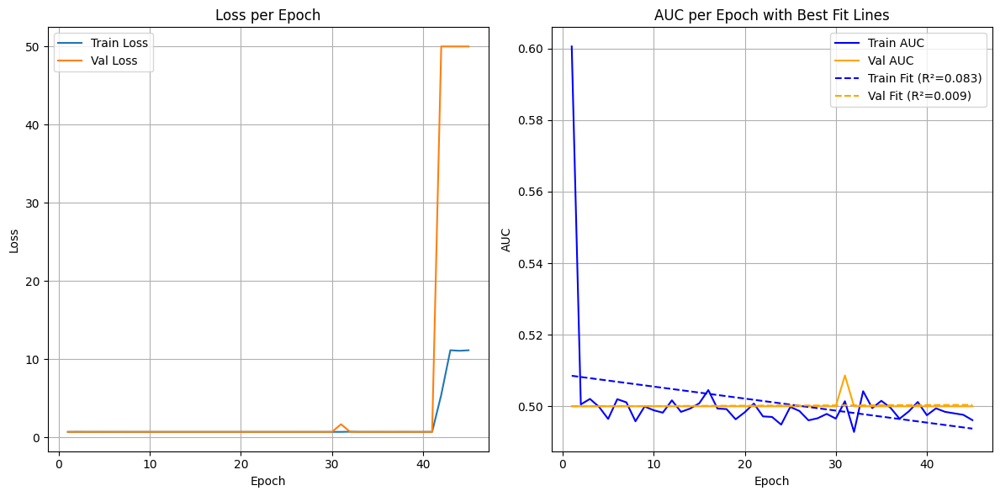

Removed structure: batch_size=64, embed_dim=64, num_heads=8, mlp_hidden_dims=(64, 128, 256)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 11/20
batch_size=128, embed_dim=32, num_heads=8, dropout=0.202, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.001909, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5288 | Train AUC: 0.8069 | Train Precision: 0.7124 | Train Recall: 0.8023 | Train Accuracy: 0.7392 || Val Loss: 0.5101 | Val AUC: 0.8243 | Val Precision: 0.7138 | Val Recall: 0.8438 | Val Accuracy: 0.7527
--> Saved best model with Val AUC: 0.8243
Epoch 2/10 | Train Loss: 0.5180 | Train AUC: 0.8156 | Train Precision: 0.7163 | Train Recall: 0.8280 | Train Accuracy: 0.7500 || Val Loss: 0.5072 | Val AUC: 0.8250 | Val Precision: 0.7201 | Val Recall: 0.8386 | Val Accuracy: 0.7563
--> Saved best model with Val AUC: 0.8250
Epoch 3/10 | Train Loss: 0.5154 | Train AUC: 0.8173 | Train Precision: 0.7141 | Train Recall: 0.8324 | Train Accuracy: 0.7496 || Val Loss: 

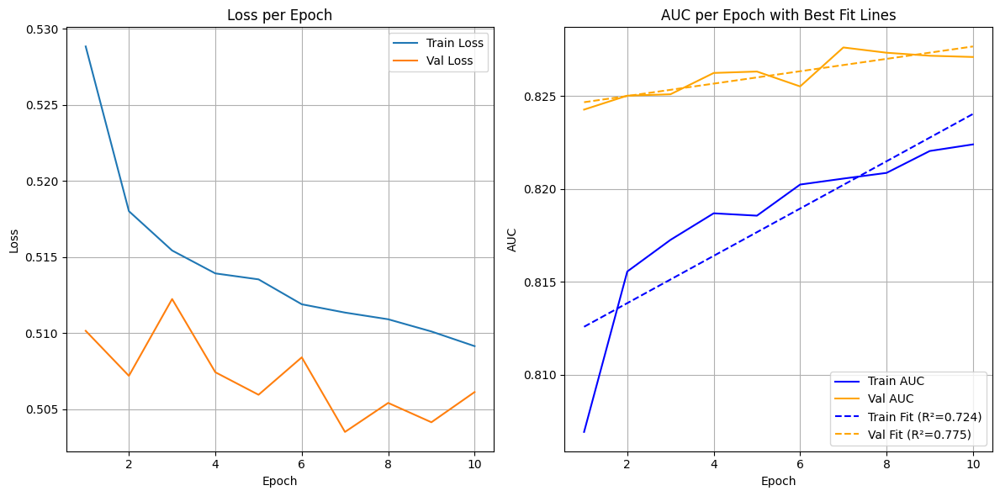


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 12/20
batch_size=512, embed_dim=256, num_heads=2, dropout=0.796, mlp_hidden_dims=(32, 64, 128), lr=0.005399, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.8449 | Train AUC: 0.6430 | Train Precision: 0.5938 | Train Recall: 0.6036 | Train Accuracy: 0.5953 || Val Loss: 0.7209 | Val AUC: 0.6297 | Val Precision: 0.7042 | Val Recall: 0.1578 | Val Accuracy: 0.5458
--> Saved best model with Val AUC: 0.6297
Epoch 2/15 | Train Loss: 0.6380 | Train AUC: 0.6635 | Train Precision: 0.5924 | Train Recall: 0.8916 | Train Accuracy: 0.6390 || Val Loss: 2.2200 | Val AUC: 0.6191 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/15 | Train Loss: 0.6296 | Train AUC: 0.6871 | Train Precision: 0.6004 | Train Recall: 0.8951 | Train Accuracy: 0.6497 || Val Loss: 1.1937 | Val AUC: 0.5602 | Val Precision: 0.5021 | Val Recall: 0.9915 | Val Accuracy: 0.5042
Epoch 4/15 | Train Loss: 0.6229 | Train AUC: 0.69

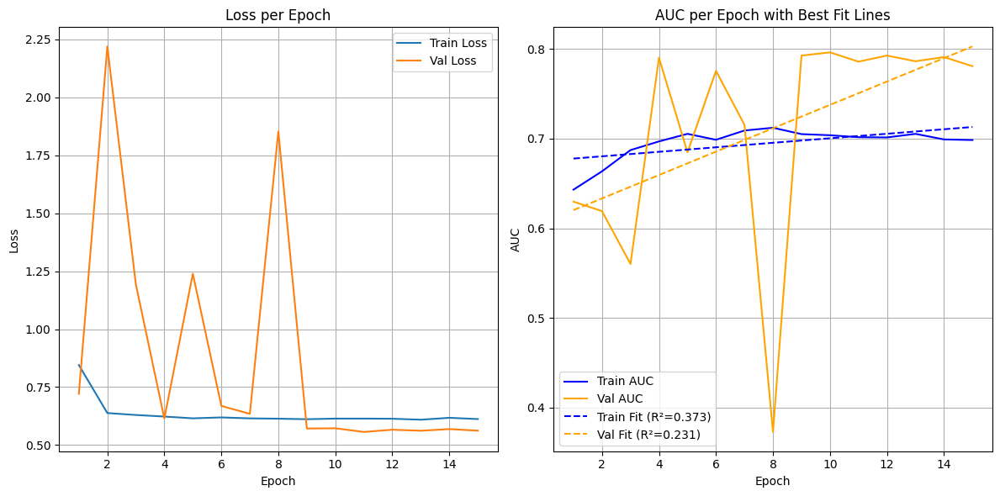


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 13/20
batch_size=32, embed_dim=16, num_heads=2, dropout=0.456, mlp_hidden_dims=(64, 128, 256, 512), lr=0.004724, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.5648 | Train AUC: 0.7854 | Train Precision: 0.6863 | Train Recall: 0.8294 | Train Accuracy: 0.7251 || Val Loss: 0.5391 | Val AUC: 0.8013 | Val Precision: 0.6946 | Val Recall: 0.8786 | Val Accuracy: 0.7461
--> Saved best model with Val AUC: 0.8013
Epoch 2/25 | Train Loss: 0.5518 | Train AUC: 0.7956 | Train Precision: 0.6852 | Train Recall: 0.8676 | Train Accuracy: 0.7345 || Val Loss: 0.5163 | Val AUC: 0.8252 | Val Precision: 0.6906 | Val Recall: 0.8940 | Val Accuracy: 0.7467
--> Saved best model with Val AUC: 0.8252
Epoch 3/25 | Train Loss: 0.5396 | Train AUC: 0.8054 | Train Precision: 0.6942 | Train Recall: 0.8563 | Train Accuracy: 0.7395 || Val Loss: 0.5269 | Val AUC: 0.8241 | Val Precision: 0.6808 | Val Recall: 0.9092 | Val Accuracy: 0.7415
Epo

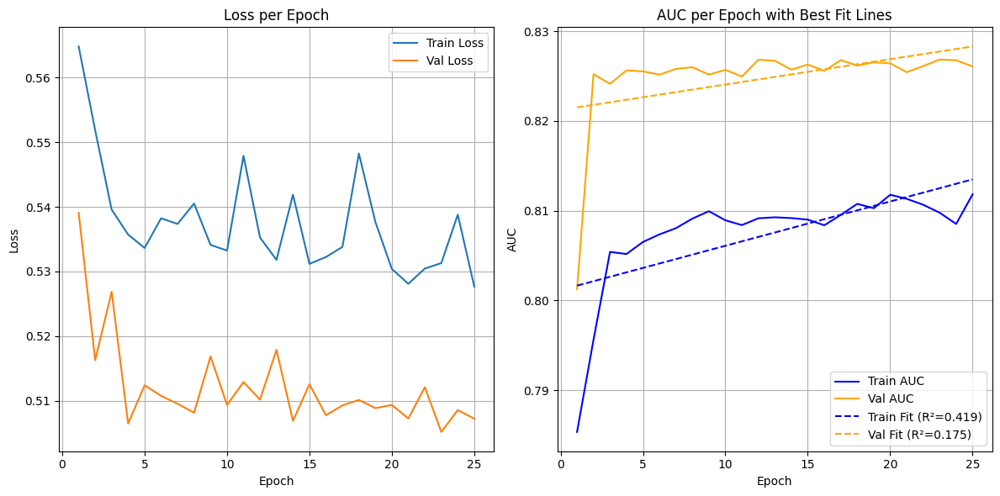


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 14/20
batch_size=16, embed_dim=64, num_heads=2, dropout=0.145, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.003369, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5531 | Train AUC: 0.7891 | Train Precision: 0.6891 | Train Recall: 0.8238 | Train Accuracy: 0.7261 || Val Loss: 0.5170 | Val AUC: 0.8199 | Val Precision: 0.7059 | Val Recall: 0.8558 | Val Accuracy: 0.7496
--> Saved best model with Val AUC: 0.8199
Epoch 2/15 | Train Loss: 0.5394 | Train AUC: 0.7988 | Train Precision: 0.6920 | Train Recall: 0.8500 | Train Accuracy: 0.7358 || Val Loss: 0.5131 | Val AUC: 0.8219 | Val Precision: 0.7079 | Val Recall: 0.8534 | Val Accuracy: 0.7506
--> Saved best model with Val AUC: 0.8219
Epoch 3/15 | Train Loss: 0.5313 | Train AUC: 0.8059 | Train Precision: 0.6989 | Train Recall: 0.8514 | Train Accuracy: 0.7423 || Val Loss: 0.5268 | Val AUC: 0.8227 | Val Precision: 0.7075 | Val Recall: 0.8594 | Val Accuracy: 0.7521


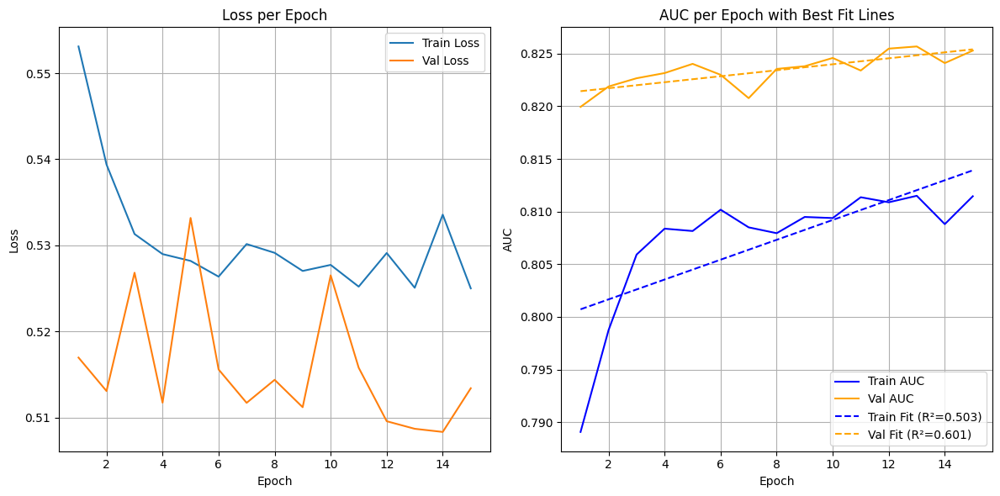


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 15/20
batch_size=128, embed_dim=64, num_heads=8, dropout=0.512, mlp_hidden_dims=(8, 16, 32, 64), lr=0.001416, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 0.5399 | Train AUC: 0.7997 | Train Precision: 0.7080 | Train Recall: 0.8006 | Train Accuracy: 0.7352 || Val Loss: 0.5103 | Val AUC: 0.8241 | Val Precision: 0.7236 | Val Recall: 0.8175 | Val Accuracy: 0.7527
--> Saved best model with Val AUC: 0.8241
Epoch 2/20 | Train Loss: 0.5274 | Train AUC: 0.8094 | Train Precision: 0.7106 | Train Recall: 0.8293 | Train Accuracy: 0.7458 || Val Loss: 0.5126 | Val AUC: 0.8242 | Val Precision: 0.7336 | Val Recall: 0.7882 | Val Accuracy: 0.7510
--> Saved best model with Val AUC: 0.8242
Epoch 3/20 | Train Loss: 0.5248 | Train AUC: 0.8115 | Train Precision: 0.7095 | Train Recall: 0.8341 | Train Accuracy: 0.7463 || Val Loss: 0.5078 | Val AUC: 0.8259 | Val Precision: 0.7171 | Val Recall: 0.8451 | Val Accuracy: 0.7558
--> Sa

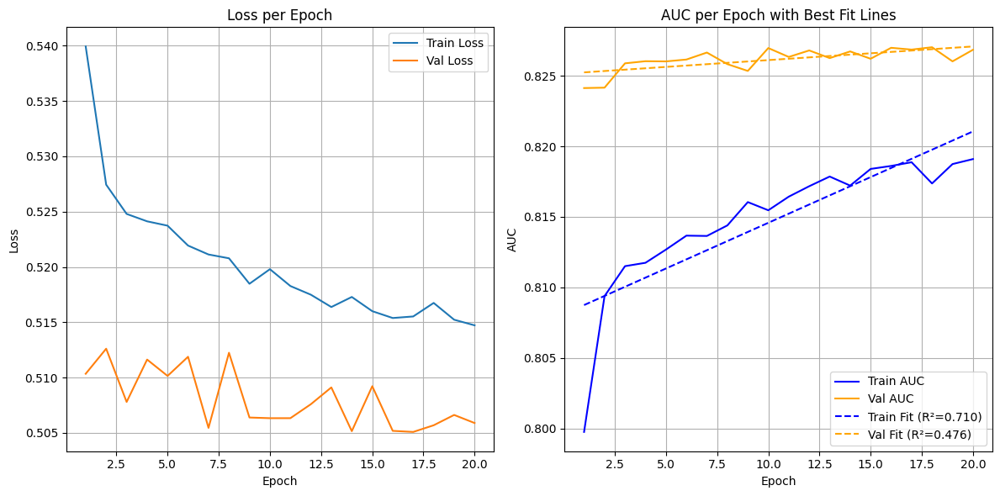


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 16/20
batch_size=128, embed_dim=512, num_heads=4, dropout=0.113, mlp_hidden_dims=(64, 128, 256, 512), lr=0.007622, epochs=50
Using device: cuda
Epoch 1/50 | Train Loss: 49.8487 | Train AUC: 0.5004 | Train Precision: 0.5002 | Train Recall: 0.9962 | Train Accuracy: 0.5003 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/50 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/50 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/50 | Train Loss: 49.9992 | Tr

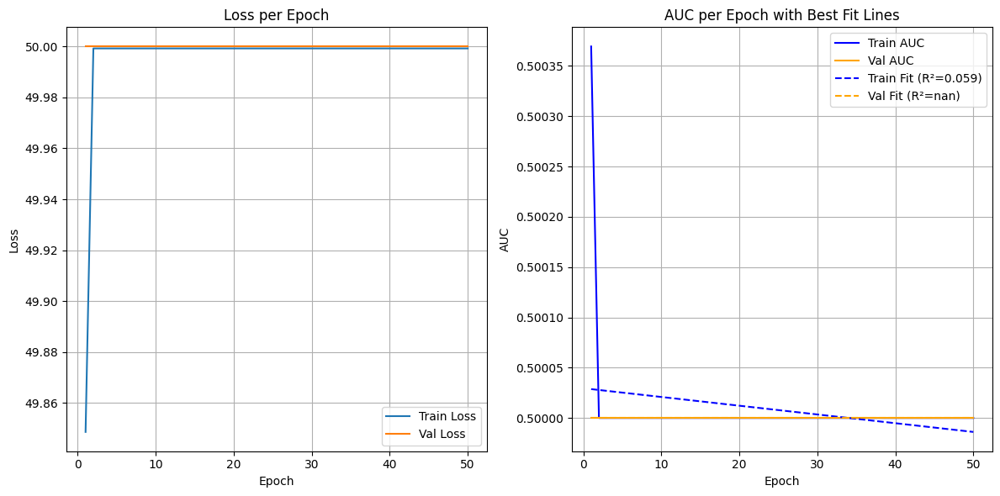

Removed structure: batch_size=128, embed_dim=512, num_heads=4, mlp_hidden_dims=(64, 128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 17/20
batch_size=512, embed_dim=32, num_heads=4, dropout=0.567, mlp_hidden_dims=(8, 16), lr=0.008111, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5702 | Train AUC: 0.7801 | Train Precision: 0.7027 | Train Recall: 0.7611 | Train Accuracy: 0.7195 || Val Loss: 0.5165 | Val AUC: 0.8209 | Val Precision: 0.7250 | Val Recall: 0.8066 | Val Accuracy: 0.7504
--> Saved best model with Val AUC: 0.8209
Epoch 2/15 | Train Loss: 0.5389 | Train AUC: 0.8023 | Train Precision: 0.7065 | Train Recall: 0.8189 | Train Accuracy: 0.7394 || Val Loss: 0.5110 | Val AUC: 0.8235 | Val Precision: 0.7103 | Val Recall: 0.8475 | Val Accuracy: 0.7509
--> Saved best model with Val AUC: 0.8235
Epoch 3/15 | Train Loss: 0.5346 | Train AUC: 0.8053 | Train Precision: 0.7047 | Train Recall: 0.8340 | Train Accuracy: 0.7423 || Val Loss: 0.5122 |

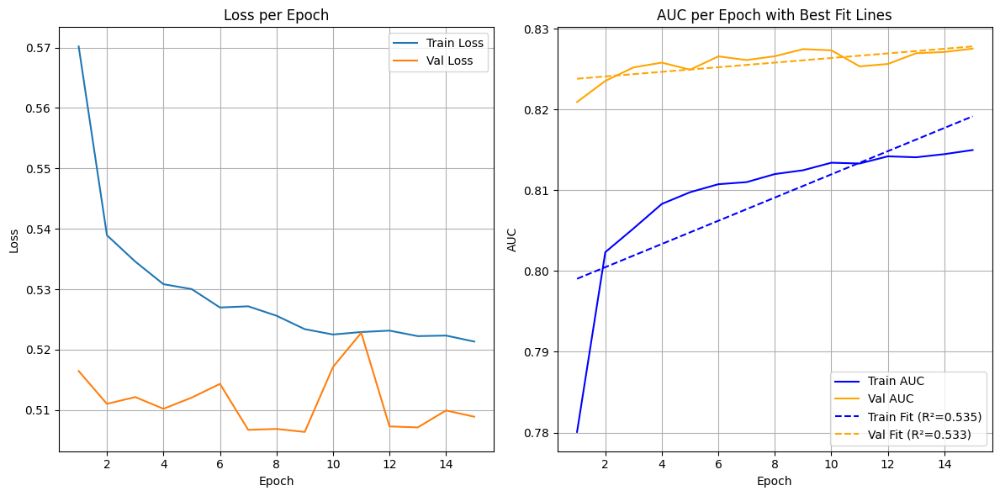


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 18/20
batch_size=16, embed_dim=64, num_heads=8, dropout=0.554, mlp_hidden_dims=(8, 16, 32, 64), lr=0.002199, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.5674 | Train AUC: 0.7786 | Train Precision: 0.6853 | Train Recall: 0.8135 | Train Accuracy: 0.7200 || Val Loss: 0.5598 | Val AUC: 0.8170 | Val Precision: 0.7302 | Val Recall: 0.7713 | Val Accuracy: 0.7432
--> Saved best model with Val AUC: 0.8170
Epoch 2/30 | Train Loss: 0.5550 | Train AUC: 0.7886 | Train Precision: 0.6820 | Train Recall: 0.8472 | Train Accuracy: 0.7261 || Val Loss: 0.5561 | Val AUC: 0.8199 | Val Precision: 0.7354 | Val Recall: 0.7693 | Val Accuracy: 0.7463
--> Saved best model with Val AUC: 0.8199
Epoch 3/30 | Train Loss: 0.5486 | Train AUC: 0.7947 | Train Precision: 0.6850 | Train Recall: 0.8485 | Train Accuracy: 0.7292 || Val Loss: 0.5413 | Val AUC: 0.8203 | Val Precision: 0.7168 | Val Recall: 0.8267 | Val Accuracy: 0.7501
--> Sav

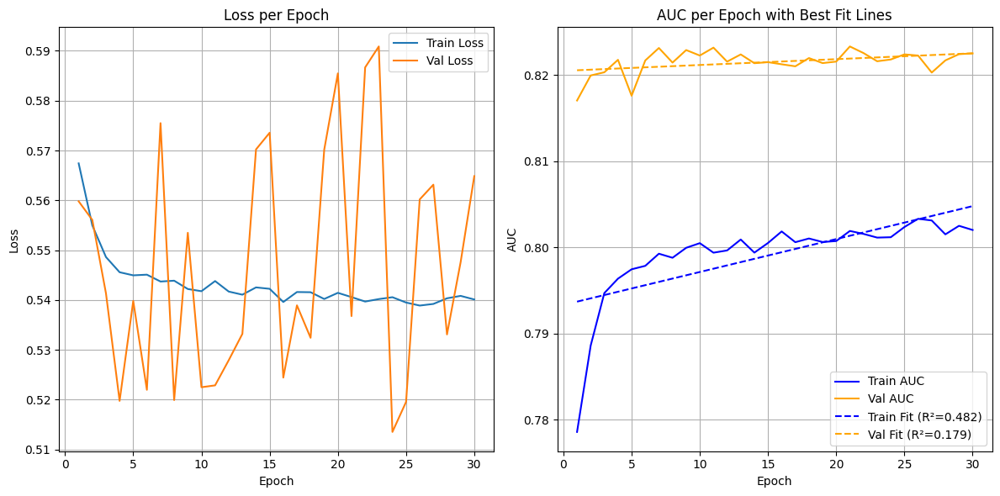


Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 19/20
batch_size=16, embed_dim=64, num_heads=8, dropout=0.56, mlp_hidden_dims=(8, 16, 32, 64), lr=0.008382, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.6975 | Train AUC: 0.5051 | Train Precision: 0.5018 | Train Recall: 0.5230 | Train Accuracy: 0.5019 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/30 | Train Loss: 0.6933 | Train AUC: 0.5030 | Train Precision: 0.5030 | Train Recall: 0.4706 | Train Accuracy: 0.5028 || Val Loss: 0.6934 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/30 | Train Loss: 0.6934 | Train AUC: 0.5016 | Train Precision: 0.5020 | Train Recall: 0.5109 | Train Accuracy: 0.5021 || Val Loss: 0.6935 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/30 | Train Loss: 0.6934 | Train AUC: 0.498

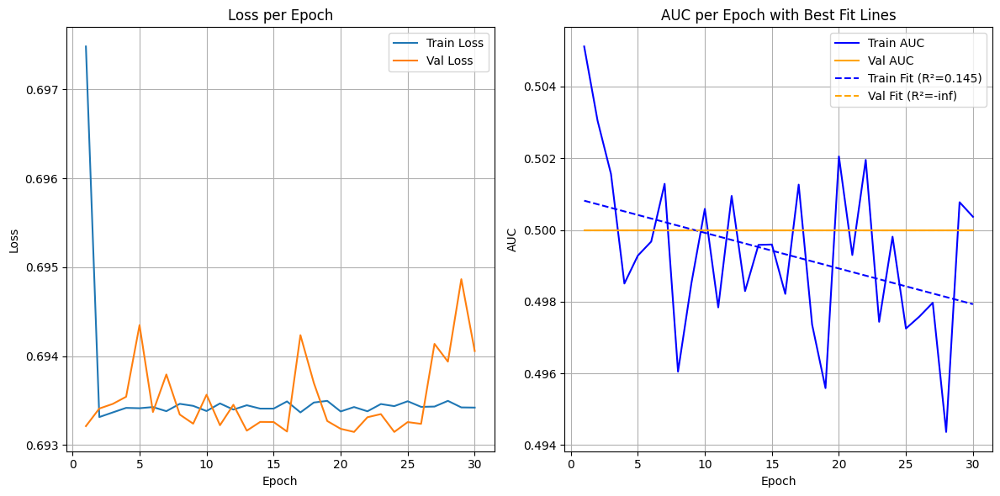

Removed structure: batch_size=16, embed_dim=64, num_heads=8, mlp_hidden_dims=(8, 16, 32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

Trial 20/20
batch_size=32, embed_dim=512, num_heads=2, dropout=0.652, mlp_hidden_dims=(16, 32, 64, 128), lr=0.002192, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 0.6854 | Train AUC: 0.5834 | Train Precision: 0.5370 | Train Recall: 0.9246 | Train Accuracy: 0.5637 || Val Loss: 0.6940 | Val AUC: 0.4998 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5001
--> Saved best model with Val AUC: 0.4998
Epoch 2/35 | Train Loss: 0.6935 | Train AUC: 0.4944 | Train Precision: 0.4976 | Train Recall: 0.7348 | Train Accuracy: 0.4965 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 3/35 | Train Loss: 0.6932 | Train AUC: 0.5013 | Train Precision: 0.5027 | Train Recall: 0.5297 | Train Accuracy: 0.5028 || Val Loss: 0.69

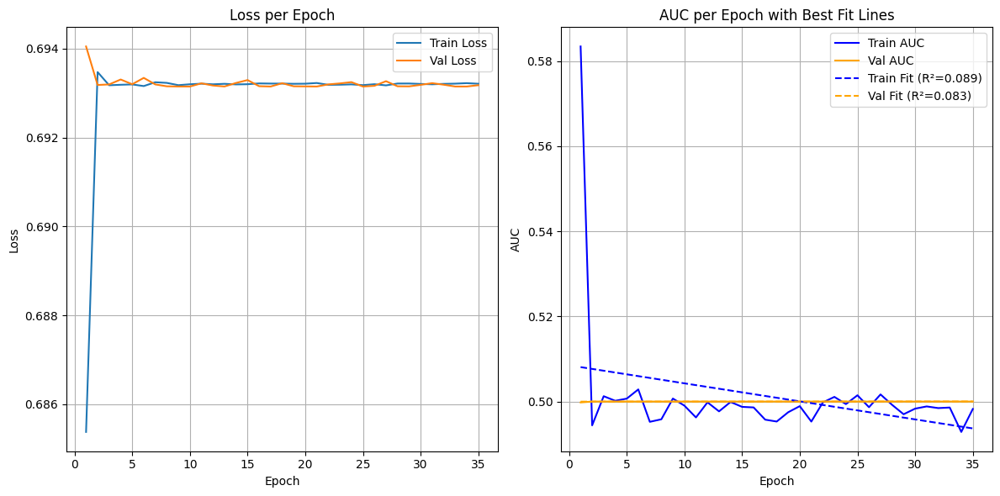

Removed structure: batch_size=32, embed_dim=512, num_heads=2, mlp_hidden_dims=(16, 32, 64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model2'

=== Trial Summary ===

Trial 1 — Removed: False
Params: {'batch_size': 64, 'embed_dim': 32, 'num_heads': 16, 'dropout': 0.446, 'mlp_hidden_dims': [64, 128], 'lr': 0.009957, 'epochs': 10}
Val AUC: 0.8190
Train Fit: y = -0.0037x + 0.7945, R²=0.4740
Val Fit:   y = -0.0035x + 0.8254, R²=0.5875
Train Residuals (first 5): [-0.01175579 -0.00404619  0.00492478  0.003488    0.0012755 ]
Val Residuals   (first 5): [-2.91771794e-03 -5.01395598e-03  4.76293308e-05 -2.80907817e-04
  7.84720158e-03]

Trial 2 — Removed: True
Params: {'batch_size': 128, 'embed_dim': 64, 'num_heads': 2, 'dropout': 0.592, 'mlp_hidden_dims': [128, 256, 512], 'lr': 0.00938, 'epochs': 25}
Val AUC: 0.7839
Train Fit: y = -0.0036x + 0.5624, R²=0.2681
Val Fit:   y = -0.0046x + 0.5806, R²=0.2206
Train Residuals (first 5): [ 0.1620945   0.06820161  0.01221021 -0.05062

In [ ]:
best_model2, best_config2, history2, possible_structures = random_search(input_dim=len(feature_names), device=device, possible_structures=possible_structures, n_trials=20, save_dir="/content/drive/MyDrive/model2")


Trial 1/5
batch_size=64, embed_dim=16, num_heads=2, dropout=0.526, mlp_hidden_dims=(32, 64, 128, 256, 512), lr=0.002235, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5375 | Train AUC: 0.8016 | Train Precision: 0.7074 | Train Recall: 0.8057 | Train Accuracy: 0.7362 || Val Loss: 0.5100 | Val AUC: 0.8237 | Val Precision: 0.7186 | Val Recall: 0.8344 | Val Accuracy: 0.7539
--> Saved best model with Val AUC: 0.8237
Epoch 2/10 | Train Loss: 0.5257 | Train AUC: 0.8105 | Train Precision: 0.7070 | Train Recall: 0.8375 | Train Accuracy: 0.7452 || Val Loss: 0.5079 | Val AUC: 0.8250 | Val Precision: 0.7075 | Val Recall: 0.8618 | Val Accuracy: 0.7528
--> Saved best model with Val AUC: 0.8250
Epoch 3/10 | Train Loss: 0.5238 | Train AUC: 0.8118 | Train Precision: 0.7077 | Train Recall: 0.8421 | Train Accuracy: 0.7471 || Val Loss: 0.5120 | Val AUC: 0.8257 | Val Precision: 0.7048 | Val Recall: 0.8684 | Val Accuracy: 0.7524
--> Saved best model with Val AUC: 0.8257
Epoch 4/10 | Train Loss: 0.

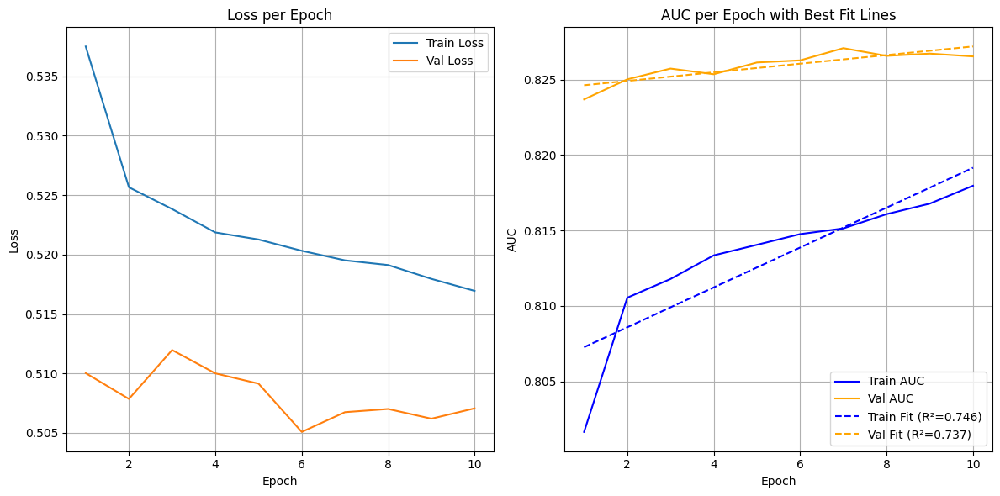


Saved model and trial summaries to '/content/drive/MyDrive/model3'

Trial 2/5
batch_size=64, embed_dim=16, num_heads=8, dropout=0.397, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.004156, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5356 | Train AUC: 0.8021 | Train Precision: 0.7070 | Train Recall: 0.8083 | Train Accuracy: 0.7367 || Val Loss: 0.5073 | Val AUC: 0.8250 | Val Precision: 0.7136 | Val Recall: 0.8549 | Val Accuracy: 0.7559
--> Saved best model with Val AUC: 0.8250
Epoch 2/10 | Train Loss: 0.5231 | Train AUC: 0.8118 | Train Precision: 0.7066 | Train Recall: 0.8420 | Train Accuracy: 0.7462 || Val Loss: 0.5076 | Val AUC: 0.8254 | Val Precision: 0.7230 | Val Recall: 0.8283 | Val Accuracy: 0.7555
--> Saved best model with Val AUC: 0.8254
Epoch 3/10 | Train Loss: 0.5213 | Train AUC: 0.8141 | Train Precision: 0.7087 | Train Recall: 0.8429 | Train Accuracy: 0.7482 || Val Loss: 0.5059 | Val AUC: 0.8271 | Val Precision: 0.7292 | Val Recall: 0.8168 | Val Accuracy: 0.7567
--> 

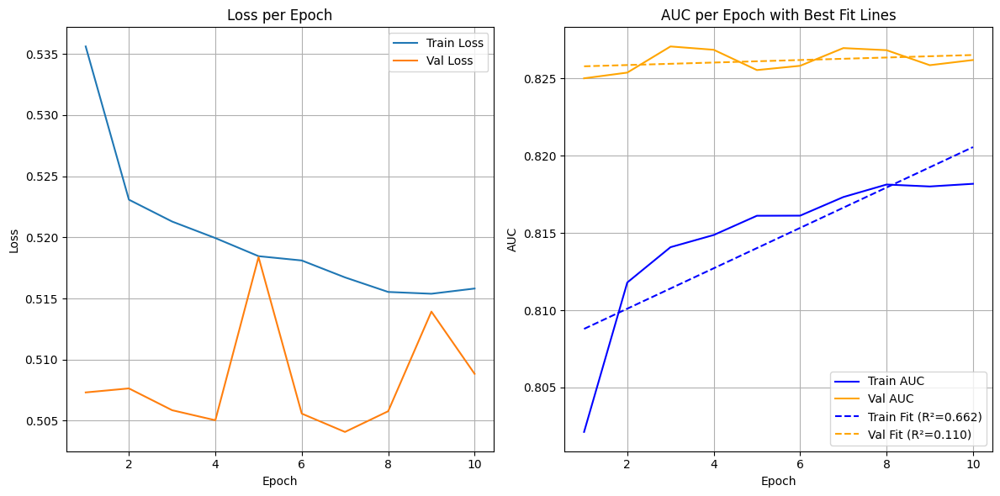


Saved model and trial summaries to '/content/drive/MyDrive/model3'

Trial 3/5
batch_size=32, embed_dim=128, num_heads=16, dropout=0.483, mlp_hidden_dims=(8, 16, 32, 64), lr=0.004343, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 0.6058 | Train AUC: 0.7468 | Train Precision: 0.6492 | Train Recall: 0.8106 | Train Accuracy: 0.6863 || Val Loss: 0.5553 | Val AUC: 0.7994 | Val Precision: 0.6967 | Val Recall: 0.8643 | Val Accuracy: 0.7440
--> Saved best model with Val AUC: 0.7994
Epoch 2/35 | Train Loss: 0.5840 | Train AUC: 0.7637 | Train Precision: 0.6571 | Train Recall: 0.8573 | Train Accuracy: 0.7049 || Val Loss: 0.5228 | Val AUC: 0.8179 | Val Precision: 0.7284 | Val Recall: 0.7868 | Val Accuracy: 0.7467
--> Saved best model with Val AUC: 0.8179
Epoch 3/35 | Train Loss: 0.5804 | Train AUC: 0.7691 | Train Precision: 0.6647 | Train Recall: 0.8423 | Train Accuracy: 0.7087 || Val Loss: 0.5437 | Val AUC: 0.8156 | Val Precision: 0.7294 | Val Recall: 0.7594 | Val Accuracy: 0.7388
Epoch 4

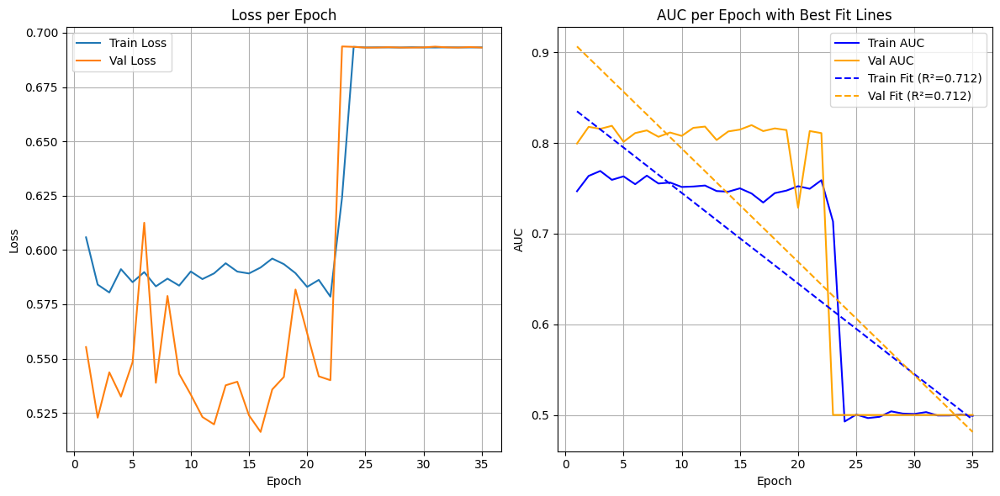


Saved model and trial summaries to '/content/drive/MyDrive/model3'

Trial 4/5
batch_size=512, embed_dim=128, num_heads=16, dropout=0.611, mlp_hidden_dims=(8, 16, 32), lr=0.001759, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.5618 | Train AUC: 0.7853 | Train Precision: 0.7029 | Train Recall: 0.7709 | Train Accuracy: 0.7225 || Val Loss: 0.5110 | Val AUC: 0.8241 | Val Precision: 0.7080 | Val Recall: 0.8564 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8241
Epoch 2/55 | Train Loss: 0.5374 | Train AUC: 0.8030 | Train Precision: 0.7101 | Train Recall: 0.8129 | Train Accuracy: 0.7405 || Val Loss: 0.5132 | Val AUC: 0.8240 | Val Precision: 0.7237 | Val Recall: 0.8202 | Val Accuracy: 0.7535
Epoch 3/55 | Train Loss: 0.5359 | Train AUC: 0.8036 | Train Precision: 0.7069 | Train Recall: 0.8241 | Train Accuracy: 0.7412 || Val Loss: 0.5307 | Val AUC: 0.8246 | Val Precision: 0.7119 | Val Recall: 0.8514 | Val Accuracy: 0.7534
--> Saved best model with Val AUC: 0.8246
Epoch 4/55

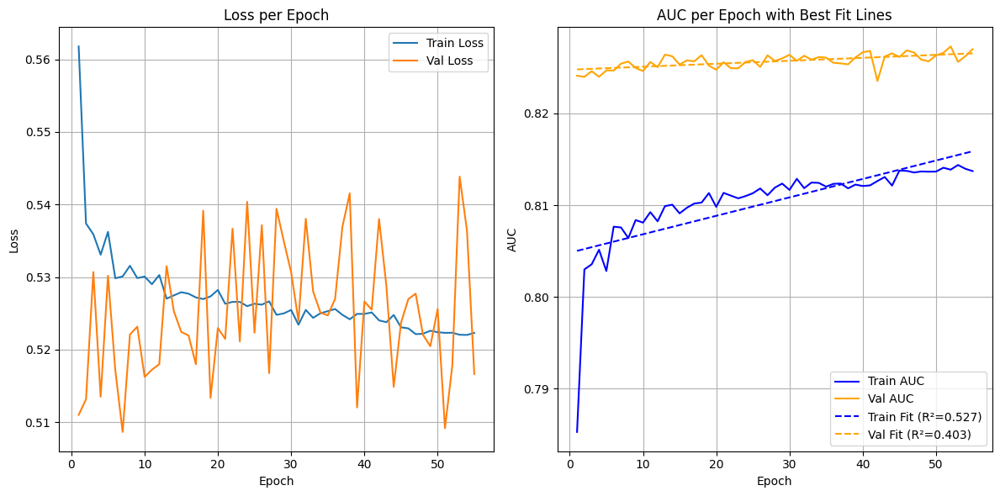


Saved model and trial summaries to '/content/drive/MyDrive/model3'

Trial 5/5
batch_size=16, embed_dim=32, num_heads=4, dropout=0.214, mlp_hidden_dims=(128, 256, 512), lr=0.001165, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.5297 | Train AUC: 0.8066 | Train Precision: 0.7101 | Train Recall: 0.8142 | Train Accuracy: 0.7409 || Val Loss: 0.5085 | Val AUC: 0.8234 | Val Precision: 0.7186 | Val Recall: 0.8372 | Val Accuracy: 0.7547
--> Saved best model with Val AUC: 0.8234
Epoch 2/55 | Train Loss: 0.5205 | Train AUC: 0.8138 | Train Precision: 0.7102 | Train Recall: 0.8370 | Train Accuracy: 0.7477 || Val Loss: 0.5095 | Val AUC: 0.8239 | Val Precision: 0.7108 | Val Recall: 0.8519 | Val Accuracy: 0.7527
--> Saved best model with Val AUC: 0.8239
Epoch 3/55 | Train Loss: 0.5186 | Train AUC: 0.8158 | Train Precision: 0.7118 | Train Recall: 0.8402 | Train Accuracy: 0.7500 || Val Loss: 0.5074 | Val AUC: 0.8254 | Val Precision: 0.7153 | Val Recall: 0.8407 | Val Accuracy: 0.7531
--> Saved

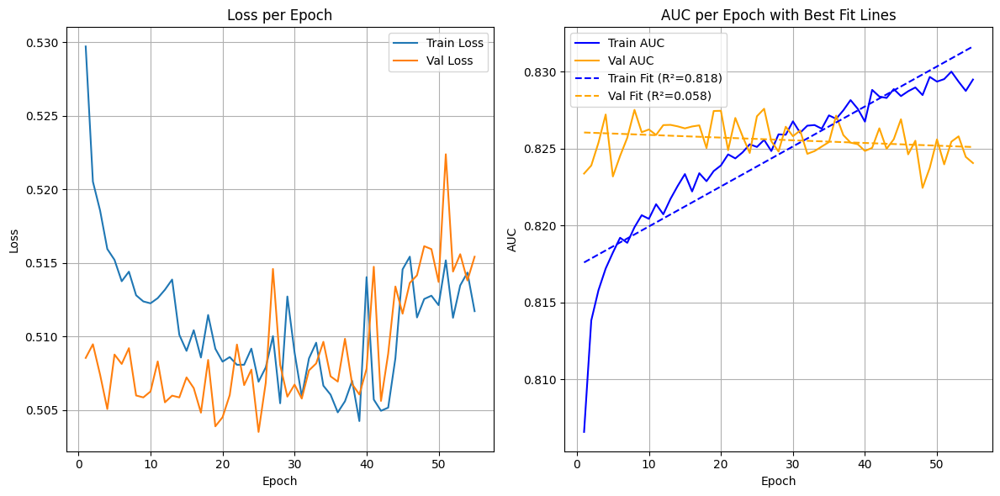


Saved model and trial summaries to '/content/drive/MyDrive/model3'

=== Trial Summary ===

Trial 1 — Removed: False
Params: {'batch_size': 64, 'embed_dim': 16, 'num_heads': 2, 'dropout': 0.526, 'mlp_hidden_dims': [32, 64, 128, 256, 512], 'lr': 0.002235, 'epochs': 10}
Val AUC: 0.8271
Train Fit: y = 0.0013x + 0.8059, R²=0.7455
Val Fit:   y = 0.0003x + 0.8243, R²=0.7369
Train Residuals (first 5): [-0.00561585  0.00196068  0.00187819  0.00212142  0.00150156]
Val Residuals   (first 5): [-0.00093796  0.0001053   0.00053204 -0.00012807  0.00036541]

Trial 2 — Removed: False
Params: {'batch_size': 64, 'embed_dim': 16, 'num_heads': 8, 'dropout': 0.397, 'mlp_hidden_dims': [8, 16, 32, 64, 128], 'lr': 0.004156, 'epochs': 10}
Val AUC: 0.8271
Train Fit: y = 0.0013x + 0.8075, R²=0.6624
Val Fit:   y = 0.0001x + 0.8257, R²=0.1104
Train Residuals (first 5): [-0.00667166  0.00169517  0.00267325  0.00215442  0.00209312]
Val Residuals   (first 5): [-0.00077771 -0.00048888  0.00112215  0.0008254  -0.000568

In [ ]:
best_model3, best_config3, history3, possible_structures = random_search(input_dim=len(feature_names), device=device, possible_structures=possible_structures, n_trials=5, save_dir="/content/drive/MyDrive/model3")


Trial 1/20
batch_size=64, embed_dim=256, num_heads=2, dropout=0.314, mlp_hidden_dims=(8, 16), lr=0.007002, epochs=40
Using device: cuda
Epoch 1/40 | Train Loss: 49.8263 | Train AUC: 0.5002 | Train Precision: 0.5002 | Train Recall: 0.9973 | Train Accuracy: 0.5004 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/40 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/40 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/40 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy:

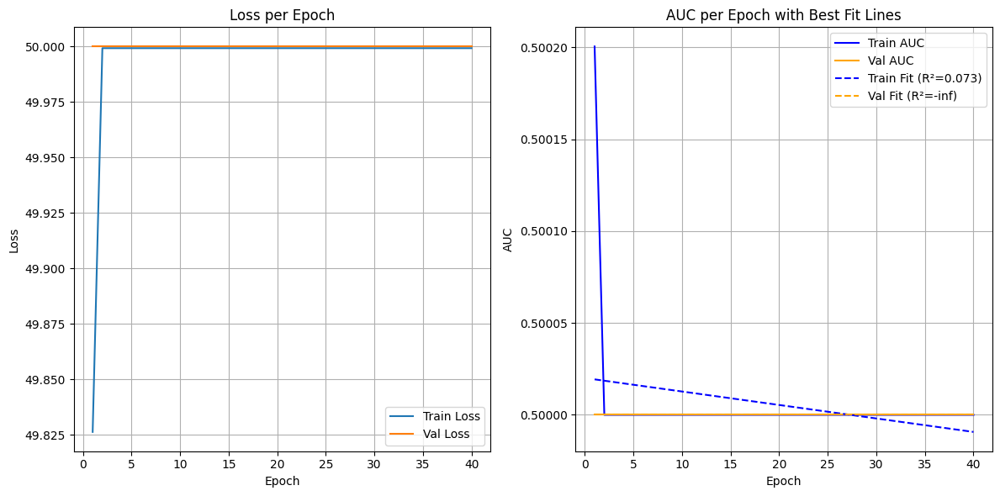

Removed structure: batch_size=64, embed_dim=256, num_heads=2, mlp_hidden_dims=(8, 16)

Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 2/20
batch_size=16, embed_dim=256, num_heads=4, dropout=0.57, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.000612, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 0.5758 | Train AUC: 0.7697 | Train Precision: 0.6818 | Train Recall: 0.8014 | Train Accuracy: 0.7137 || Val Loss: 0.5447 | Val AUC: 0.8140 | Val Precision: 0.7053 | Val Recall: 0.8387 | Val Accuracy: 0.7441
--> Saved best model with Val AUC: 0.8140
Epoch 2/45 | Train Loss: 0.5695 | Train AUC: 0.7788 | Train Precision: 0.6754 | Train Recall: 0.8380 | Train Accuracy: 0.7176 || Val Loss: 0.5359 | Val AUC: 0.8142 | Val Precision: 0.6583 | Val Recall: 0.9283 | Val Accuracy: 0.7232
--> Saved best model with Val AUC: 0.8142
Epoch 3/45 | Train Loss: 0.5686 | Train AUC: 0.7787 | Train Precision: 0.6696 | Train Recall: 0.8485 | Train Accuracy: 0.7149 || Val Loss: 0.5369 | V

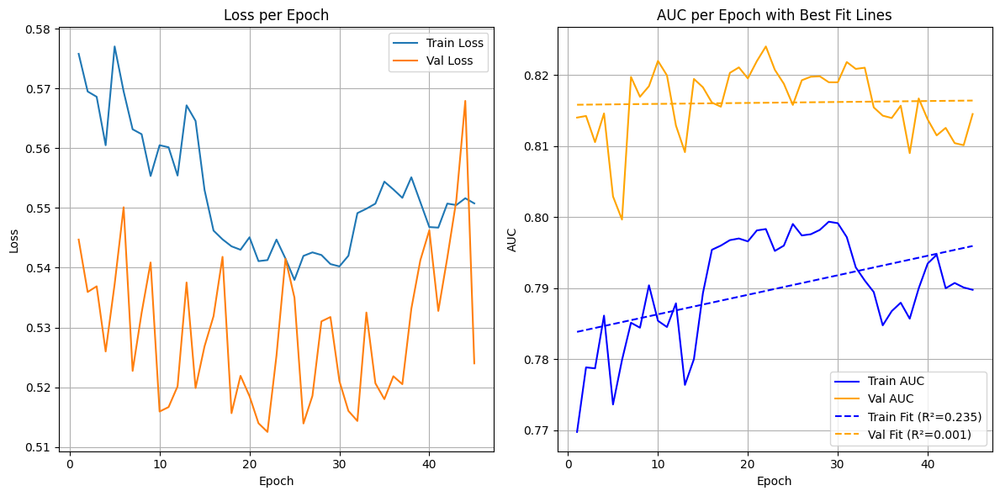


Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 3/20
batch_size=32, embed_dim=32, num_heads=8, dropout=0.607, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.002718, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5514 | Train AUC: 0.7907 | Train Precision: 0.6973 | Train Recall: 0.8103 | Train Accuracy: 0.7293 || Val Loss: 0.5319 | Val AUC: 0.8219 | Val Precision: 0.6728 | Val Recall: 0.9189 | Val Accuracy: 0.7360
--> Saved best model with Val AUC: 0.8219
Epoch 2/15 | Train Loss: 0.5384 | Train AUC: 0.8019 | Train Precision: 0.6987 | Train Recall: 0.8398 | Train Accuracy: 0.7389 || Val Loss: 0.5138 | Val AUC: 0.8213 | Val Precision: 0.7025 | Val Recall: 0.8709 | Val Accuracy: 0.7511
Epoch 3/15 | Train Loss: 0.5364 | Train AUC: 0.8041 | Train Precision: 0.6980 | Train Recall: 0.8444 | Train Accuracy: 0.7396 || Val Loss: 0.5148 | Val AUC: 0.8249 | Val Precision: 0.7235 | Val Recall: 0.8231 | Val Accuracy: 0.7542
--> Saved best model with Val AUC: 0.8249
E

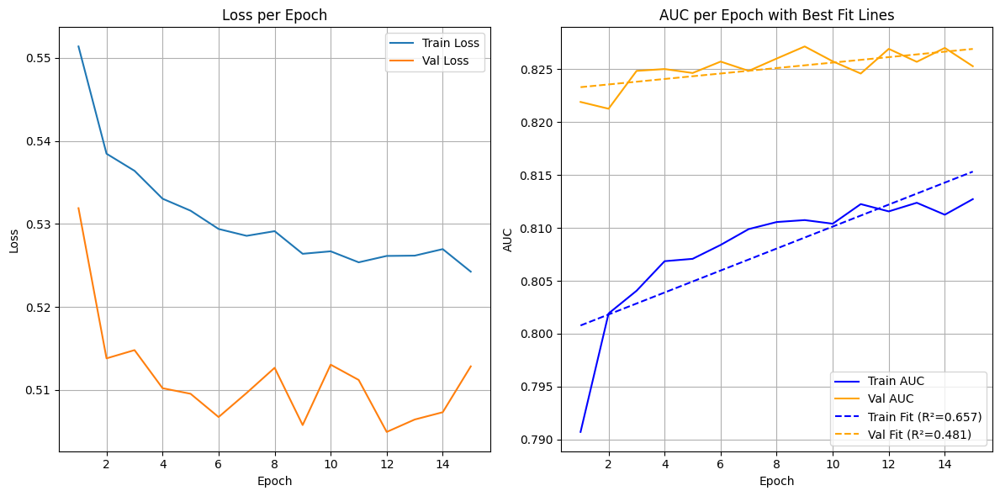


Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 4/20
batch_size=64, embed_dim=32, num_heads=2, dropout=0.795, mlp_hidden_dims=(32, 64, 128), lr=0.00142, epochs=60
Using device: cuda
Epoch 1/60 | Train Loss: 0.5592 | Train AUC: 0.7857 | Train Precision: 0.7004 | Train Recall: 0.7796 | Train Accuracy: 0.7231 || Val Loss: 0.5186 | Val AUC: 0.8233 | Val Precision: 0.7065 | Val Recall: 0.8630 | Val Accuracy: 0.7522
--> Saved best model with Val AUC: 0.8233
Epoch 2/60 | Train Loss: 0.5403 | Train AUC: 0.8014 | Train Precision: 0.6957 | Train Recall: 0.8448 | Train Accuracy: 0.7376 || Val Loss: 0.5094 | Val AUC: 0.8246 | Val Precision: 0.7156 | Val Recall: 0.8395 | Val Accuracy: 0.7529
--> Saved best model with Val AUC: 0.8246
Epoch 3/60 | Train Loss: 0.5358 | Train AUC: 0.8049 | Train Precision: 0.6988 | Train Recall: 0.8527 | Train Accuracy: 0.7426 || Val Loss: 0.5077 | Val AUC: 0.8249 | Val Precision: 0.7159 | Val Recall: 0.8439 | Val Accuracy: 0.7545
--> Saved b

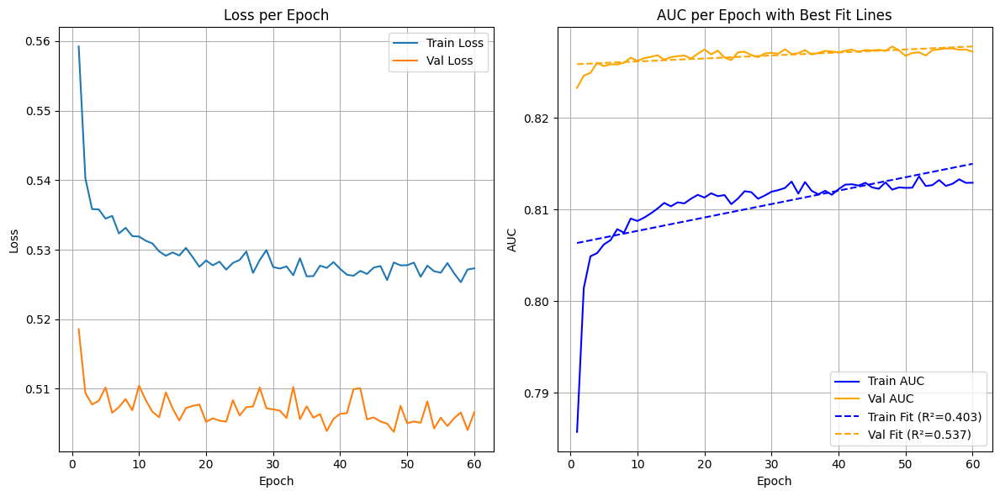


Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 5/20
batch_size=16, embed_dim=128, num_heads=16, dropout=0.18, mlp_hidden_dims=(16, 32), lr=0.004204, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 0.6023 | Train AUC: 0.7382 | Train Precision: 0.6476 | Train Recall: 0.8623 | Train Accuracy: 0.6966 || Val Loss: 0.5468 | Val AUC: 0.7921 | Val Precision: 0.7078 | Val Recall: 0.8452 | Val Accuracy: 0.7481
--> Saved best model with Val AUC: 0.7921
Epoch 2/45 | Train Loss: 0.5986 | Train AUC: 0.7472 | Train Precision: 0.6532 | Train Recall: 0.8782 | Train Accuracy: 0.7059 || Val Loss: 0.7239 | Val AUC: 0.5001 | Val Precision: 0.5001 | Val Recall: 1.0000 | Val Accuracy: 0.5002
Epoch 3/45 | Train Loss: 0.6936 | Train AUC: 0.4992 | Train Precision: 0.5002 | Train Recall: 0.5098 | Train Accuracy: 0.5002 || Val Loss: 0.6941 | Val AUC: 0.4999 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/45 | Train Loss: 0.6933 | Train AUC: 0.4969 | Tr

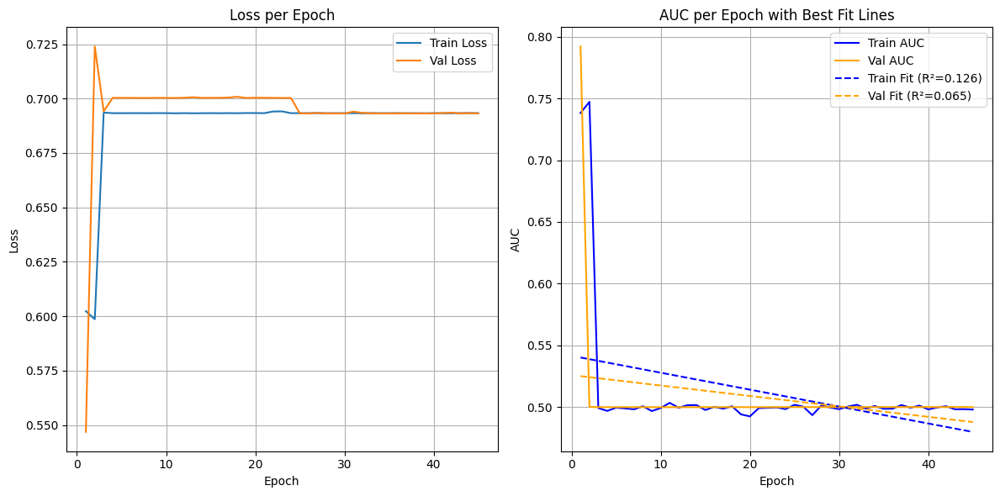

Removed structure: batch_size=16, embed_dim=128, num_heads=16, mlp_hidden_dims=(16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 6/20
batch_size=16, embed_dim=16, num_heads=8, dropout=0.59, mlp_hidden_dims=(128, 256, 512), lr=0.000841, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 0.5373 | Train AUC: 0.8017 | Train Precision: 0.7057 | Train Recall: 0.8155 | Train Accuracy: 0.7377 || Val Loss: 0.5121 | Val AUC: 0.8249 | Val Precision: 0.7116 | Val Recall: 0.8491 | Val Accuracy: 0.7525
--> Saved best model with Val AUC: 0.8249
Epoch 2/35 | Train Loss: 0.5266 | Train AUC: 0.8100 | Train Precision: 0.7090 | Train Recall: 0.8362 | Train Accuracy: 0.7465 || Val Loss: 0.5123 | Val AUC: 0.8255 | Val Precision: 0.7195 | Val Recall: 0.8395 | Val Accuracy: 0.7561
--> Saved best model with Val AUC: 0.8255
Epoch 3/35 | Train Loss: 0.5255 | Train AUC: 0.8113 | Train Precision: 0.7064 | Train Recall: 0.8421 | Train Accuracy: 0.7460 || Val Loss: 0.5059 | Val A

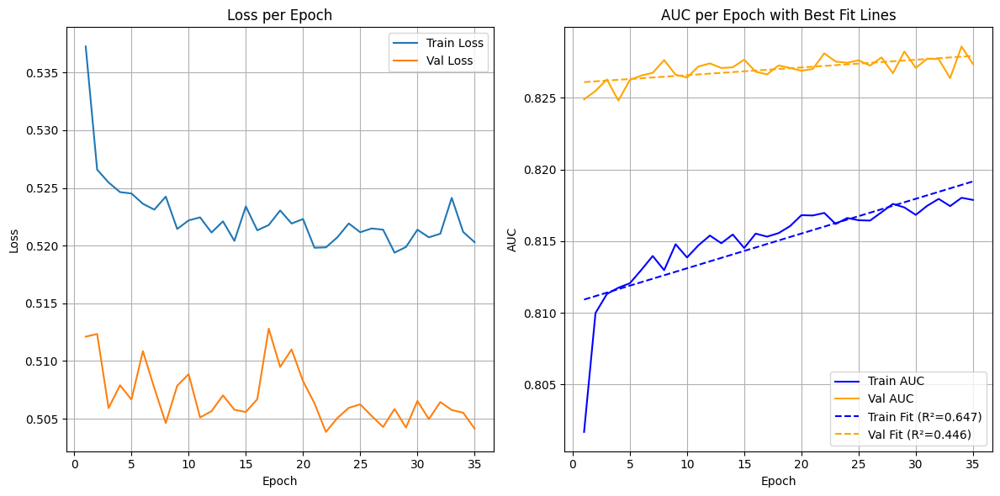


Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 7/20
batch_size=32, embed_dim=512, num_heads=8, dropout=0.766, mlp_hidden_dims=(32, 64, 128), lr=0.009038, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 49.1529 | Train AUC: 0.4998 | Train Precision: 0.5000 | Train Recall: 0.9153 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/25 | Train Loss: 48.9513 | Train AUC: 0.5010 | Train Precision: 0.5001 | Train Recall: 0.9272 | Train Accuracy: 0.5003 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/25 | Train Loss: 47.9283 | Train AUC: 0.5003 | Train Precision: 0.5000 | Train Recall: 0.7305 | Train Accuracy: 0.5001 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/25 | Train Loss: 48.0500 | Train AUC:

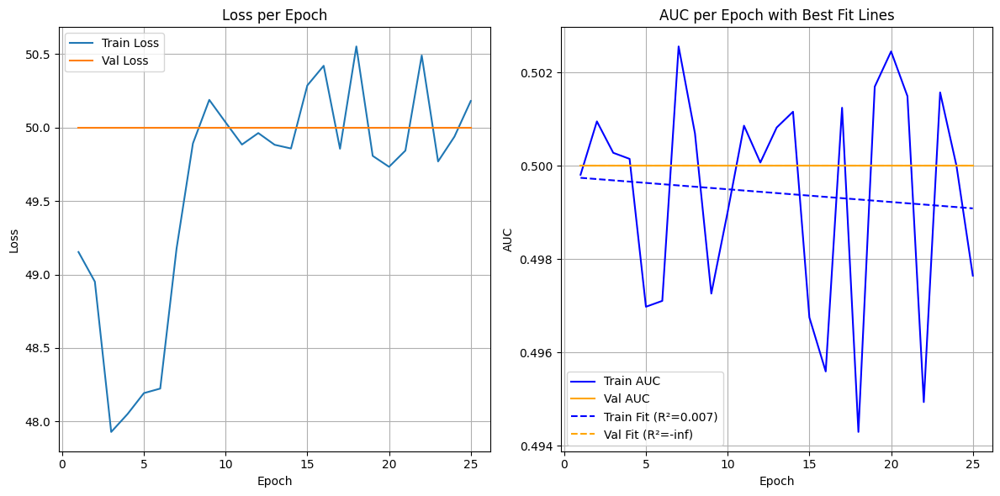

Removed structure: batch_size=32, embed_dim=512, num_heads=8, mlp_hidden_dims=(32, 64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 8/20
batch_size=16, embed_dim=32, num_heads=2, dropout=0.505, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.000575, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 0.5311 | Train AUC: 0.8056 | Train Precision: 0.7102 | Train Recall: 0.8135 | Train Accuracy: 0.7407 || Val Loss: 0.5086 | Val AUC: 0.8246 | Val Precision: 0.7119 | Val Recall: 0.8422 | Val Accuracy: 0.7506
--> Saved best model with Val AUC: 0.8246
Epoch 2/20 | Train Loss: 0.5225 | Train AUC: 0.8124 | Train Precision: 0.7114 | Train Recall: 0.8337 | Train Accuracy: 0.7477 || Val Loss: 0.5060 | Val AUC: 0.8266 | Val Precision: 0.7207 | Val Recall: 0.8359 | Val Accuracy: 0.7560
--> Saved best model with Val AUC: 0.8266
Epoch 3/20 | Train Loss: 0.5203 | Train AUC: 0.8143 | Train Precision: 0.7118 | Train Recall: 0.8364 | Train Accuracy: 0.7489 || Val Loss: 0.50

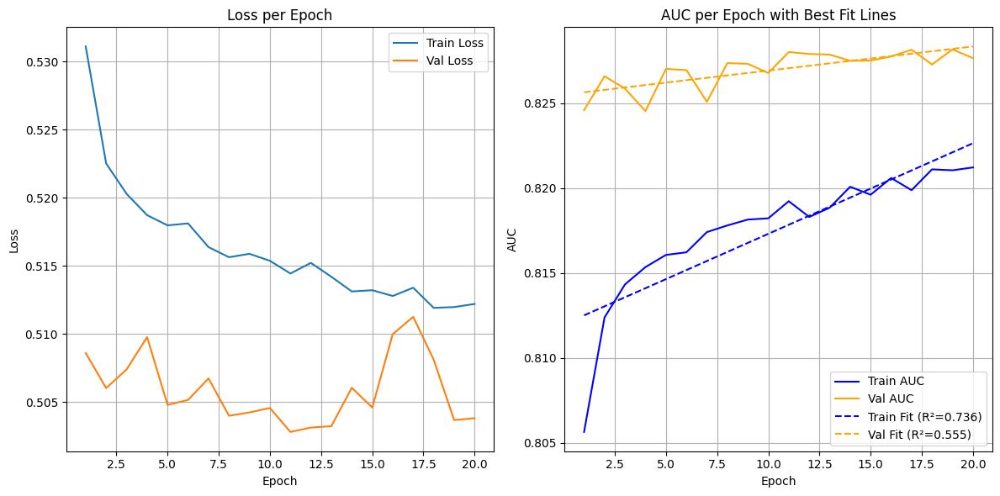


Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 9/20
batch_size=128, embed_dim=32, num_heads=4, dropout=0.653, mlp_hidden_dims=(64, 128, 256), lr=0.006898, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.5688 | Train AUC: 0.7799 | Train Precision: 0.6866 | Train Recall: 0.8162 | Train Accuracy: 0.7218 || Val Loss: 0.5245 | Val AUC: 0.8168 | Val Precision: 0.6931 | Val Recall: 0.8805 | Val Accuracy: 0.7453
--> Saved best model with Val AUC: 0.8168
Epoch 2/30 | Train Loss: 0.5698 | Train AUC: 0.7847 | Train Precision: 0.6775 | Train Recall: 0.8583 | Train Accuracy: 0.7249 || Val Loss: 0.5368 | Val AUC: 0.8178 | Val Precision: 0.6995 | Val Recall: 0.8726 | Val Accuracy: 0.7489
--> Saved best model with Val AUC: 0.8178
Epoch 3/30 | Train Loss: 0.5729 | Train AUC: 0.7816 | Train Precision: 0.6720 | Train Recall: 0.8710 | Train Accuracy: 0.7229 || Val Loss: 0.5273 | Val AUC: 0.8170 | Val Precision: 0.6934 | Val Recall: 0.8745 | Val Accuracy: 0.7439
Epoch 4/

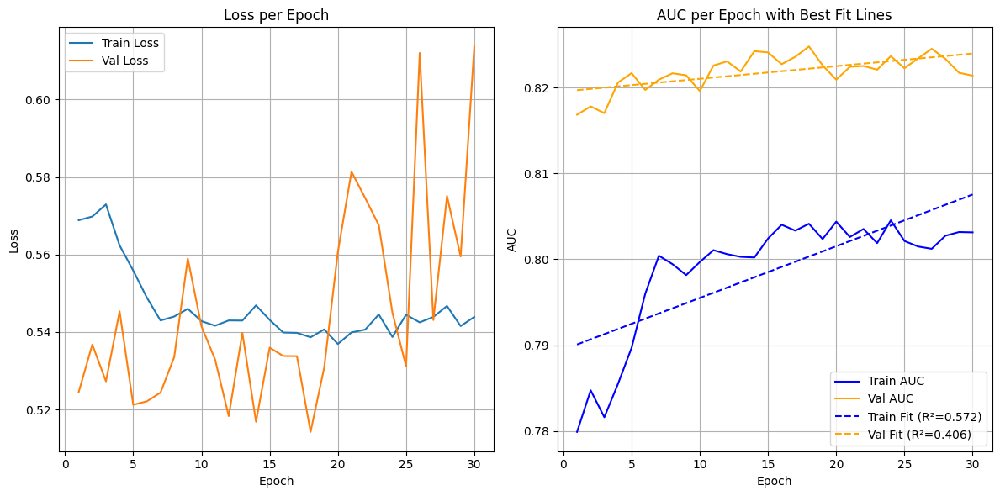


Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 10/20
batch_size=128, embed_dim=256, num_heads=8, dropout=0.419, mlp_hidden_dims=(8, 16, 32), lr=0.005482, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 49.6650 | Train AUC: 0.5003 | Train Precision: 0.5001 | Train Recall: 0.9854 | Train Accuracy: 0.5002 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/20 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/20 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/20 | Train Loss: 49.9992 | Train AUC:

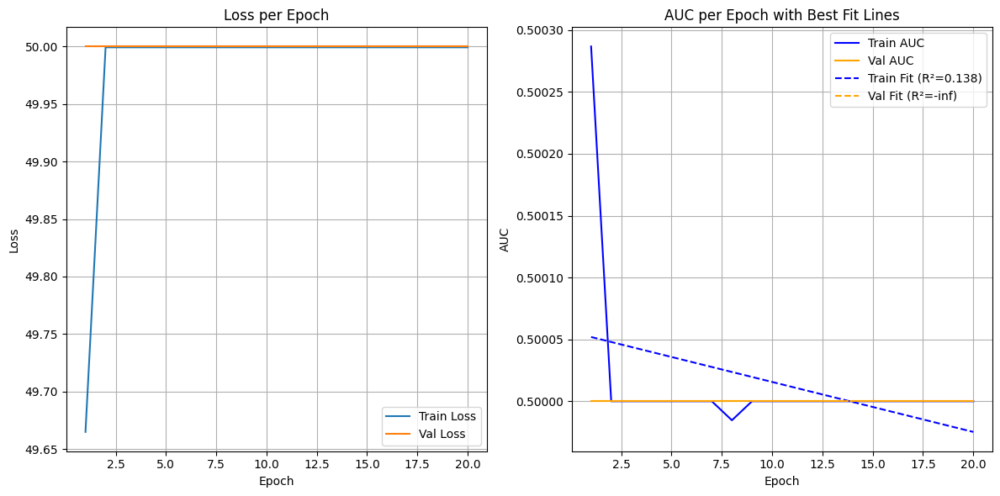

Removed structure: batch_size=128, embed_dim=256, num_heads=8, mlp_hidden_dims=(8, 16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model4'

Trial 11/20
batch_size=64, embed_dim=32, num_heads=4, dropout=0.786, mlp_hidden_dims=(8, 16, 32), lr=0.008614, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 0.6287 | Train AUC: 0.7125 | Train Precision: 0.6233 | Train Recall: 0.8002 | Train Accuracy: 0.6583 || Val Loss: 0.5854 | Val AUC: 0.7952 | Val Precision: 0.6931 | Val Recall: 0.7938 | Val Accuracy: 0.7212
--> Saved best model with Val AUC: 0.7952
Epoch 2/45 | Train Loss: 0.6163 | Train AUC: 0.7298 | Train Precision: 0.6357 | Train Recall: 0.8075 | Train Accuracy: 0.6724 || Val Loss: 0.6250 | Val AUC: 0.7932 | Val Precision: 0.7296 | Val Recall: 0.6534 | Val Accuracy: 0.7056
Epoch 3/45 | Train Loss: 0.6106 | Train AUC: 0.7306 | Train Precision: 0.6305 | Train Recall: 0.8340 | Train Accuracy: 0.6727 || Val Loss: 0.6558 | Val AUC: 0.8048 | Val Precision: 0.7179 | Val 

In [ ]:
best_model4, best_config4, history4, possible_structures = random_search(input_dim=len(feature_names), device=device, n_trials=20, save_dir="/content/drive/MyDrive/model4")


Trial 1/10
batch_size=256, embed_dim=64, num_heads=8, dropout=0.783, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.008636, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 0.6246 | Train AUC: 0.7304 | Train Precision: 0.6367 | Train Recall: 0.8128 | Train Accuracy: 0.6745 || Val Loss: 0.5501 | Val AUC: 0.8130 | Val Precision: 0.7076 | Val Recall: 0.8228 | Val Accuracy: 0.7414
--> Saved best model with Val AUC: 0.8130
Epoch 2/35 | Train Loss: 0.6192 | Train AUC: 0.7377 | Train Precision: 0.6308 | Train Recall: 0.8684 | Train Accuracy: 0.6801 || Val Loss: 0.6346 | Val AUC: 0.8108 | Val Precision: 0.7327 | Val Recall: 0.7462 | Val Accuracy: 0.7370
Epoch 3/35 | Train Loss: 0.6008 | Train AUC: 0.7439 | Train Precision: 0.6340 | Train Recall: 0.8895 | Train Accuracy: 0.6880 || Val Loss: 0.5806 | Val AUC: 0.8011 | Val Precision: 0.6784 | Val Recall: 0.8758 | Val Accuracy: 0.7303
Epoch 4/35 | Train Loss: 0.5954 | Train AUC: 0.7604 | Train Precision: 0.6451 | Train Recall: 0.8844 | Train A

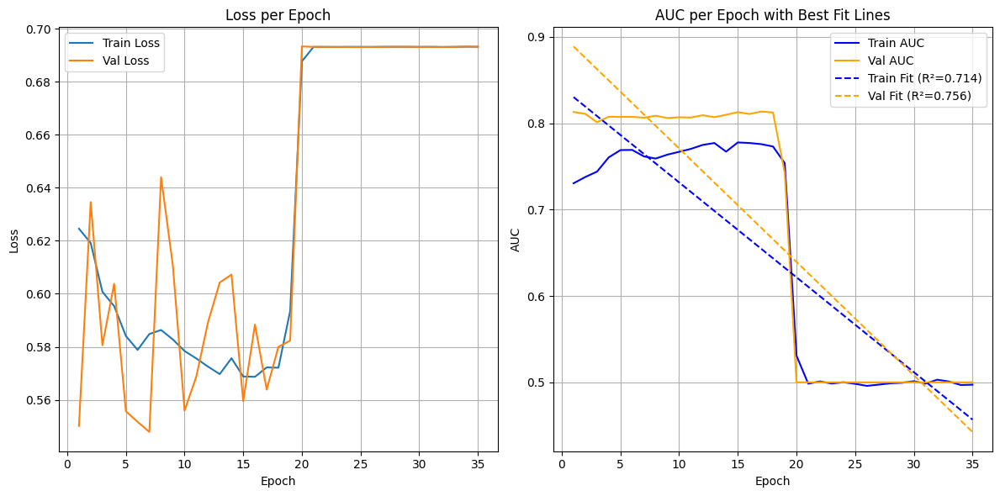


Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 2/10
batch_size=64, embed_dim=64, num_heads=8, dropout=0.136, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.001465, epochs=70
Using device: cuda
Epoch 1/70 | Train Loss: 0.5276 | Train AUC: 0.8079 | Train Precision: 0.7126 | Train Recall: 0.8117 | Train Accuracy: 0.7422 || Val Loss: 0.5117 | Val AUC: 0.8236 | Val Precision: 0.7111 | Val Recall: 0.8534 | Val Accuracy: 0.7533
--> Saved best model with Val AUC: 0.8236
Epoch 2/70 | Train Loss: 0.5186 | Train AUC: 0.8150 | Train Precision: 0.7144 | Train Recall: 0.8258 | Train Accuracy: 0.7478 || Val Loss: 0.5091 | Val AUC: 0.8240 | Val Precision: 0.7247 | Val Recall: 0.8191 | Val Accuracy: 0.7539
--> Saved best model with Val AUC: 0.8240
Epoch 3/70 | Train Loss: 0.5182 | Train AUC: 0.8155 | Train Precision: 0.7132 | Train Recall: 0.8338 | Train Accuracy: 0.7492 || Val Loss: 0.5081 | Val AUC: 0.8239 | Val Precision: 0.7243 | Val Recall: 0.8192 | Val Accuracy: 0.7537
E

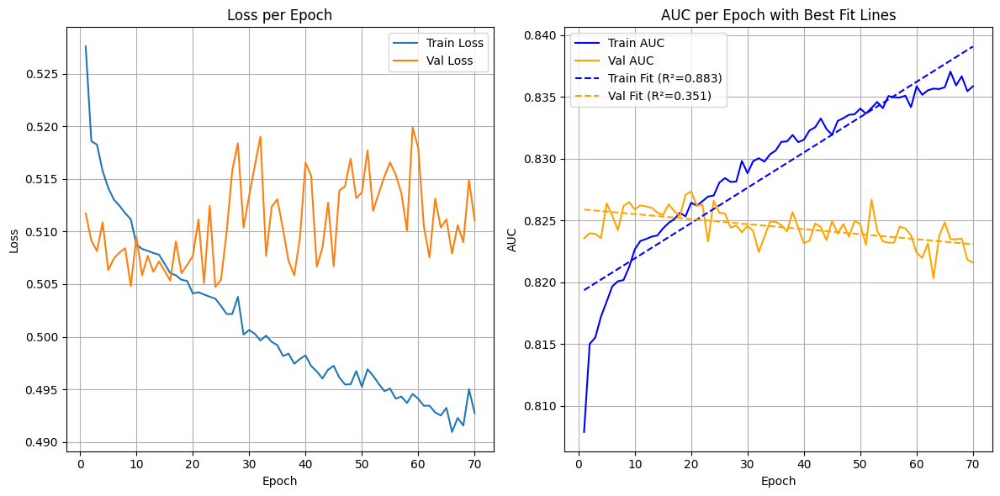


Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 3/10
batch_size=256, embed_dim=16, num_heads=8, dropout=0.723, mlp_hidden_dims=(16, 32, 64), lr=0.002658, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.5472 | Train AUC: 0.7939 | Train Precision: 0.6992 | Train Recall: 0.8000 | Train Accuracy: 0.7279 || Val Loss: 0.5088 | Val AUC: 0.8234 | Val Precision: 0.7154 | Val Recall: 0.8362 | Val Accuracy: 0.7517
--> Saved best model with Val AUC: 0.8234
Epoch 2/25 | Train Loss: 0.5298 | Train AUC: 0.8078 | Train Precision: 0.7011 | Train Recall: 0.8435 | Train Accuracy: 0.7419 || Val Loss: 0.5069 | Val AUC: 0.8252 | Val Precision: 0.7143 | Val Recall: 0.8449 | Val Accuracy: 0.7534
--> Saved best model with Val AUC: 0.8252
Epoch 3/25 | Train Loss: 0.5269 | Train AUC: 0.8098 | Train Precision: 0.7033 | Train Recall: 0.8451 | Train Accuracy: 0.7443 || Val Loss: 0.5059 | Val AUC: 0.8258 | Val Precision: 0.7155 | Val Recall: 0.8491 | Val Accuracy: 0.7557
--> Saved 

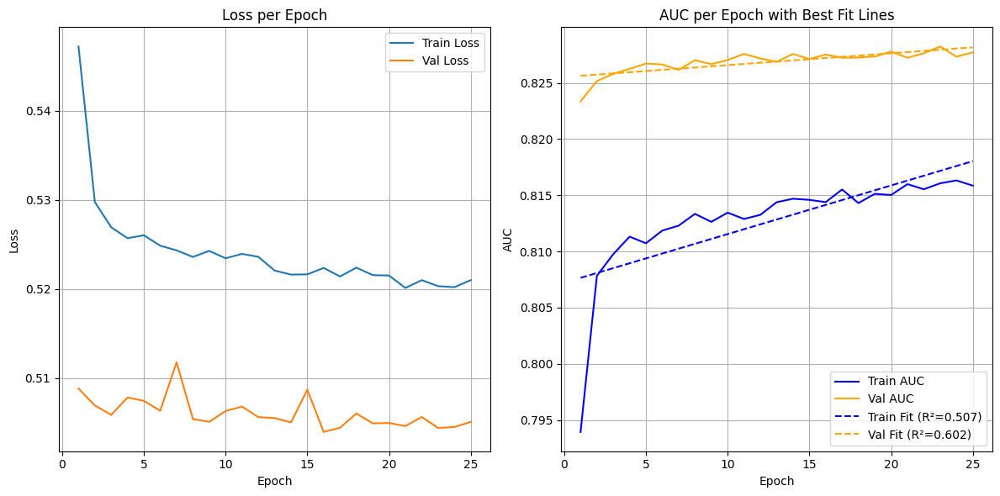


Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 4/10
batch_size=512, embed_dim=16, num_heads=4, dropout=0.607, mlp_hidden_dims=(16, 32, 64, 128), lr=0.005752, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5501 | Train AUC: 0.7915 | Train Precision: 0.6994 | Train Recall: 0.7876 | Train Accuracy: 0.7245 || Val Loss: 0.5127 | Val AUC: 0.8219 | Val Precision: 0.7284 | Val Recall: 0.7928 | Val Accuracy: 0.7486
--> Saved best model with Val AUC: 0.8219
Epoch 2/10 | Train Loss: 0.5295 | Train AUC: 0.8082 | Train Precision: 0.7077 | Train Recall: 0.8303 | Train Accuracy: 0.7437 || Val Loss: 0.5074 | Val AUC: 0.8252 | Val Precision: 0.7189 | Val Recall: 0.8329 | Val Accuracy: 0.7536
--> Saved best model with Val AUC: 0.8252
Epoch 3/10 | Train Loss: 0.5261 | Train AUC: 0.8113 | Train Precision: 0.7071 | Train Recall: 0.8411 | Train Accuracy: 0.7464 || Val Loss: 0.5058 | Val AUC: 0.8261 | Val Precision: 0.7141 | Val Recall: 0.8516 | Val Accuracy: 0.7554
--> S

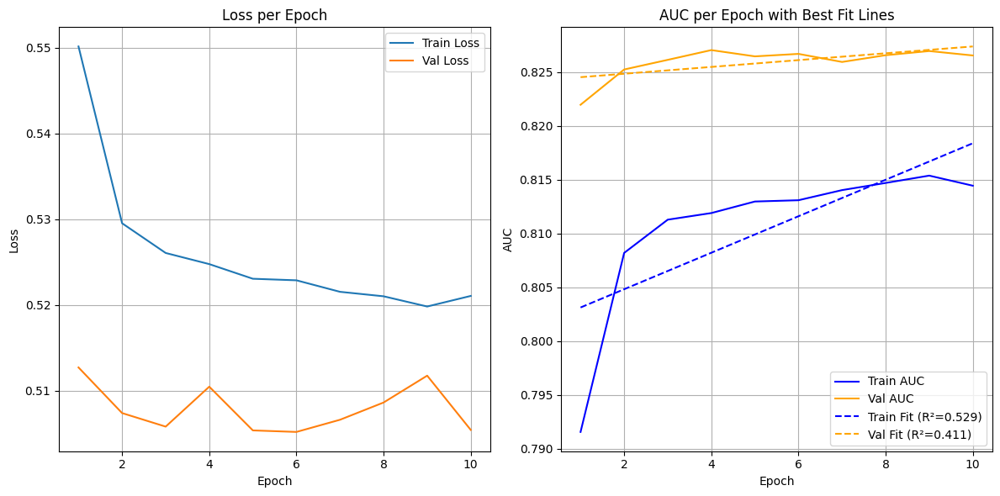


Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 5/10
batch_size=128, embed_dim=32, num_heads=8, dropout=0.472, mlp_hidden_dims=(128, 256, 512), lr=0.004271, epochs=50
Using device: cuda
Epoch 1/50 | Train Loss: 0.5469 | Train AUC: 0.7958 | Train Precision: 0.7059 | Train Recall: 0.8031 | Train Accuracy: 0.7343 || Val Loss: 0.5195 | Val AUC: 0.8236 | Val Precision: 0.7113 | Val Recall: 0.8522 | Val Accuracy: 0.7532
--> Saved best model with Val AUC: 0.8236
Epoch 2/50 | Train Loss: 0.5355 | Train AUC: 0.8048 | Train Precision: 0.7013 | Train Recall: 0.8394 | Train Accuracy: 0.7409 || Val Loss: 0.5172 | Val AUC: 0.8225 | Val Precision: 0.7001 | Val Recall: 0.8752 | Val Accuracy: 0.7501
Epoch 3/50 | Train Loss: 0.5362 | Train AUC: 0.8044 | Train Precision: 0.6978 | Train Recall: 0.8505 | Train Accuracy: 0.7411 || Val Loss: 0.5127 | Val AUC: 0.8230 | Val Precision: 0.7207 | Val Recall: 0.8329 | Val Accuracy: 0.7550
Epoch 4/50 | Train Loss: 0.5345 | Train AUC: 0.80

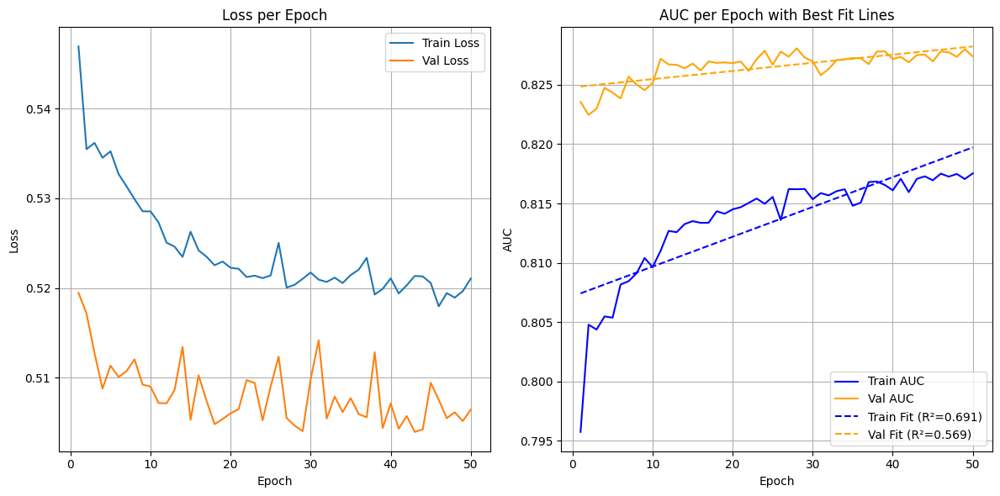


Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 6/10
batch_size=32, embed_dim=512, num_heads=4, dropout=0.2, mlp_hidden_dims=(8, 16, 32), lr=0.000861, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.6641 | Train AUC: 0.5878 | Train Precision: 0.5598 | Train Recall: 0.4343 | Train Accuracy: 0.5464 || Val Loss: 0.6931 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/10 | Train Loss: 0.6932 | Train AUC: 0.4963 | Train Precision: 0.4957 | Train Recall: 0.4208 | Train Accuracy: 0.4963 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/10 | Train Loss: 0.7002 | Train AUC: 0.4997 | Train Precision: 0.5010 | Train Recall: 0.6640 | Train Accuracy: 0.5013 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/10 | Train Loss: 0.6931 | Train AUC: 0.5033 | T

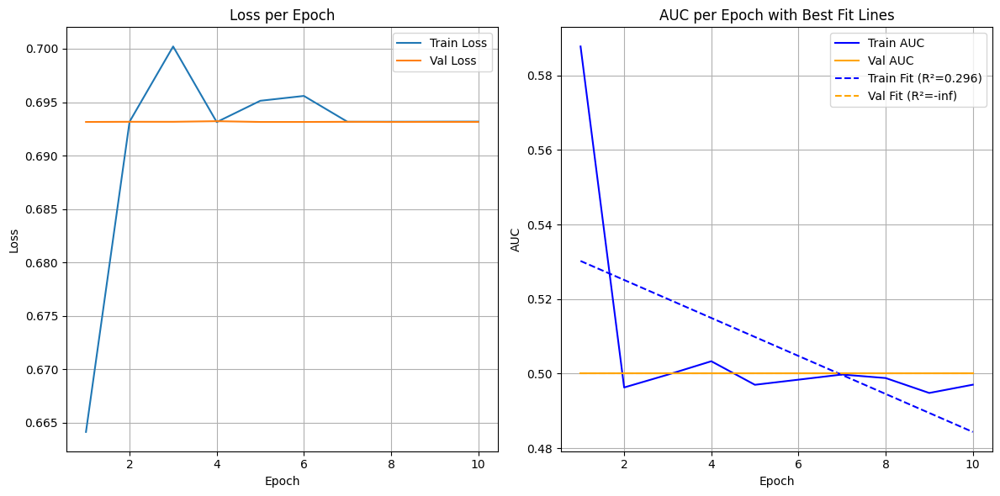

Removed structure: batch_size=32, embed_dim=512, num_heads=4, mlp_hidden_dims=(8, 16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 7/10
batch_size=16, embed_dim=16, num_heads=16, dropout=0.696, mlp_hidden_dims=(32, 64, 128, 256, 512), lr=0.007364, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.7262 | Train AUC: 0.5327 | Train Precision: 0.5145 | Train Recall: 0.5993 | Train Accuracy: 0.5169 || Val Loss: 0.6939 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/25 | Train Loss: 0.6990 | Train AUC: 0.4947 | Train Precision: 0.4961 | Train Recall: 0.4922 | Train Accuracy: 0.4961 || Val Loss: 0.6933 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/25 | Train Loss: 0.7054 | Train AUC: 0.4949 | Train Precision: 0.4965 | Train Recall: 0.5244 | Train Accuracy: 0.4963 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.

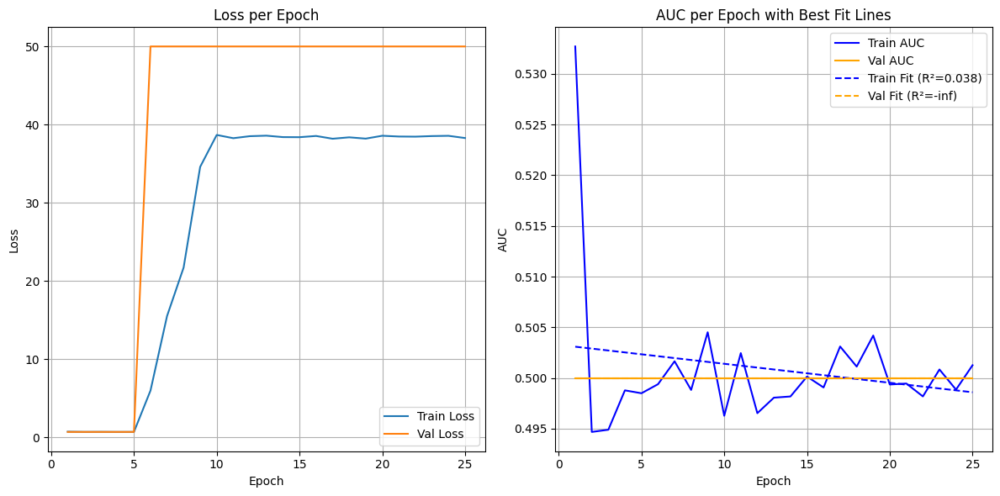

Removed structure: batch_size=16, embed_dim=16, num_heads=16, mlp_hidden_dims=(32, 64, 128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 8/10
batch_size=512, embed_dim=32, num_heads=16, dropout=0.338, mlp_hidden_dims=(8, 16), lr=0.008379, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 0.5749 | Train AUC: 0.7831 | Train Precision: 0.7005 | Train Recall: 0.7783 | Train Accuracy: 0.7228 || Val Loss: 0.5131 | Val AUC: 0.8231 | Val Precision: 0.7113 | Val Recall: 0.8468 | Val Accuracy: 0.7515
--> Saved best model with Val AUC: 0.8231
Epoch 2/35 | Train Loss: 0.5265 | Train AUC: 0.8097 | Train Precision: 0.7088 | Train Recall: 0.8269 | Train Accuracy: 0.7436 || Val Loss: 0.5218 | Val AUC: 0.8244 | Val Precision: 0.7349 | Val Recall: 0.7845 | Val Accuracy: 0.7508
--> Saved best model with Val AUC: 0.8244
Epoch 3/35 | Train Loss: 0.5220 | Train AUC: 0.8129 | Train Precision: 0.7084 | Train Recall: 0.8371 | Train Accuracy: 0.7463 || Val Loss: 0.511

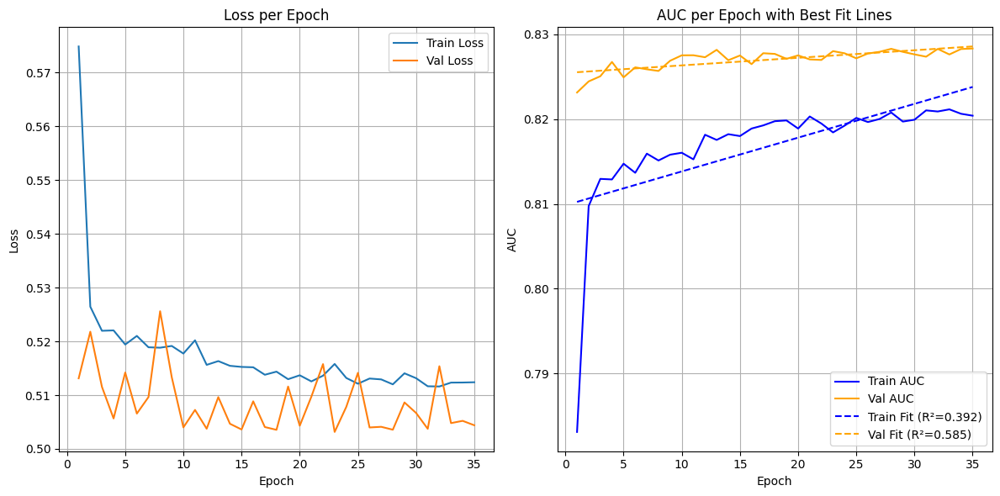


Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 9/10
batch_size=32, embed_dim=512, num_heads=8, dropout=0.169, mlp_hidden_dims=(64, 128, 256), lr=0.001514, epochs=65
Using device: cuda
Epoch 1/65 | Train Loss: 0.6463 | Train AUC: 0.6553 | Train Precision: 0.5653 | Train Recall: 0.8122 | Train Accuracy: 0.5938 || Val Loss: 0.6933 | Val AUC: 0.4999 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.4999
--> Saved best model with Val AUC: 0.4999
Epoch 2/65 | Train Loss: 0.6932 | Train AUC: 0.5024 | Train Precision: 0.5047 | Train Recall: 0.4315 | Train Accuracy: 0.5041 || Val Loss: 0.6933 | Val AUC: 0.4999 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.4999
Epoch 3/65 | Train Loss: 0.6932 | Train AUC: 0.4950 | Train Precision: 0.4979 | Train Recall: 0.4732 | Train Accuracy: 0.4980 || Val Loss: 0.6933 | Val AUC: 0.4999 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/65 | Train Loss: 0.6931 | Train AUC: 0.503

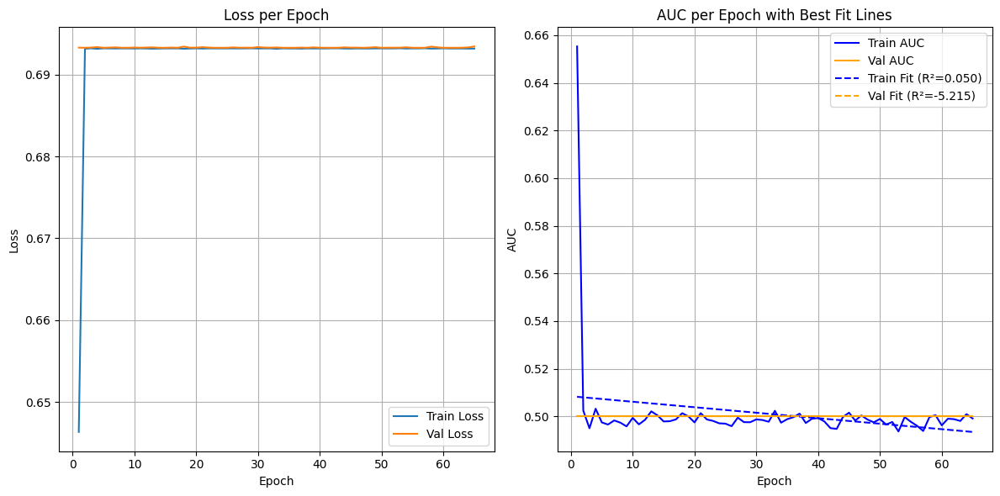

Removed structure: batch_size=32, embed_dim=512, num_heads=8, mlp_hidden_dims=(64, 128, 256)

Saved model and trial summaries to '/content/drive/MyDrive/model5'

Trial 10/10
batch_size=256, embed_dim=32, num_heads=4, dropout=0.232, mlp_hidden_dims=(64, 128), lr=0.003407, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.5317 | Train AUC: 0.8045 | Train Precision: 0.7090 | Train Recall: 0.8089 | Train Accuracy: 0.7384 || Val Loss: 0.5117 | Val AUC: 0.8256 | Val Precision: 0.7250 | Val Recall: 0.8214 | Val Accuracy: 0.7549
--> Saved best model with Val AUC: 0.8256
Epoch 2/30 | Train Loss: 0.5175 | Train AUC: 0.8158 | Train Precision: 0.7138 | Train Recall: 0.8310 | Train Accuracy: 0.7489 || Val Loss: 0.5083 | Val AUC: 0.8247 | Val Precision: 0.7110 | Val Recall: 0.8590 | Val Accuracy: 0.7549
Epoch 3/30 | Train Loss: 0.5160 | Train AUC: 0.8172 | Train Precision: 0.7149 | Train Recall: 0.8344 | Train Accuracy: 0.7508 || Val Loss: 0.5063 | Val AUC: 0.8275 | Val Precision: 0.7297 | Val

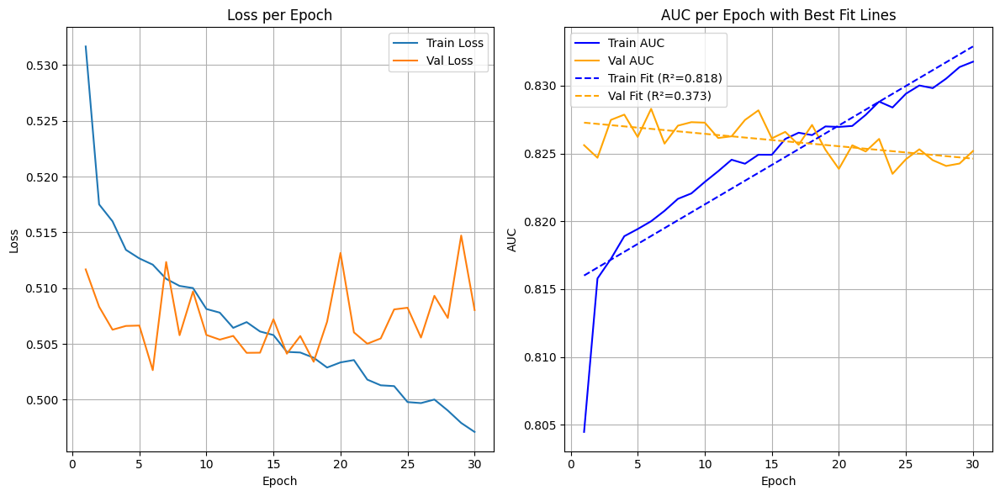


Saved model and trial summaries to '/content/drive/MyDrive/model5'

=== Trial Summary ===

Trial 1 — Removed: False
Params: {'batch_size': 256, 'embed_dim': 64, 'num_heads': 8, 'dropout': 0.783, 'mlp_hidden_dims': [16, 32, 64, 128, 256], 'lr': 0.008636, 'epochs': 35}
Val AUC: 0.8135
Train Fit: y = -0.0110x + 0.8412, R²=0.7140
Val Fit:   y = -0.0131x + 0.9019, R²=0.7564
Train Residuals (first 5): [-0.09979659 -0.08156971 -0.06433268 -0.03687196 -0.01744074]
Val Residuals   (first 5): [-0.07584124 -0.06489412 -0.06147382 -0.04198931 -0.02909791]

Trial 2 — Removed: False
Params: {'batch_size': 64, 'embed_dim': 64, 'num_heads': 8, 'dropout': 0.136, 'mlp_hidden_dims': [16, 32, 64, 128, 256], 'lr': 0.001465, 'epochs': 70}
Val AUC: 0.8274
Train Fit: y = 0.0003x + 0.8191, R²=0.8827
Val Fit:   y = -0.0000x + 0.8259, R²=0.3506
Train Residuals (first 5): [-0.01146953 -0.00463091 -0.00439404 -0.00299099 -0.0020802 ]
Val Residuals   (first 5): [-0.00232675 -0.00187398 -0.00188929 -0.00219538  0.0

In [ ]:
best_model5, best_config5, history5, possible_structures = random_search(input_dim=len(feature_names), device=device, n_trials=10, save_dir="/content/drive/MyDrive/model5")


Trial 1/10
batch_size=256, embed_dim=128, num_heads=2, dropout=0.73, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.006431, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.6465 | Train AUC: 0.7162 | Train Precision: 0.6192 | Train Recall: 0.8387 | Train Accuracy: 0.6614 || Val Loss: 0.7381 | Val AUC: 0.6986 | Val Precision: 0.7909 | Val Recall: 0.0451 | Val Accuracy: 0.5166
--> Saved best model with Val AUC: 0.6986
Epoch 2/30 | Train Loss: 0.6183 | Train AUC: 0.7235 | Train Precision: 0.6261 | Train Recall: 0.8327 | Train Accuracy: 0.6677 || Val Loss: 0.6253 | Val AUC: 0.7562 | Val Precision: 0.7473 | Val Recall: 0.3869 | Val Accuracy: 0.6280
--> Saved best model with Val AUC: 0.7562
Epoch 3/30 | Train Loss: 0.6114 | Train AUC: 0.7317 | Train Precision: 0.6298 | Train Recall: 0.8511 | Train Accuracy: 0.6754 || Val Loss: 0.5994 | Val AUC: 0.7623 | Val Precision: 0.7211 | Val Recall: 0.5776 | Val Accuracy: 0.6771
--> Saved best model with Val AUC: 0.7623
Epoch 4/30 | Train Loss: 0

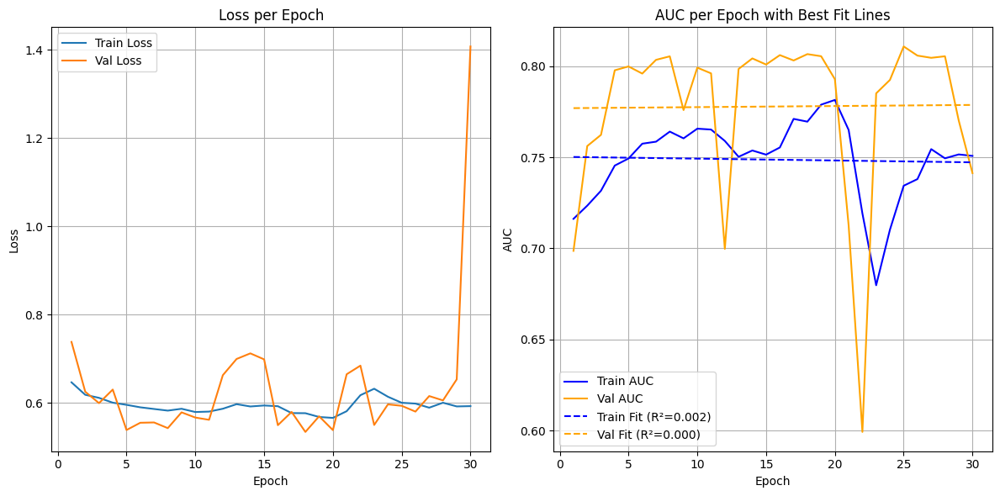


Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 2/10
batch_size=16, embed_dim=256, num_heads=8, dropout=0.705, mlp_hidden_dims=(8, 16, 32, 64), lr=0.001977, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.6840 | Train AUC: 0.5776 | Train Precision: 0.5421 | Train Recall: 0.5903 | Train Accuracy: 0.5458 || Val Loss: 0.6370 | Val AUC: 0.7009 | Val Precision: 0.6390 | Val Recall: 0.8273 | Val Accuracy: 0.6800
--> Saved best model with Val AUC: 0.7009
Epoch 2/15 | Train Loss: 0.6930 | Train AUC: 0.5008 | Train Precision: 0.5001 | Train Recall: 0.4988 | Train Accuracy: 0.5001 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/15 | Train Loss: 0.6932 | Train AUC: 0.4987 | Train Precision: 0.4999 | Train Recall: 0.4802 | Train Accuracy: 0.4999 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/15 | Train Loss: 0.6932 | Train AUC: 0.50

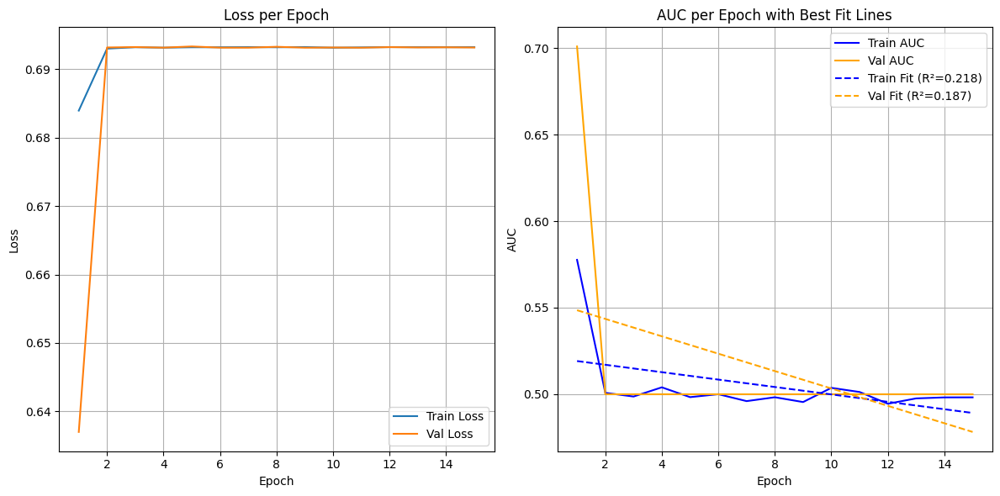

Removed structure: batch_size=16, embed_dim=256, num_heads=8, mlp_hidden_dims=(8, 16, 32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 3/10
batch_size=32, embed_dim=128, num_heads=8, dropout=0.321, mlp_hidden_dims=(8, 16), lr=0.00872, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.7392 | Train AUC: 0.5023 | Train Precision: 0.5034 | Train Recall: 0.4986 | Train Accuracy: 0.5033 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/55 | Train Loss: 0.6934 | Train AUC: 0.4976 | Train Precision: 0.4970 | Train Recall: 0.5559 | Train Accuracy: 0.4966 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/55 | Train Loss: 0.6934 | Train AUC: 0.4965 | Train Precision: 0.4978 | Train Recall: 0.5117 | Train Accuracy: 0.4977 || Val Loss: 0.6935 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Re

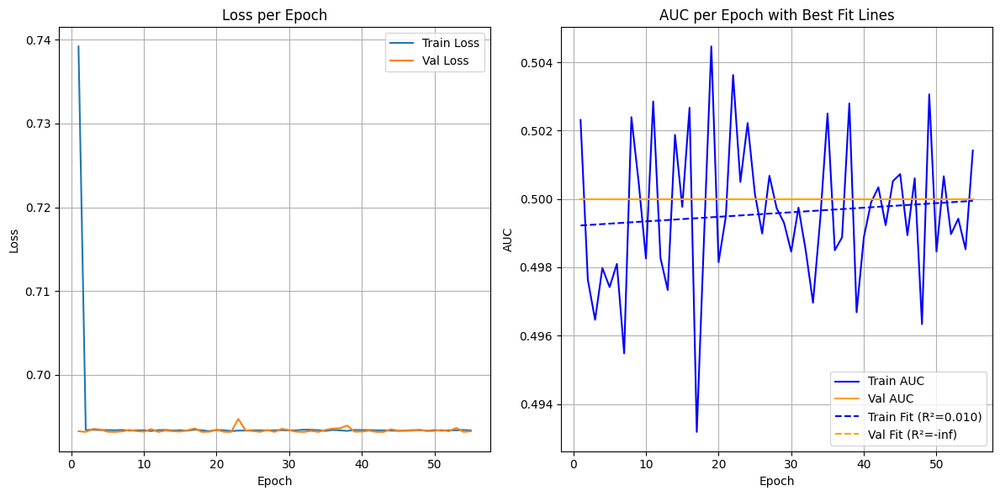

Removed structure: batch_size=32, embed_dim=128, num_heads=8, mlp_hidden_dims=(8, 16)

Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 4/10
batch_size=128, embed_dim=128, num_heads=4, dropout=0.438, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.001517, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 0.5463 | Train AUC: 0.7944 | Train Precision: 0.7008 | Train Recall: 0.8050 | Train Accuracy: 0.7307 || Val Loss: 0.5207 | Val AUC: 0.8212 | Val Precision: 0.6994 | Val Recall: 0.8713 | Val Accuracy: 0.7484
--> Saved best model with Val AUC: 0.8212
Epoch 2/20 | Train Loss: 0.5353 | Train AUC: 0.8032 | Train Precision: 0.7027 | Train Recall: 0.8250 | Train Accuracy: 0.7380 || Val Loss: 0.5172 | Val AUC: 0.8225 | Val Precision: 0.7218 | Val Recall: 0.8273 | Val Accuracy: 0.7542
--> Saved best model with Val AUC: 0.8225
Epoch 3/20 | Train Loss: 0.5328 | Train AUC: 0.8052 | Train Precision: 0.7028 | Train Recall: 0.8329 | Train Accuracy: 0.7403 || Val Loss: 0.5193 |

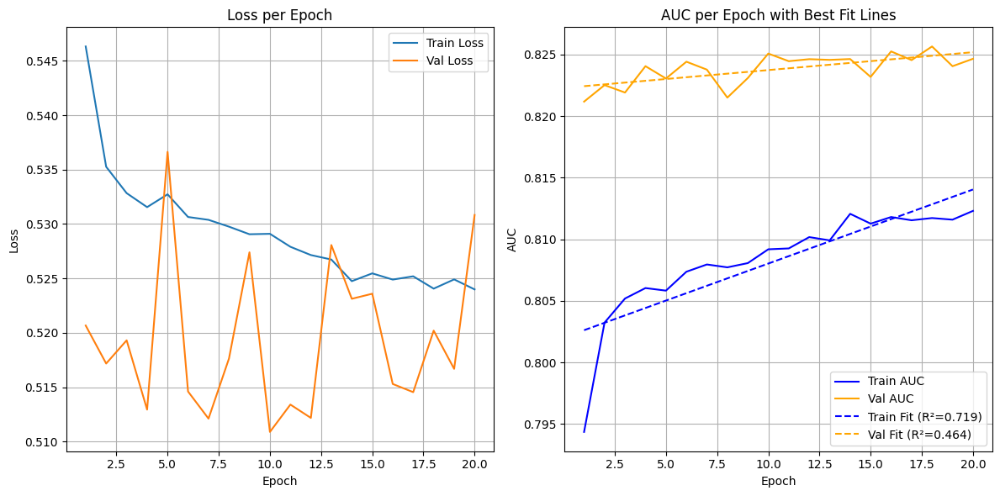


Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 5/10
batch_size=256, embed_dim=128, num_heads=8, dropout=0.515, mlp_hidden_dims=(8, 16), lr=0.008399, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.7214 | Train AUC: 0.7576 | Train Precision: 0.6567 | Train Recall: 0.8308 | Train Accuracy: 0.6983 || Val Loss: 0.5244 | Val AUC: 0.8184 | Val Precision: 0.7158 | Val Recall: 0.8201 | Val Accuracy: 0.7472
--> Saved best model with Val AUC: 0.8184
Epoch 2/30 | Train Loss: 0.5600 | Train AUC: 0.7862 | Train Precision: 0.6752 | Train Recall: 0.8501 | Train Accuracy: 0.7206 || Val Loss: 0.5588 | Val AUC: 0.8187 | Val Precision: 0.7311 | Val Recall: 0.7908 | Val Accuracy: 0.7500
--> Saved best model with Val AUC: 0.8187
Epoch 3/30 | Train Loss: 0.5606 | Train AUC: 0.7865 | Train Precision: 0.6748 | Train Recall: 0.8635 | Train Accuracy: 0.7236 || Val Loss: 0.5366 | Val AUC: 0.8181 | Val Precision: 0.7200 | Val Recall: 0.8207 | Val Accuracy: 0.7508
Epoch 4/30 | T

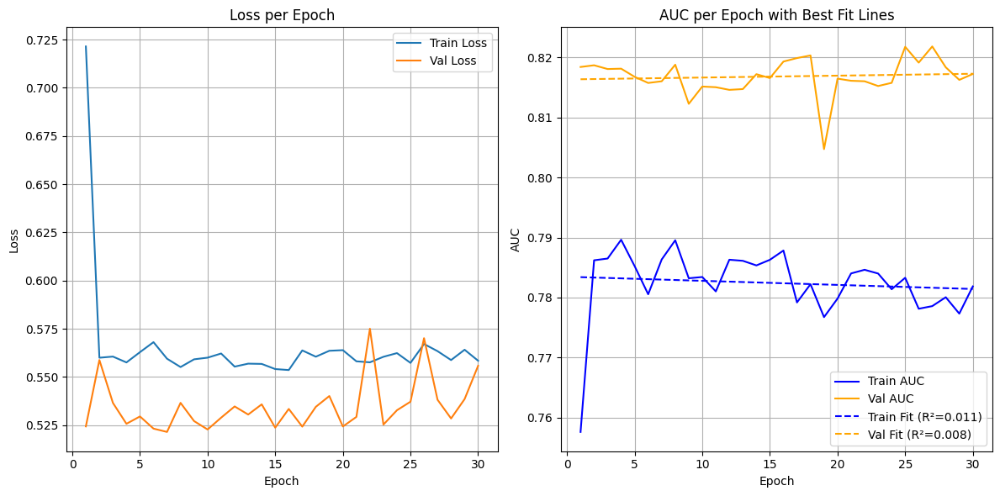


Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 6/10
batch_size=256, embed_dim=256, num_heads=4, dropout=0.212, mlp_hidden_dims=(32, 64), lr=0.006252, epochs=65
Using device: cuda
Epoch 1/65 | Train Loss: 49.6380 | Train AUC: 0.4985 | Train Precision: 0.4960 | Train Recall: 0.0680 | Train Accuracy: 0.4994 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/65 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/65 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/65 | Train Loss: 50.0008 | Train AUC: 0.5

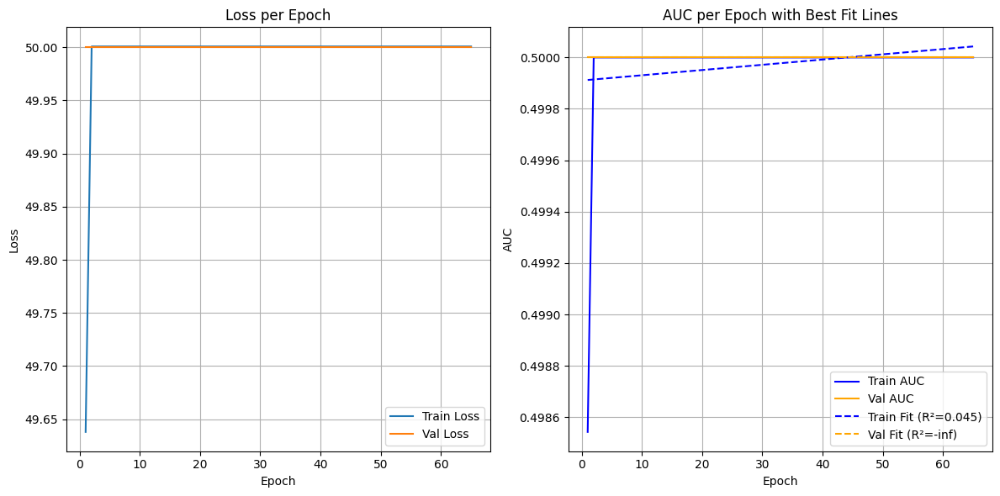

Removed structure: batch_size=256, embed_dim=256, num_heads=4, mlp_hidden_dims=(32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 7/10
batch_size=64, embed_dim=128, num_heads=4, dropout=0.138, mlp_hidden_dims=(32, 64), lr=0.007147, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 49.7644 | Train AUC: 0.4998 | Train Precision: 0.4979 | Train Recall: 0.0037 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/10 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/10 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val 

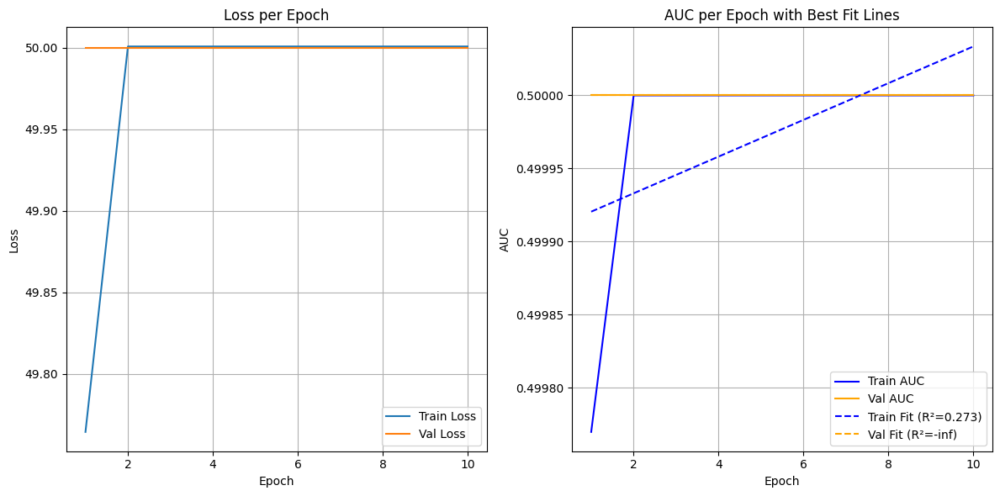

Removed structure: batch_size=64, embed_dim=128, num_heads=4, mlp_hidden_dims=(32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 8/10
batch_size=512, embed_dim=64, num_heads=4, dropout=0.561, mlp_hidden_dims=(64, 128, 256, 512), lr=0.008723, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.6779 | Train AUC: 0.7313 | Train Precision: 0.6417 | Train Recall: 0.7837 | Train Accuracy: 0.6731 || Val Loss: 0.5325 | Val AUC: 0.8128 | Val Precision: 0.7100 | Val Recall: 0.8247 | Val Accuracy: 0.7439
--> Saved best model with Val AUC: 0.8128
Epoch 2/10 | Train Loss: 0.5593 | Train AUC: 0.7864 | Train Precision: 0.6835 | Train Recall: 0.8341 | Train Accuracy: 0.7240 || Val Loss: 0.5449 | Val AUC: 0.8124 | Val Precision: 0.7107 | Val Recall: 0.8326 | Val Accuracy: 0.7468
Epoch 3/10 | Train Loss: 0.5589 | Train AUC: 0.7873 | Train Precision: 0.6809 | Train Recall: 0.8482 | Train Accuracy: 0.7253 || Val Loss: 0.5283 | Val AUC: 0.8123 | Val Precision: 0.6965 | 

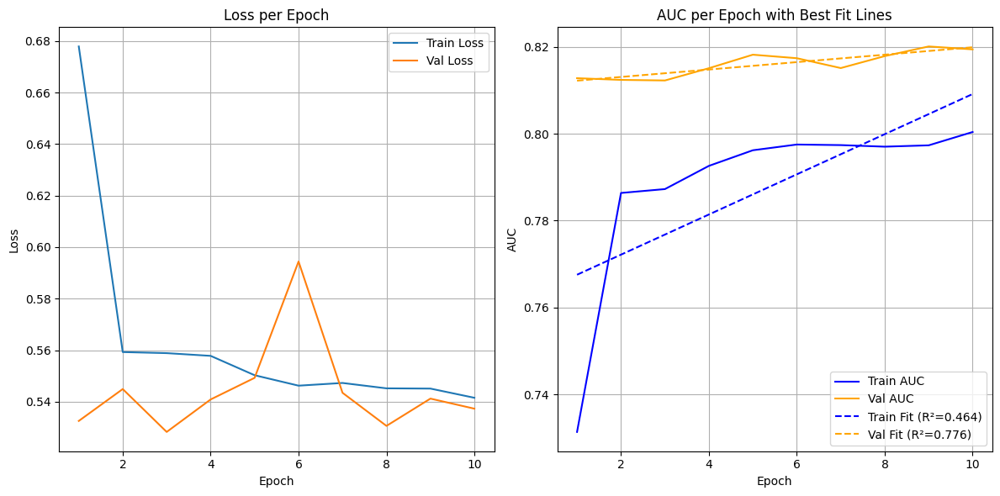


Saved model and trial summaries to '/content/drive/MyDrive/model6'

Trial 9/10
batch_size=16, embed_dim=512, num_heads=2, dropout=0.75, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.000128, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.5690 | Train AUC: 0.7762 | Train Precision: 0.6932 | Train Recall: 0.7786 | Train Accuracy: 0.7170 || Val Loss: 0.5581 | Val AUC: 0.8128 | Val Precision: 0.6645 | Val Recall: 0.9168 | Val Accuracy: 0.7270
--> Saved best model with Val AUC: 0.8128
Epoch 2/55 | Train Loss: 0.5565 | Train AUC: 0.7874 | Train Precision: 0.6907 | Train Recall: 0.8239 | Train Accuracy: 0.7275 || Val Loss: 0.5769 | Val AUC: 0.8152 | Val Precision: 0.7059 | Val Recall: 0.8461 | Val Accuracy: 0.7468
--> Saved best model with Val AUC: 0.8152


In [ ]:
best_model6, best_config6, history6, possible_structures = random_search(input_dim=len(feature_names), device=device, n_trials=10, save_dir="/content/drive/MyDrive/model6")


Trial 1/20
batch_size=64, embed_dim=32, num_heads=4, dropout=0.239, mlp_hidden_dims=(32, 64, 128, 256), lr=0.003971, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5364 | Train AUC: 0.8023 | Train Precision: 0.7068 | Train Recall: 0.8149 | Train Accuracy: 0.7384 || Val Loss: 0.5177 | Val AUC: 0.8192 | Val Precision: 0.7202 | Val Recall: 0.8178 | Val Accuracy: 0.7501
--> Saved best model with Val AUC: 0.8192
Epoch 2/15 | Train Loss: 0.5261 | Train AUC: 0.8105 | Train Precision: 0.7058 | Train Recall: 0.8391 | Train Accuracy: 0.7447 || Val Loss: 0.5190 | Val AUC: 0.8229 | Val Precision: 0.7192 | Val Recall: 0.8343 | Val Accuracy: 0.7543
--> Saved best model with Val AUC: 0.8229
Epoch 3/15 | Train Loss: 0.5228 | Train AUC: 0.8122 | Train Precision: 0.7074 | Train Recall: 0.8413 | Train Accuracy: 0.7467 || Val Loss: 0.5097 | Val AUC: 0.8252 | Val Precision: 0.7140 | Val Recall: 0.8461 | Val Accuracy: 0.7536
--> Saved best model with Val AUC: 0.8252
Epoch 4/15 | Train Loss: 0.5221

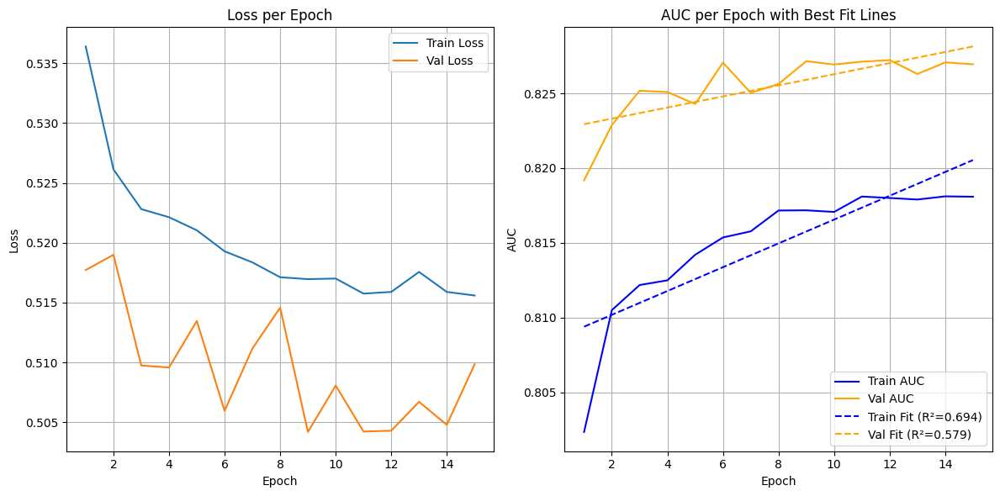


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 2/20
batch_size=256, embed_dim=512, num_heads=8, dropout=0.317, mlp_hidden_dims=(16, 32, 64, 128), lr=0.007458, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 49.5480 | Train AUC: 0.4992 | Train Precision: 0.5000 | Train Recall: 0.0122 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/45 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/45 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/45 | Train Loss: 50.0008 | Train

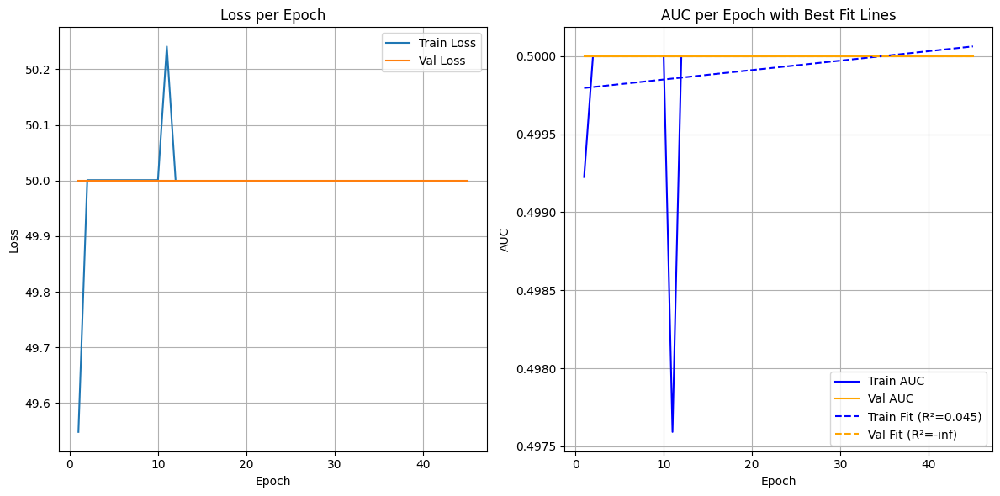

Removed structure: batch_size=256, embed_dim=512, num_heads=8, mlp_hidden_dims=(16, 32, 64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 3/20
batch_size=32, embed_dim=128, num_heads=4, dropout=0.554, mlp_hidden_dims=(128, 256, 512), lr=0.009412, epochs=60
Using device: cuda
Epoch 1/60 | Train Loss: 0.9456 | Train AUC: 0.5332 | Train Precision: 0.5167 | Train Recall: 0.5439 | Train Accuracy: 0.5176 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/60 | Train Loss: 0.6933 | Train AUC: 0.5041 | Train Precision: 0.5043 | Train Recall: 0.4917 | Train Accuracy: 0.5042 || Val Loss: 0.6934 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/60 | Train Loss: 0.6934 | Train AUC: 0.4941 | Train Precision: 0.4956 | Train Recall: 0.4705 | Train Accuracy: 0.4958 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.0

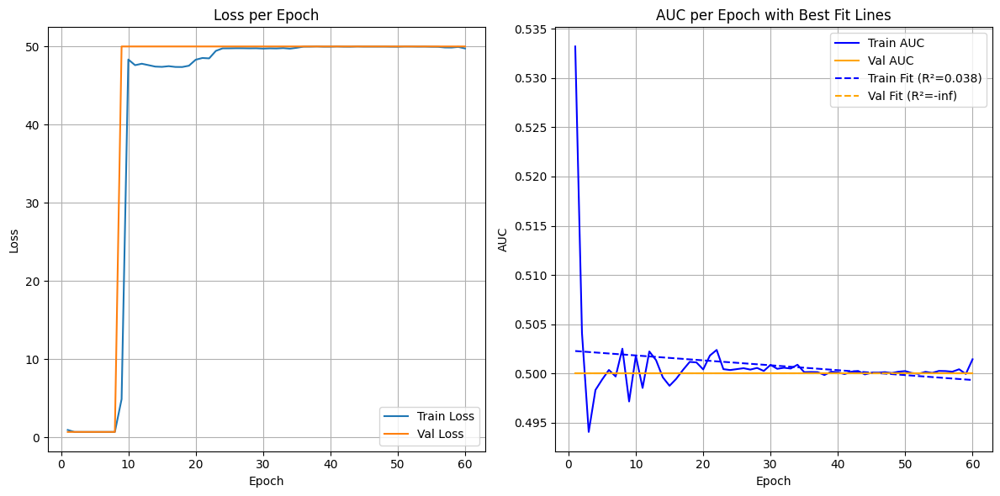

Removed structure: batch_size=32, embed_dim=128, num_heads=4, mlp_hidden_dims=(128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 4/20
batch_size=256, embed_dim=512, num_heads=16, dropout=0.32, mlp_hidden_dims=(16, 32, 64), lr=0.002269, epochs=70
Using device: cuda
Epoch 1/70 | Train Loss: 0.8937 | Train AUC: 0.6887 | Train Precision: 0.6949 | Train Recall: 0.5551 | Train Accuracy: 0.6557 || Val Loss: 0.5555 | Val AUC: 0.8176 | Val Precision: 0.6746 | Val Recall: 0.9052 | Val Accuracy: 0.7343
--> Saved best model with Val AUC: 0.8176
Epoch 2/70 | Train Loss: 0.5624 | Train AUC: 0.7814 | Train Precision: 0.7142 | Train Recall: 0.7037 | Train Accuracy: 0.7111 || Val Loss: 0.5097 | Val AUC: 0.8231 | Val Precision: 0.7195 | Val Recall: 0.8339 | Val Accuracy: 0.7544
--> Saved best model with Val AUC: 0.8231
Epoch 3/70 | Train Loss: 0.5500 | Train AUC: 0.7923 | Train Precision: 0.7198 | Train Recall: 0.7202 | Train Accuracy: 0.7200 || Val Loss: 0.5111 |

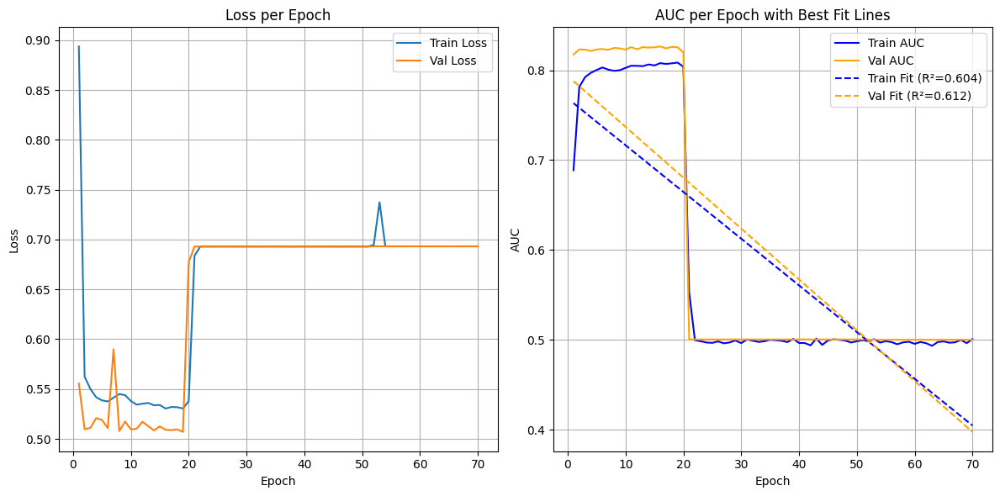


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 5/20
batch_size=64, embed_dim=16, num_heads=4, dropout=0.677, mlp_hidden_dims=(32, 64, 128, 256, 512), lr=0.003024, epochs=65
Using device: cuda
Epoch 1/65 | Train Loss: 0.5500 | Train AUC: 0.7943 | Train Precision: 0.7018 | Train Recall: 0.8029 | Train Accuracy: 0.7309 || Val Loss: 0.5139 | Val AUC: 0.8243 | Val Precision: 0.7030 | Val Recall: 0.8713 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8243
Epoch 2/65 | Train Loss: 0.5363 | Train AUC: 0.8046 | Train Precision: 0.7006 | Train Recall: 0.8459 | Train Accuracy: 0.7422 || Val Loss: 0.5082 | Val AUC: 0.8260 | Val Precision: 0.7063 | Val Recall: 0.8623 | Val Accuracy: 0.7519
--> Saved best model with Val AUC: 0.8260
Epoch 3/65 | Train Loss: 0.5358 | Train AUC: 0.8063 | Train Precision: 0.7006 | Train Recall: 0.8506 | Train Accuracy: 0.7435 || Val Loss: 0.5114 | Val AUC: 0.8253 | Val Precision: 0.6990 | Val Recall: 0.8776 | Val Accuracy: 0.7499


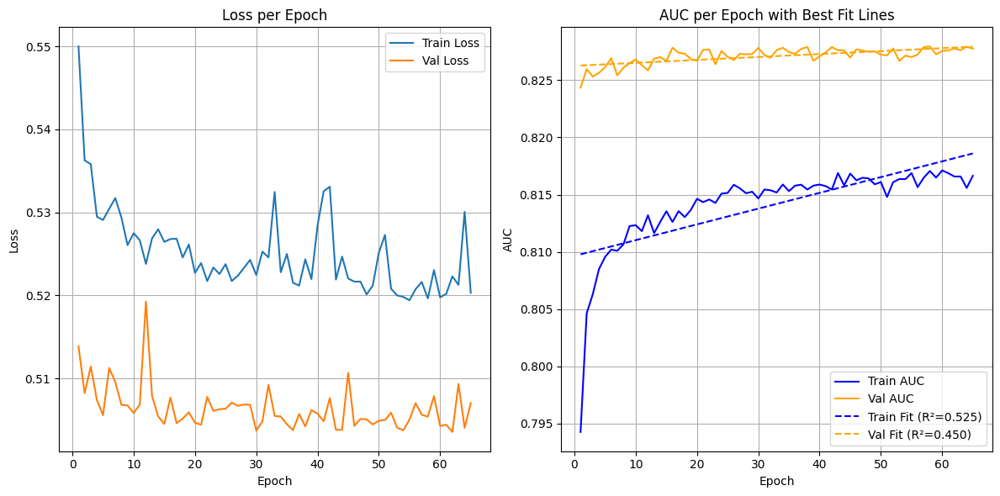


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 6/20
batch_size=256, embed_dim=512, num_heads=16, dropout=0.171, mlp_hidden_dims=(16, 32, 64), lr=0.005006, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 49.6324 | Train AUC: 0.5012 | Train Precision: 0.5004 | Train Recall: 0.9693 | Train Accuracy: 0.5008 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/10 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/10 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/10 | Train Loss: 49.9992 | Train AUC

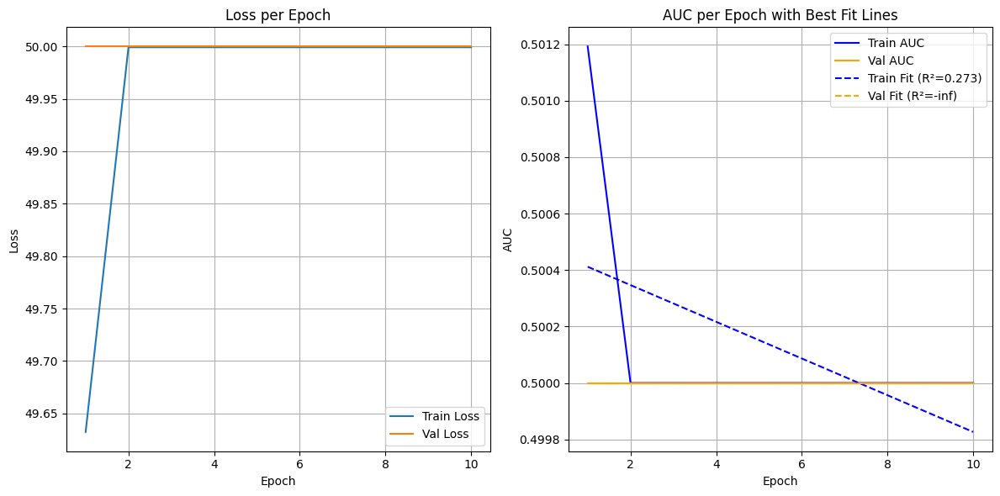

Removed structure: batch_size=256, embed_dim=512, num_heads=16, mlp_hidden_dims=(16, 32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 7/20
batch_size=32, embed_dim=16, num_heads=4, dropout=0.485, mlp_hidden_dims=(16, 32, 64, 128), lr=0.000993, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 0.5330 | Train AUC: 0.8047 | Train Precision: 0.7128 | Train Recall: 0.7967 | Train Accuracy: 0.7378 || Val Loss: 0.5145 | Val AUC: 0.8249 | Val Precision: 0.7066 | Val Recall: 0.8716 | Val Accuracy: 0.7548
--> Saved best model with Val AUC: 0.8249
Epoch 2/20 | Train Loss: 0.5222 | Train AUC: 0.8130 | Train Precision: 0.7127 | Train Recall: 0.8290 | Train Accuracy: 0.7474 || Val Loss: 0.5108 | Val AUC: 0.8258 | Val Precision: 0.7349 | Val Recall: 0.7917 | Val Accuracy: 0.7531
--> Saved best model with Val AUC: 0.8258
Epoch 3/20 | Train Loss: 0.5192 | Train AUC: 0.8151 | Train Precision: 0.7119 | Train Recall: 0.8367 | Train Accuracy: 0.7490 || Val Loss: 0.5074

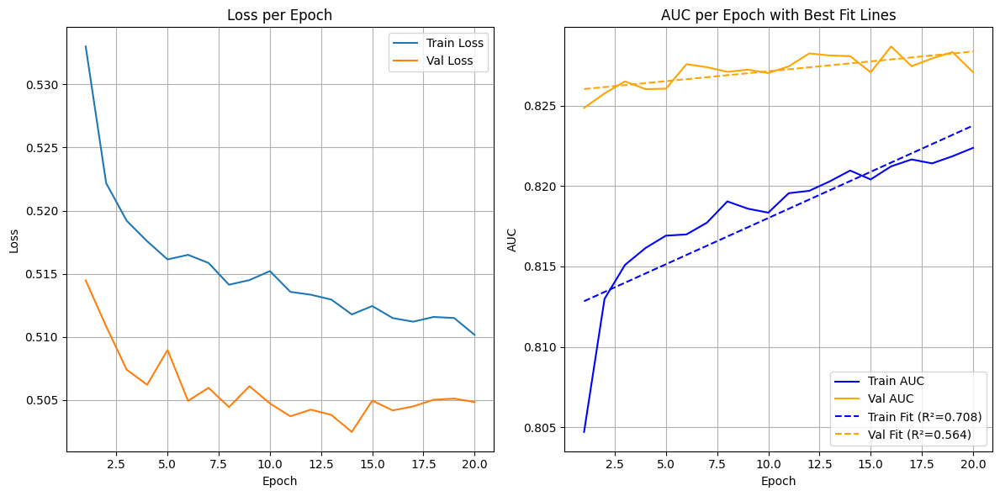


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 8/20
batch_size=256, embed_dim=256, num_heads=4, dropout=0.164, mlp_hidden_dims=(32, 64, 128), lr=0.00129, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.5556 | Train AUC: 0.7930 | Train Precision: 0.7045 | Train Recall: 0.7997 | Train Accuracy: 0.7321 || Val Loss: 0.5110 | Val AUC: 0.8228 | Val Precision: 0.7245 | Val Recall: 0.8138 | Val Accuracy: 0.7522
--> Saved best model with Val AUC: 0.8228
Epoch 2/25 | Train Loss: 0.5247 | Train AUC: 0.8100 | Train Precision: 0.7106 | Train Recall: 0.8279 | Train Accuracy: 0.7453 || Val Loss: 0.5226 | Val AUC: 0.8232 | Val Precision: 0.7338 | Val Recall: 0.7898 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8232
Epoch 3/25 | Train Loss: 0.5213 | Train AUC: 0.8126 | Train Precision: 0.7137 | Train Recall: 0.8269 | Train Accuracy: 0.7476 || Val Loss: 0.5151 | Val AUC: 0.8249 | Val Precision: 0.7213 | Val Recall: 0.8273 | Val Accuracy: 0.7538
--> Saved

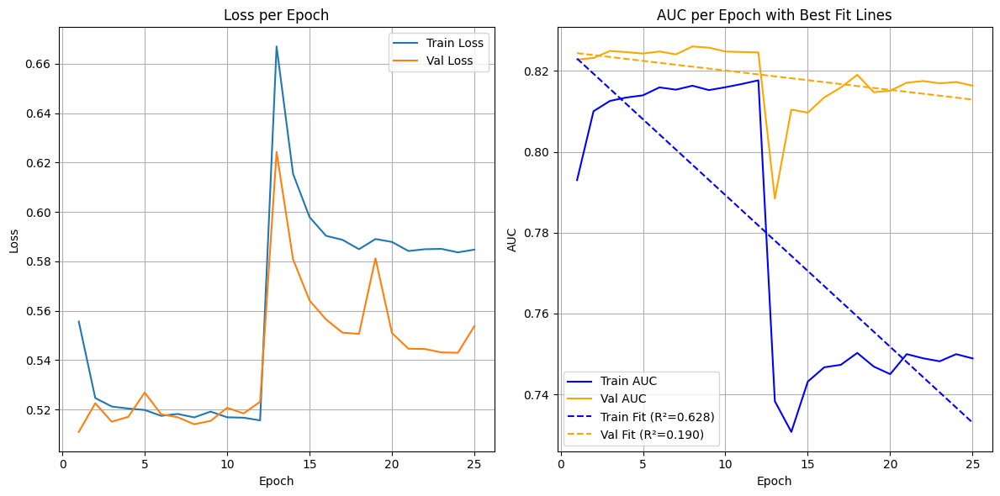


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 9/20
batch_size=16, embed_dim=512, num_heads=8, dropout=0.381, mlp_hidden_dims=(256, 512), lr=0.000511, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 0.5620 | Train AUC: 0.7829 | Train Precision: 0.6907 | Train Recall: 0.8164 | Train Accuracy: 0.7254 || Val Loss: 0.5125 | Val AUC: 0.8225 | Val Precision: 0.6947 | Val Recall: 0.8862 | Val Accuracy: 0.7484
--> Saved best model with Val AUC: 0.8225
Epoch 2/20 | Train Loss: 0.5412 | Train AUC: 0.8013 | Train Precision: 0.6950 | Train Recall: 0.8568 | Train Accuracy: 0.7404 || Val Loss: 0.5219 | Val AUC: 0.8238 | Val Precision: 0.7236 | Val Recall: 0.8214 | Val Accuracy: 0.7538
--> Saved best model with Val AUC: 0.8238
Epoch 3/20 | Train Loss: 0.5383 | Train AUC: 0.8047 | Train Precision: 0.6970 | Train Recall: 0.8614 | Train Accuracy: 0.7435 || Val Loss: 0.5198 | Val AUC: 0.8243 | Val Precision: 0.7115 | Val Recall: 0.8538 | Val Accuracy: 0.7538
--> Saved be

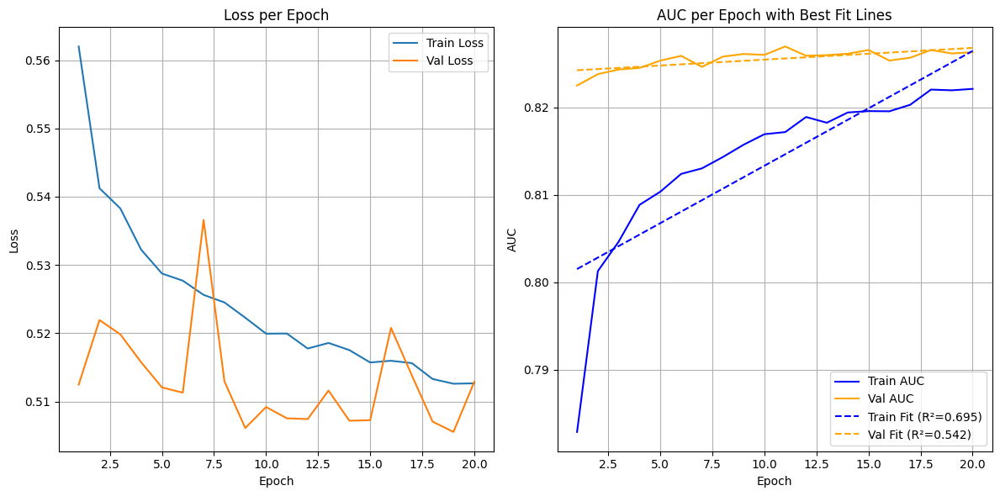


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 10/20
batch_size=32, embed_dim=512, num_heads=4, dropout=0.285, mlp_hidden_dims=(32, 64, 128), lr=0.006456, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 49.9565 | Train AUC: 0.4999 | Train Precision: 0.4999 | Train Recall: 0.9991 | Train Accuracy: 0.4999 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/15 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/15 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/15 | Train Loss: 49.9992 | Train AUC

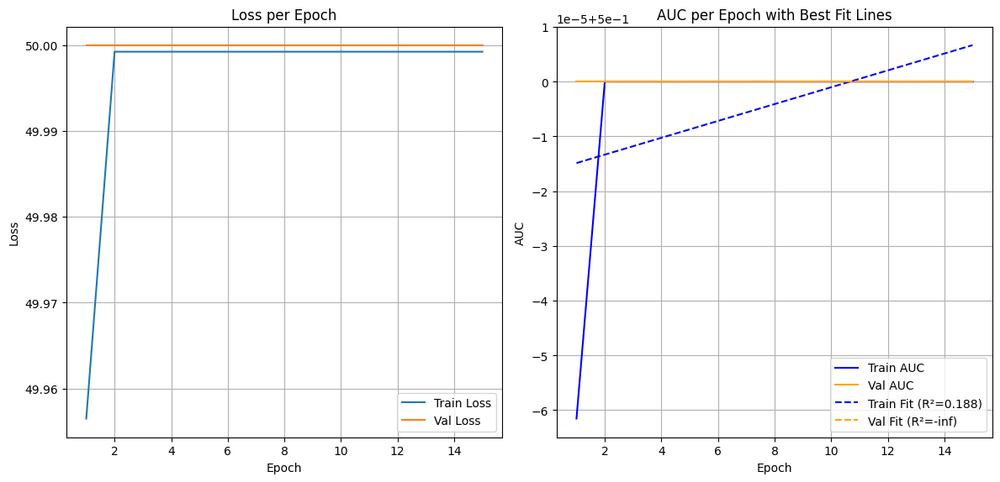

Removed structure: batch_size=32, embed_dim=512, num_heads=4, mlp_hidden_dims=(32, 64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 11/20
batch_size=128, embed_dim=16, num_heads=16, dropout=0.425, mlp_hidden_dims=(16, 32, 64, 128), lr=0.003783, epochs=70
Using device: cuda
Epoch 1/70 | Train Loss: 0.5332 | Train AUC: 0.8041 | Train Precision: 0.7083 | Train Recall: 0.8078 | Train Accuracy: 0.7376 || Val Loss: 0.5074 | Val AUC: 0.8248 | Val Precision: 0.7235 | Val Recall: 0.8234 | Val Accuracy: 0.7544
--> Saved best model with Val AUC: 0.8248
Epoch 2/70 | Train Loss: 0.5219 | Train AUC: 0.8130 | Train Precision: 0.7106 | Train Recall: 0.8360 | Train Accuracy: 0.7478 || Val Loss: 0.5074 | Val AUC: 0.8245 | Val Precision: 0.7241 | Val Recall: 0.8225 | Val Accuracy: 0.7546
Epoch 3/70 | Train Loss: 0.5188 | Train AUC: 0.8153 | Train Precision: 0.7112 | Train Recall: 0.8407 | Train Accuracy: 0.7497 || Val Loss: 0.5099 | Val AUC: 0.8273 | Val Precision: 0.71

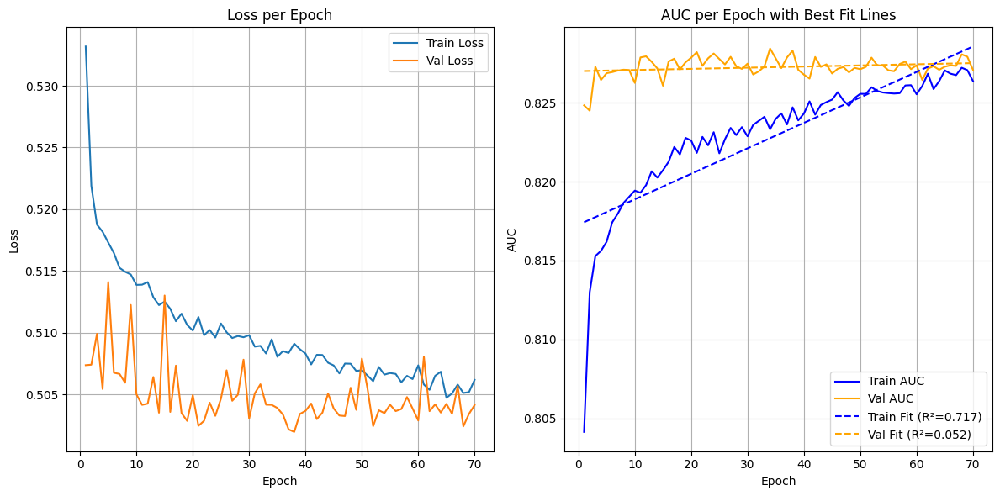


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 12/20
batch_size=512, embed_dim=128, num_heads=16, dropout=0.794, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.002712, epochs=35
Using device: cuda
Epoch 1/35 | Train Loss: 0.5867 | Train AUC: 0.7637 | Train Precision: 0.6765 | Train Recall: 0.7920 | Train Accuracy: 0.7066 || Val Loss: 0.5969 | Val AUC: 0.8203 | Val Precision: 0.7316 | Val Recall: 0.7895 | Val Accuracy: 0.7499
--> Saved best model with Val AUC: 0.8203
Epoch 2/35 | Train Loss: 0.5557 | Train AUC: 0.7879 | Train Precision: 0.6864 | Train Recall: 0.8365 | Train Accuracy: 0.7271 || Val Loss: 0.5321 | Val AUC: 0.8190 | Val Precision: 0.6987 | Val Recall: 0.8709 | Val Accuracy: 0.7477
Epoch 3/35 | Train Loss: 0.5574 | Train AUC: 0.7877 | Train Precision: 0.6833 | Train Recall: 0.8524 | Train Accuracy: 0.7287 || Val Loss: 0.5712 | Val AUC: 0.8211 | Val Precision: 0.7076 | Val Recall: 0.8527 | Val Accuracy: 0.7501
--> Saved best model with Val AUC: 0.8211

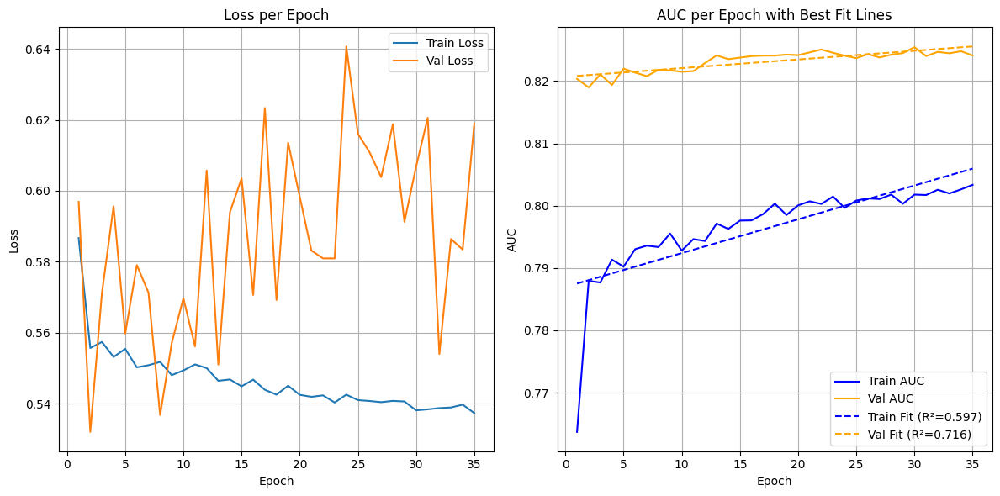


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 13/20
batch_size=16, embed_dim=64, num_heads=4, dropout=0.429, mlp_hidden_dims=(64, 128, 256), lr=0.001917, epochs=60
Using device: cuda
Epoch 1/60 | Train Loss: 0.5534 | Train AUC: 0.7900 | Train Precision: 0.6936 | Train Recall: 0.8295 | Train Accuracy: 0.7315 || Val Loss: 0.5334 | Val AUC: 0.8211 | Val Precision: 0.7330 | Val Recall: 0.7879 | Val Accuracy: 0.7504
--> Saved best model with Val AUC: 0.8211
Epoch 2/60 | Train Loss: 0.5438 | Train AUC: 0.7986 | Train Precision: 0.6928 | Train Recall: 0.8589 | Train Accuracy: 0.7390 || Val Loss: 0.5264 | Val AUC: 0.8211 | Val Precision: 0.6896 | Val Recall: 0.8953 | Val Accuracy: 0.7461
Epoch 3/60 | Train Loss: 0.5437 | Train AUC: 0.8001 | Train Precision: 0.6946 | Train Recall: 0.8536 | Train Accuracy: 0.7391 || Val Loss: 0.5294 | Val AUC: 0.8217 | Val Precision: 0.7164 | Val Recall: 0.8306 | Val Accuracy: 0.7509
--> Saved best model with Val AUC: 0.8217
Epoch 4/

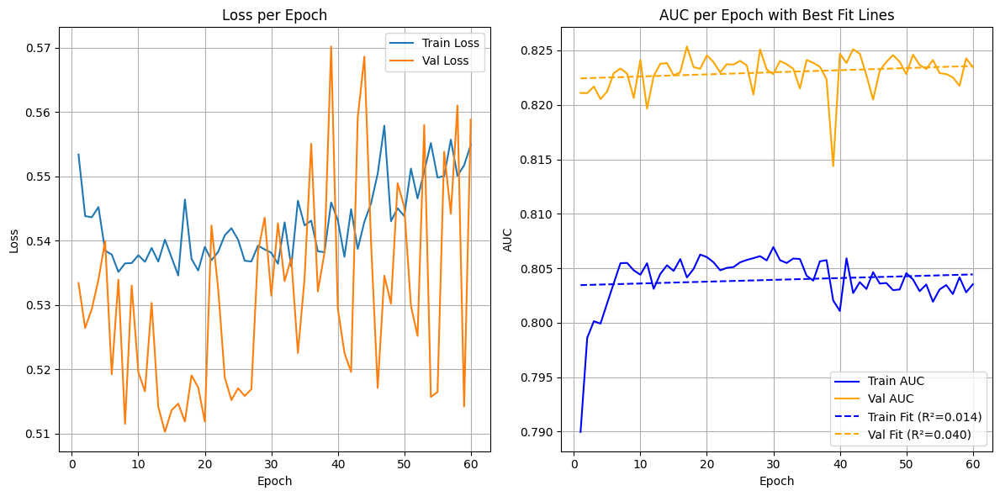


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 14/20
batch_size=64, embed_dim=128, num_heads=16, dropout=0.574, mlp_hidden_dims=(64, 128), lr=0.008896, epochs=70
Using device: cuda
Epoch 1/70 | Train Loss: 49.5454 | Train AUC: 0.5004 | Train Precision: 0.5003 | Train Recall: 0.9931 | Train Accuracy: 0.5006 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/70 | Train Loss: 49.9527 | Train AUC: 0.4998 | Train Precision: 0.5000 | Train Recall: 0.9999 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/70 | Train Loss: 49.9326 | Train AUC: 0.4999 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/70 | Train Loss: 49.9386 | Train AUC: 0

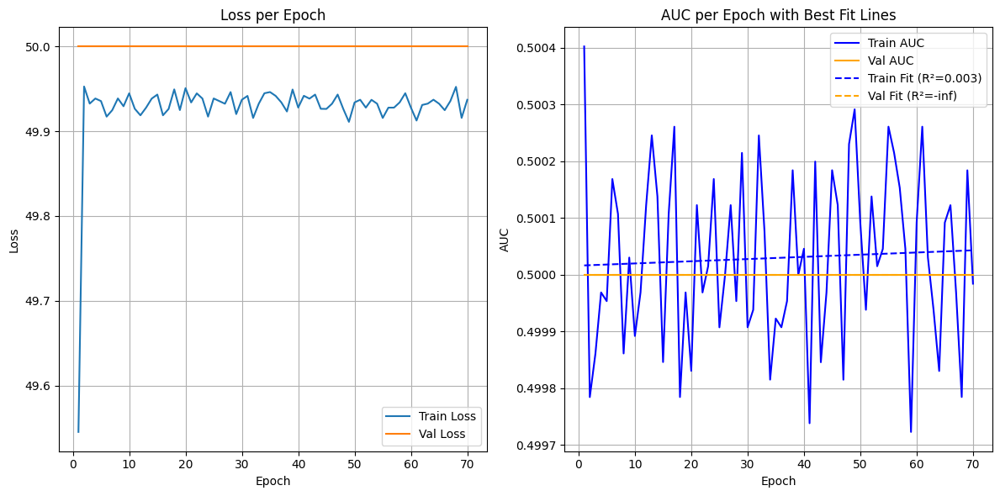

Removed structure: batch_size=64, embed_dim=128, num_heads=16, mlp_hidden_dims=(64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 15/20
batch_size=256, embed_dim=128, num_heads=2, dropout=0.565, mlp_hidden_dims=(16, 32, 64, 128), lr=0.008008, epochs=65
Using device: cuda
Epoch 1/65 | Train Loss: 0.9893 | Train AUC: 0.6981 | Train Precision: 0.5995 | Train Recall: 0.8389 | Train Accuracy: 0.6392 || Val Loss: 0.5720 | Val AUC: 0.8120 | Val Precision: 0.7457 | Val Recall: 0.6960 | Val Accuracy: 0.7293
--> Saved best model with Val AUC: 0.8120
Epoch 2/65 | Train Loss: 0.6010 | Train AUC: 0.7412 | Train Precision: 0.6434 | Train Recall: 0.8702 | Train Accuracy: 0.6940 || Val Loss: 0.5603 | Val AUC: 0.8085 | Val Precision: 0.7346 | Val Recall: 0.7390 | Val Accuracy: 0.7360
Epoch 3/65 | Train Loss: 0.5946 | Train AUC: 0.7481 | Train Precision: 0.6490 | Train Recall: 0.8804 | Train Accuracy: 0.7022 || Val Loss: 1.0442 | Val AUC: 0.8075 | Val Precision: 0.8175 

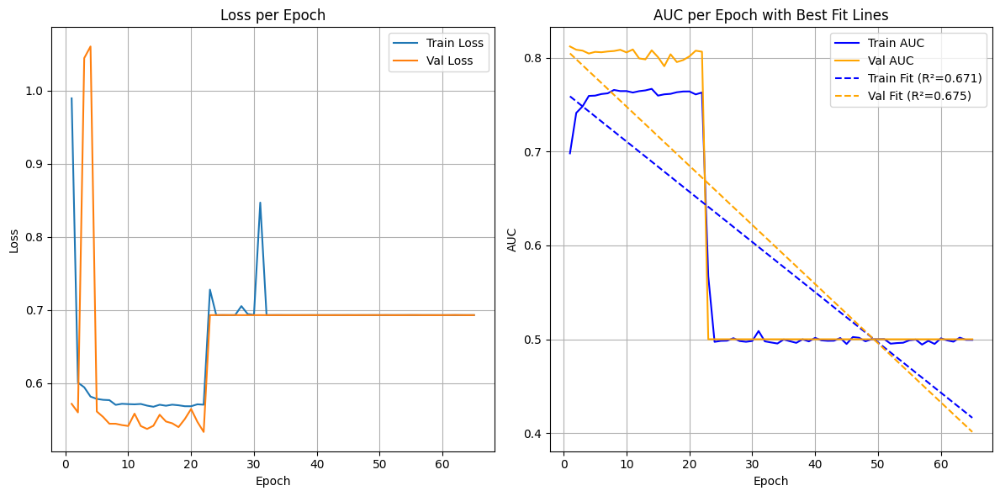


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 16/20
batch_size=256, embed_dim=512, num_heads=4, dropout=0.508, mlp_hidden_dims=(64, 128), lr=0.005961, epochs=65
Using device: cuda
Epoch 1/65 | Train Loss: 49.2518 | Train AUC: 0.5023 | Train Precision: 0.5025 | Train Recall: 0.5252 | Train Accuracy: 0.5026 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/65 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/65 | Train Loss: 49.9989 | Train AUC: 0.5000 | Train Precision: 1.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/65 | Train Loss: 50.0008 | Train AUC: 0

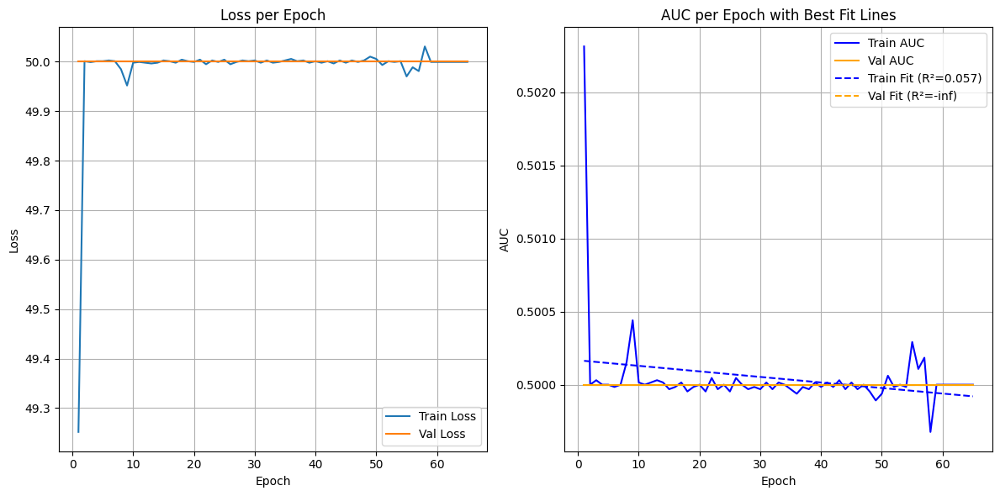

Removed structure: batch_size=256, embed_dim=512, num_heads=4, mlp_hidden_dims=(64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 17/20
batch_size=64, embed_dim=128, num_heads=4, dropout=0.424, mlp_hidden_dims=(32, 64), lr=0.00379, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.5811 | Train AUC: 0.7796 | Train Precision: 0.6933 | Train Recall: 0.7990 | Train Accuracy: 0.7227 || Val Loss: 0.5282 | Val AUC: 0.8172 | Val Precision: 0.7107 | Val Recall: 0.8426 | Val Accuracy: 0.7498
--> Saved best model with Val AUC: 0.8172
Epoch 2/55 | Train Loss: 0.5528 | Train AUC: 0.7915 | Train Precision: 0.6923 | Train Recall: 0.8425 | Train Accuracy: 0.7340 || Val Loss: 0.5275 | Val AUC: 0.8210 | Val Precision: 0.7195 | Val Recall: 0.8284 | Val Accuracy: 0.7527
--> Saved best model with Val AUC: 0.8210
Epoch 3/55 | Train Loss: 0.5456 | Train AUC: 0.7975 | Train Precision: 0.6928 | Train Recall: 0.8584 | Train Accuracy: 0.7389 || Val Loss: 0.5186 | Val AUC: 

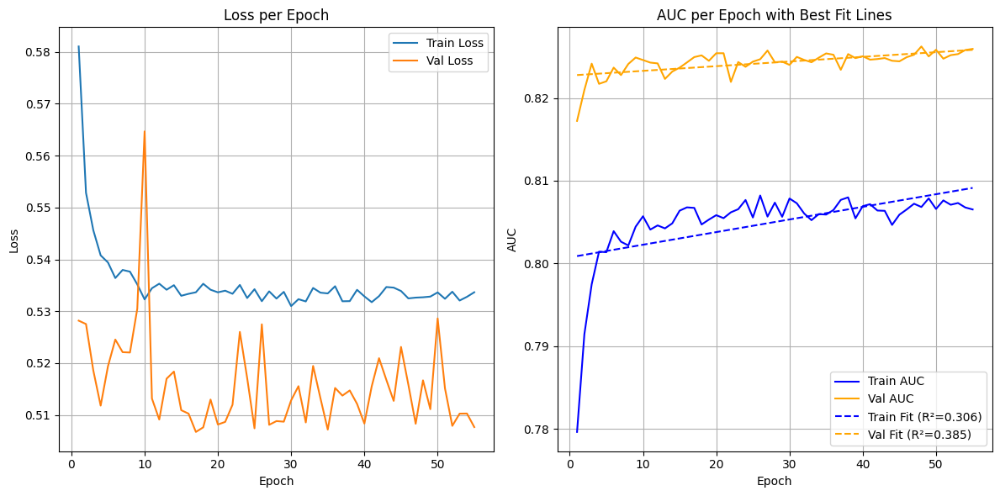


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 18/20
batch_size=16, embed_dim=32, num_heads=16, dropout=0.569, mlp_hidden_dims=(128, 256), lr=0.002445, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.5599 | Train AUC: 0.7862 | Train Precision: 0.6880 | Train Recall: 0.8340 | Train Accuracy: 0.7279 || Val Loss: 0.5392 | Val AUC: 0.8180 | Val Precision: 0.7251 | Val Recall: 0.8095 | Val Accuracy: 0.7513
--> Saved best model with Val AUC: 0.8180
Epoch 2/30 | Train Loss: 0.5554 | Train AUC: 0.7908 | Train Precision: 0.6822 | Train Recall: 0.8629 | Train Accuracy: 0.7305 || Val Loss: 0.5269 | Val AUC: 0.8187 | Val Precision: 0.7210 | Val Recall: 0.8126 | Val Accuracy: 0.7491
--> Saved best model with Val AUC: 0.8187
Epoch 3/30 | Train Loss: 0.5545 | Train AUC: 0.7903 | Train Precision: 0.6816 | Train Recall: 0.8648 | Train Accuracy: 0.7304 || Val Loss: 0.5645 | Val AUC: 0.8195 | Val Precision: 0.7312 | Val Recall: 0.7911 | Val Accuracy: 0.7501
--> Saved b

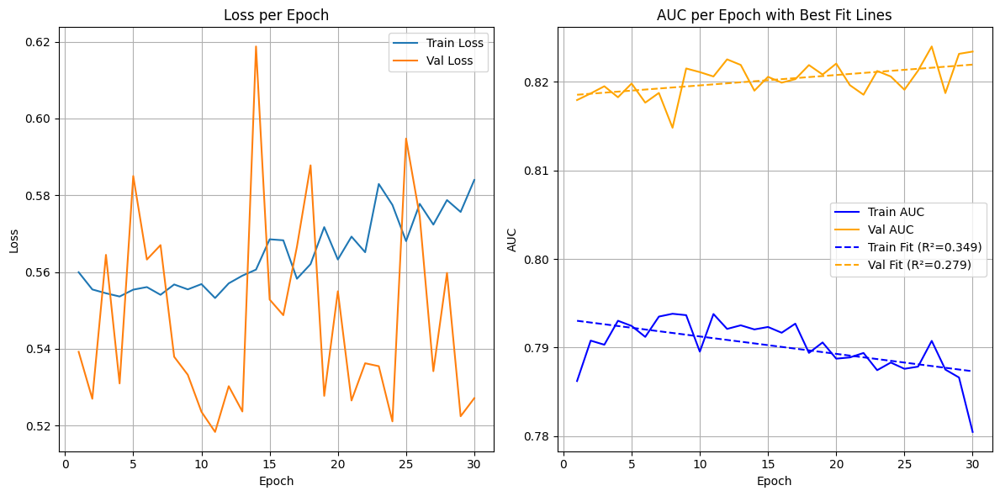


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 19/20
batch_size=64, embed_dim=32, num_heads=2, dropout=0.324, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.004181, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 0.5358 | Train AUC: 0.8025 | Train Precision: 0.7093 | Train Recall: 0.8085 | Train Accuracy: 0.7386 || Val Loss: 0.5077 | Val AUC: 0.8236 | Val Precision: 0.7190 | Val Recall: 0.8392 | Val Accuracy: 0.7556
--> Saved best model with Val AUC: 0.8236
Epoch 2/55 | Train Loss: 0.5264 | Train AUC: 0.8096 | Train Precision: 0.7067 | Train Recall: 0.8400 | Train Accuracy: 0.7457 || Val Loss: 0.5079 | Val AUC: 0.8256 | Val Precision: 0.7075 | Val Recall: 0.8618 | Val Accuracy: 0.7527
--> Saved best model with Val AUC: 0.8256
Epoch 3/55 | Train Loss: 0.5208 | Train AUC: 0.8138 | Train Precision: 0.7076 | Train Recall: 0.8412 | Train Accuracy: 0.7468 || Val Loss: 0.5107 | Val AUC: 0.8243 | Val Precision: 0.7255 | Val Recall: 0.8176 | Val Accuracy: 0.7542


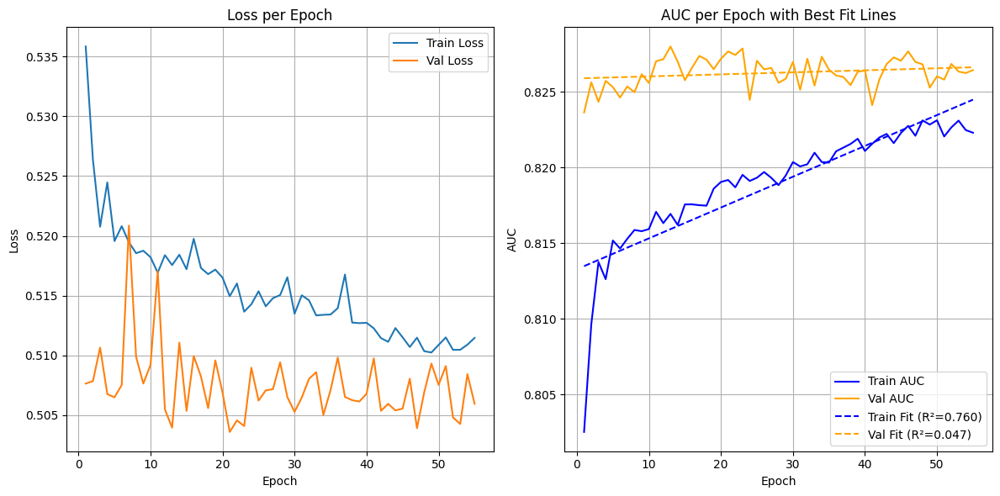


Saved model and trial summaries to '/content/drive/MyDrive/model7'

Trial 20/20
batch_size=128, embed_dim=256, num_heads=8, dropout=0.368, mlp_hidden_dims=(128, 256, 512), lr=0.006397, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 49.7449 | Train AUC: 0.5005 | Train Precision: 0.5002 | Train Recall: 0.9964 | Train Accuracy: 0.5004 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/30 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/30 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/30 | Train Loss: 49.9992 | Train 

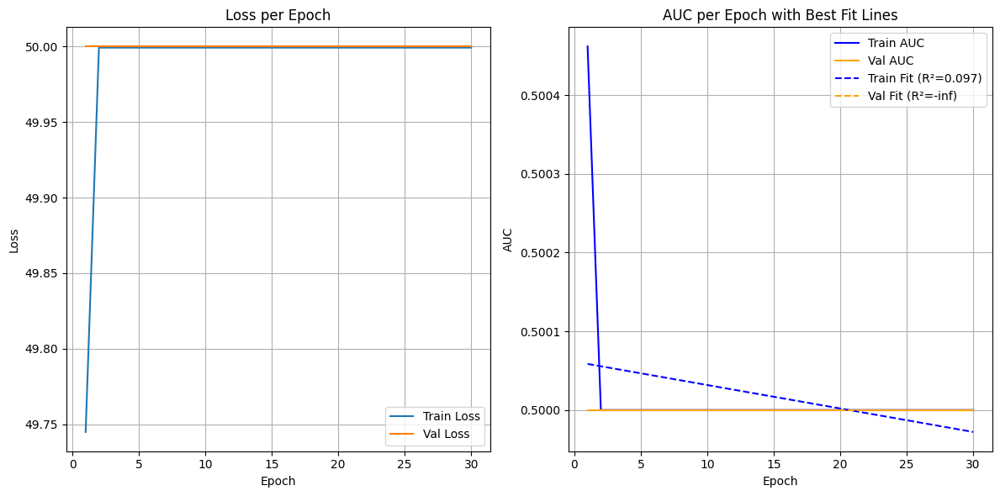

Removed structure: batch_size=128, embed_dim=256, num_heads=8, mlp_hidden_dims=(128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model7'

=== Trial Summary ===

Trial 1 — Removed: False
Params: {'batch_size': 64, 'embed_dim': 32, 'num_heads': 4, 'dropout': 0.239, 'mlp_hidden_dims': [32, 64, 128, 256], 'lr': 0.003971, 'epochs': 15}
Val AUC: 0.8272
Train Fit: y = 0.0008x + 0.8086, R²=0.6942
Val Fit:   y = 0.0004x + 0.8226, R²=0.5789
Train Residuals (first 5): [-0.00704433  0.00031296  0.00119609  0.00071494  0.00162929]
Val Residuals   (first 5): [-0.00375635 -0.00043493  0.00149776  0.00103555 -0.00013496]

Trial 2 — Removed: True
Params: {'batch_size': 256, 'embed_dim': 512, 'num_heads': 8, 'dropout': 0.317, 'mlp_hidden_dims': [16, 32, 64, 128], 'lr': 0.007458, 'epochs': 45}
Val AUC: 0.5000
Train Fit: y = 0.0000x + 0.4998, R²=0.0450
Val Fit:   y = -0.0000x + 0.5000, R²=-inf
Train Residuals (first 5): [-0.00057041  0.00019778  0.00019173  0.00018568  0.00017963

In [ ]:
best_model7, best_config7, history7, possible_structures = random_search(input_dim=len(feature_names), device=device, n_trials=20, save_dir="/content/drive/MyDrive/model7")


Trial 1/20
batch_size=512, embed_dim=512, num_heads=4, dropout=0.124, mlp_hidden_dims=(32, 64), lr=0.00436, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 49.3124 | Train AUC: 0.4988 | Train Precision: 0.4434 | Train Recall: 0.0070 | Train Accuracy: 0.4991 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/20 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/20 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/20 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy

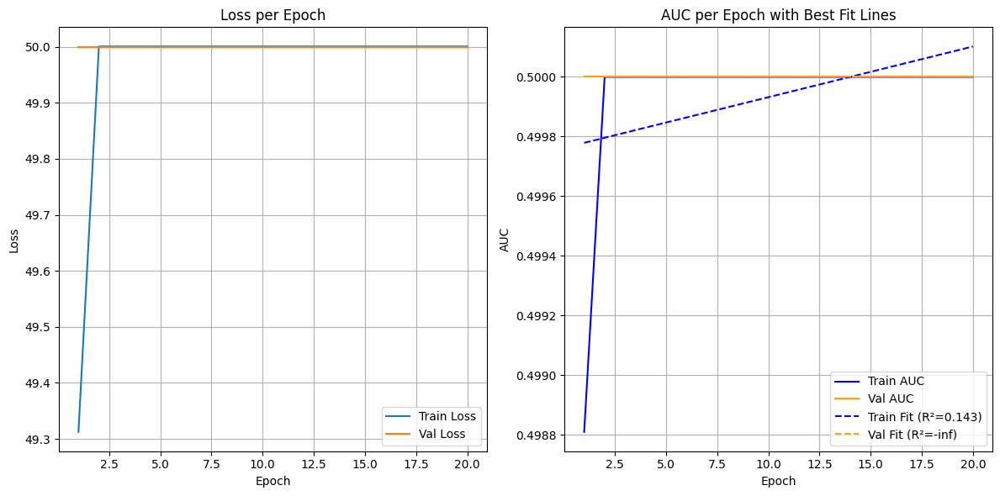

Removed structure: batch_size=512, embed_dim=512, num_heads=4, mlp_hidden_dims=(32, 64)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 2/20
batch_size=32, embed_dim=256, num_heads=16, dropout=0.503, mlp_hidden_dims=(8, 16, 32), lr=0.009961, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 49.9396 | Train AUC: 0.5000 | Train Precision: 0.4999 | Train Recall: 0.9989 | Train Accuracy: 0.4998 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/10 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/10 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | 

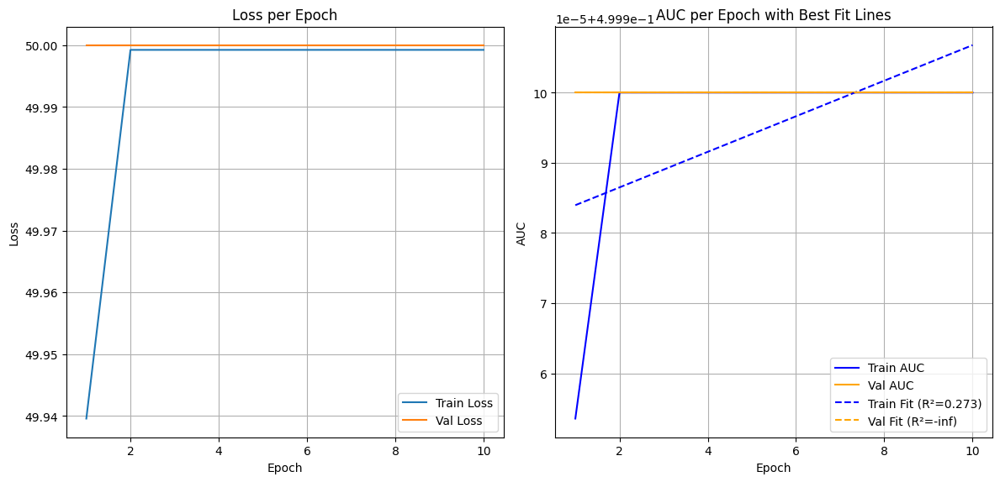

Removed structure: batch_size=32, embed_dim=256, num_heads=16, mlp_hidden_dims=(8, 16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 3/20
batch_size=32, embed_dim=512, num_heads=16, dropout=0.771, mlp_hidden_dims=(256, 512), lr=0.008782, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 49.5033 | Train AUC: 0.5006 | Train Precision: 0.5005 | Train Recall: 0.9199 | Train Accuracy: 0.5009 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/45 | Train Loss: 49.9500 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 0.9761 | Train Accuracy: 0.4999 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/45 | Train Loss: 49.9627 | Train AUC: 0.5001 | Train Precision: 0.5000 | Train Recall: 0.9910 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 

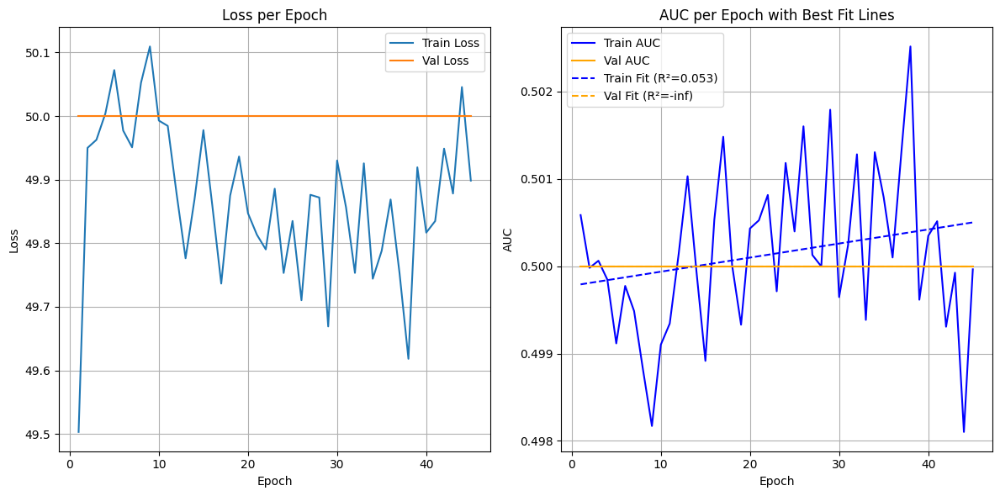

Removed structure: batch_size=32, embed_dim=512, num_heads=16, mlp_hidden_dims=(256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 4/20
batch_size=512, embed_dim=512, num_heads=2, dropout=0.28, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.004449, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 49.1600 | Train AUC: 0.4993 | Train Precision: 0.4997 | Train Recall: 0.9889 | Train Accuracy: 0.4993 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/30 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/30 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precisio

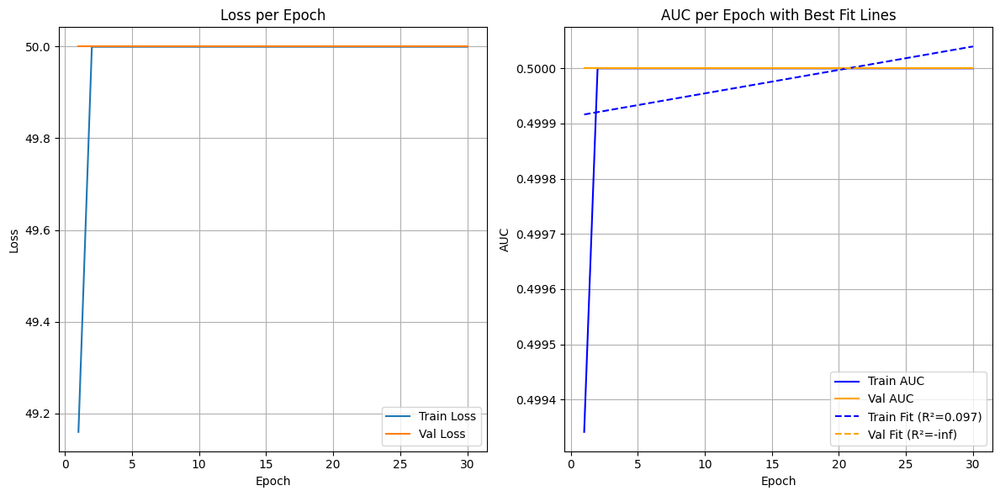

Removed structure: batch_size=512, embed_dim=512, num_heads=2, mlp_hidden_dims=(16, 32, 64, 128, 256)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 5/20
batch_size=64, embed_dim=32, num_heads=4, dropout=0.569, mlp_hidden_dims=(64, 128, 256), lr=0.001036, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5398 | Train AUC: 0.7995 | Train Precision: 0.7075 | Train Recall: 0.8007 | Train Accuracy: 0.7348 || Val Loss: 0.5087 | Val AUC: 0.8241 | Val Precision: 0.7189 | Val Recall: 0.8350 | Val Accuracy: 0.7542
--> Saved best model with Val AUC: 0.8241
Epoch 2/15 | Train Loss: 0.5278 | Train AUC: 0.8092 | Train Precision: 0.7095 | Train Recall: 0.8265 | Train Accuracy: 0.7441 || Val Loss: 0.5079 | Val AUC: 0.8241 | Val Precision: 0.7296 | Val Recall: 0.8099 | Val Accuracy: 0.7549
Epoch 3/15 | Train Loss: 0.5249 | Train AUC: 0.8118 | Train Precision: 0.7081 | Train Recall: 0.8346 | Train Accuracy: 0.7453 || Val Loss: 0.5080 | Val AUC: 0.8263 | Val Precision: 

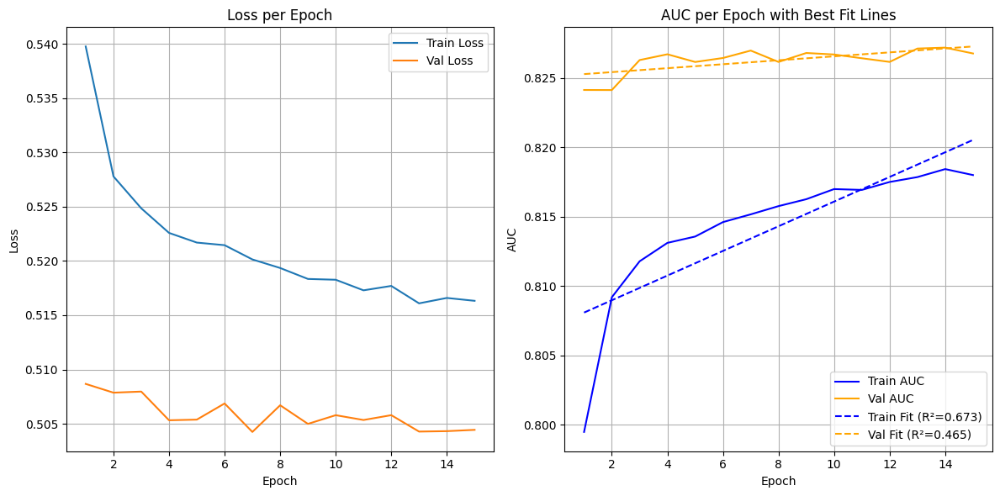


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 6/20
batch_size=64, embed_dim=256, num_heads=2, dropout=0.104, mlp_hidden_dims=(16, 32), lr=0.009794, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 49.8297 | Train AUC: 0.5002 | Train Precision: 0.5002 | Train Recall: 0.9974 | Train Accuracy: 0.5003 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/25 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/25 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/25 | Train Loss: 49.9992 | Train AUC: 0.50

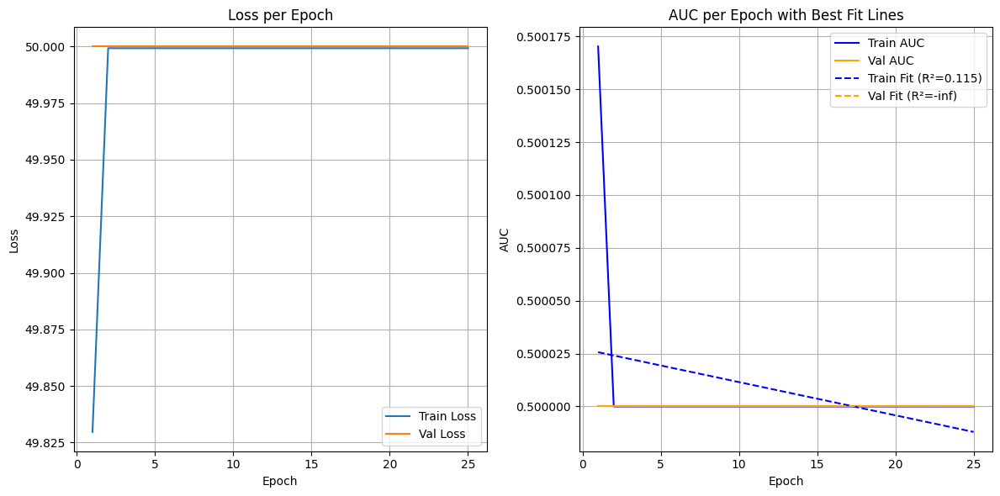

Removed structure: batch_size=64, embed_dim=256, num_heads=2, mlp_hidden_dims=(16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 7/20
batch_size=128, embed_dim=256, num_heads=16, dropout=0.264, mlp_hidden_dims=(128, 256), lr=0.001573, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5598 | Train AUC: 0.7878 | Train Precision: 0.6960 | Train Recall: 0.7994 | Train Accuracy: 0.7251 || Val Loss: 0.5189 | Val AUC: 0.8220 | Val Precision: 0.7030 | Val Recall: 0.8713 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8220
Epoch 2/10 | Train Loss: 0.5321 | Train AUC: 0.8056 | Train Precision: 0.7046 | Train Recall: 0.8400 | Train Accuracy: 0.7440 || Val Loss: 0.5228 | Val AUC: 0.8237 | Val Precision: 0.7321 | Val Recall: 0.8042 | Val Accuracy: 0.7549
--> Saved best model with Val AUC: 0.8237
Epoch 3/10 | Train Loss: 0.5270 | Train AUC: 0.8111 | Train Precision: 0.7066 | Train Recall: 0.8486 | Train Accuracy: 0.7481 || Val Loss: 0.5072 | Val AUC

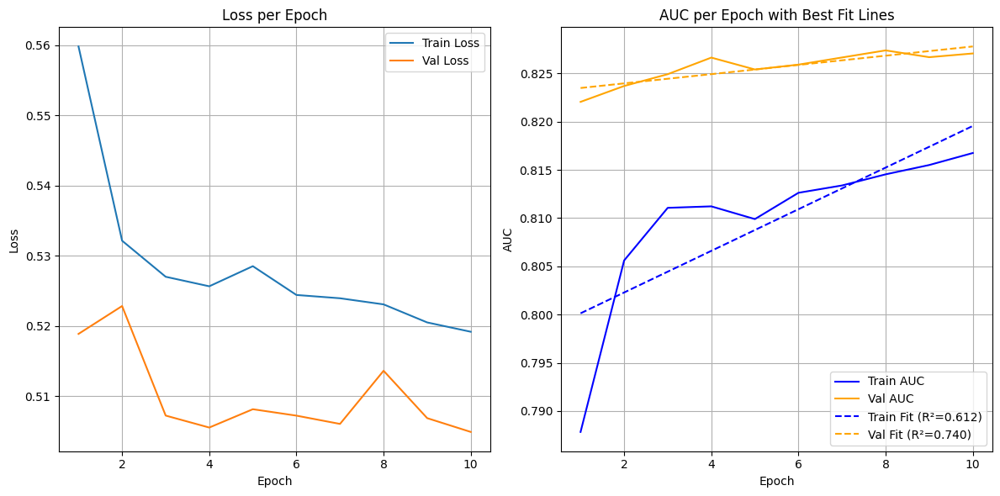


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 8/20
batch_size=128, embed_dim=256, num_heads=16, dropout=0.179, mlp_hidden_dims=(64, 128, 256, 512), lr=0.007756, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 49.8638 | Train AUC: 0.4993 | Train Precision: 0.4442 | Train Recall: 0.0071 | Train Accuracy: 0.4991 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/20 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/20 | Train Loss: 50.0008 | Train AUC: 0.5000 | Train Precision: 0.0000 | Train Recall: 0.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/20 | Train Loss: 50.0008 | Tr

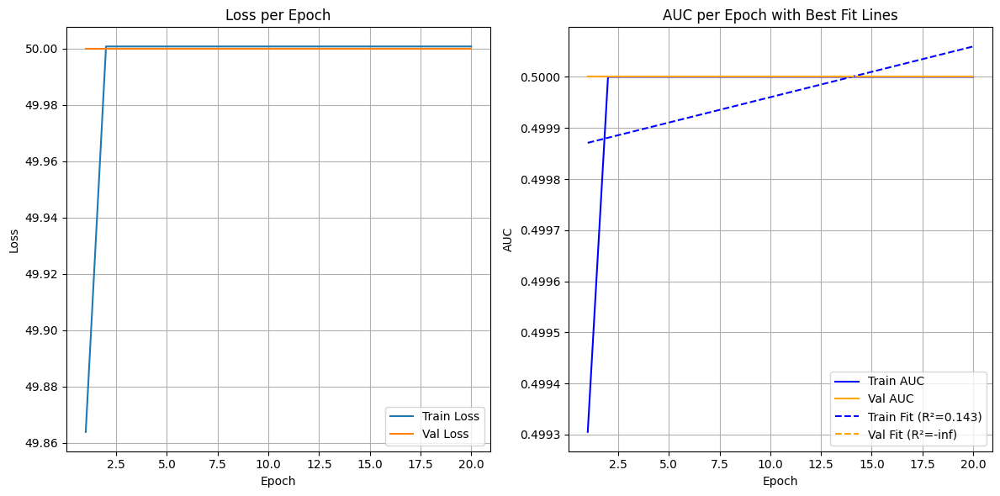

Removed structure: batch_size=128, embed_dim=256, num_heads=16, mlp_hidden_dims=(64, 128, 256, 512)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 9/20
batch_size=128, embed_dim=128, num_heads=4, dropout=0.535, mlp_hidden_dims=(8, 16, 32, 64), lr=0.000164, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5383 | Train AUC: 0.8007 | Train Precision: 0.7136 | Train Recall: 0.7822 | Train Accuracy: 0.7341 || Val Loss: 0.5077 | Val AUC: 0.8250 | Val Precision: 0.7129 | Val Recall: 0.8455 | Val Accuracy: 0.7525
--> Saved best model with Val AUC: 0.8250
Epoch 2/15 | Train Loss: 0.5248 | Train AUC: 0.8102 | Train Precision: 0.7156 | Train Recall: 0.8146 | Train Accuracy: 0.7454 || Val Loss: 0.5117 | Val AUC: 0.8243 | Val Precision: 0.7313 | Val Recall: 0.8112 | Val Accuracy: 0.7566
Epoch 3/15 | Train Loss: 0.5207 | Train AUC: 0.8140 | Train Precision: 0.7151 | Train Recall: 0.8231 | Train Accuracy: 0.7475 || Val Loss: 0.5079 | Val AUC: 0.8257 | Val Precision:

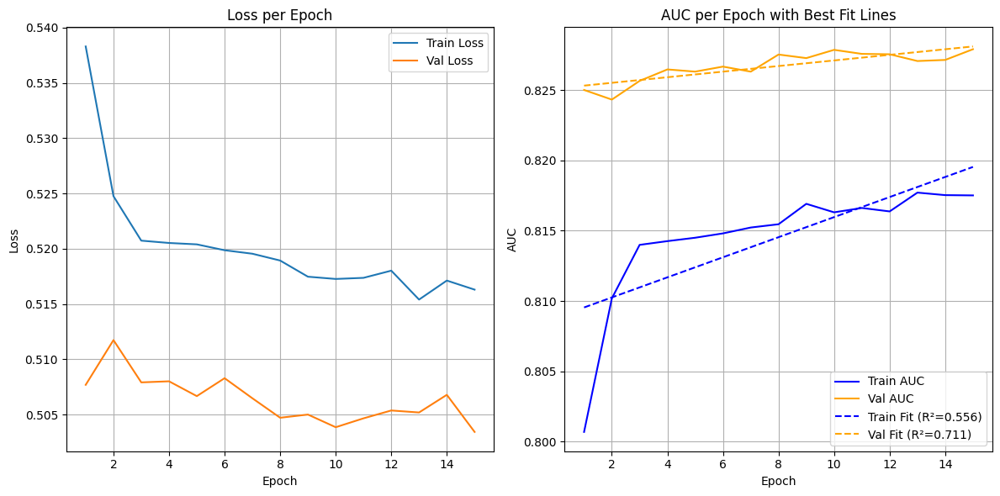


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 10/20
batch_size=512, embed_dim=512, num_heads=2, dropout=0.632, mlp_hidden_dims=(16, 32), lr=0.008509, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 41.3258 | Train AUC: 0.5690 | Train Precision: 0.5383 | Train Recall: 0.9187 | Train Accuracy: 0.5654 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/15 | Train Loss: 49.9653 | Train AUC: 0.5003 | Train Precision: 0.5002 | Train Recall: 0.9999 | Train Accuracy: 0.5003 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/15 | Train Loss: 49.9553 | Train AUC: 0.5004 | Train Precision: 0.5002 | Train Recall: 0.9998 | Train Accuracy: 0.5004 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/15 | Train Loss: 49.9284 | Train AUC: 0.

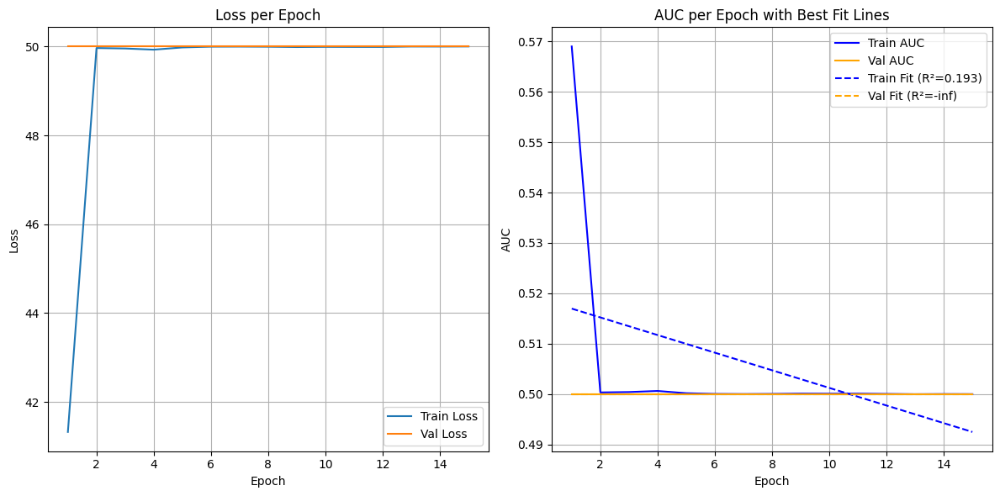

Removed structure: batch_size=512, embed_dim=512, num_heads=2, mlp_hidden_dims=(16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 11/20
batch_size=16, embed_dim=16, num_heads=8, dropout=0.641, mlp_hidden_dims=(32, 64, 128), lr=0.003428, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.5645 | Train AUC: 0.7832 | Train Precision: 0.6918 | Train Recall: 0.8121 | Train Accuracy: 0.7251 || Val Loss: 0.5271 | Val AUC: 0.8193 | Val Precision: 0.7247 | Val Recall: 0.7967 | Val Accuracy: 0.7471
--> Saved best model with Val AUC: 0.8193
Epoch 2/30 | Train Loss: 0.5506 | Train AUC: 0.7942 | Train Precision: 0.6899 | Train Recall: 0.8362 | Train Accuracy: 0.7301 || Val Loss: 0.5189 | Val AUC: 0.8189 | Val Precision: 0.7241 | Val Recall: 0.7994 | Val Accuracy: 0.7474
Epoch 3/30 | Train Loss: 0.5435 | Train AUC: 0.8010 | Train Precision: 0.6960 | Train Recall: 0.8399 | Train Accuracy: 0.7365 || Val Loss: 0.5147 | Val AUC: 0.8227 | Val Precision: 0.7285 | Val R

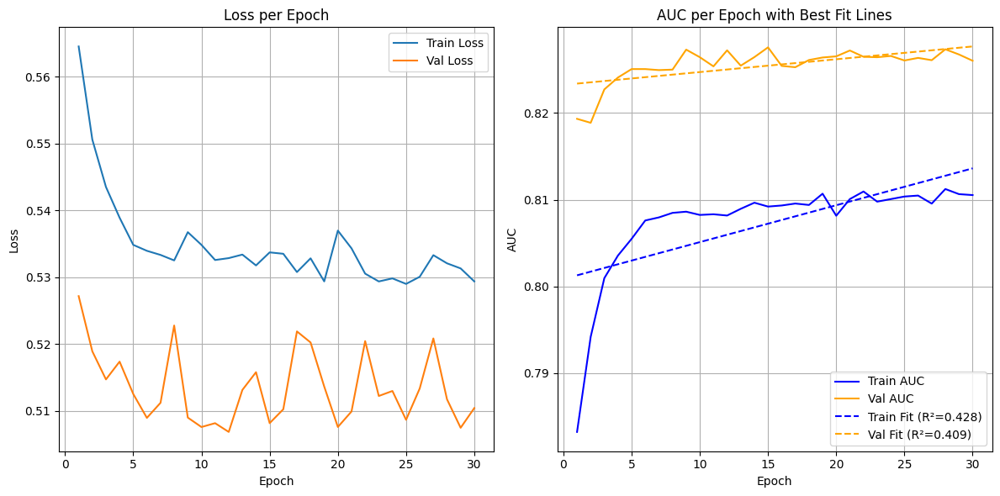


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 12/20
batch_size=256, embed_dim=32, num_heads=4, dropout=0.706, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.002605, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 0.5490 | Train AUC: 0.7940 | Train Precision: 0.7044 | Train Recall: 0.7894 | Train Accuracy: 0.7291 || Val Loss: 0.5144 | Val AUC: 0.8227 | Val Precision: 0.7299 | Val Recall: 0.7999 | Val Accuracy: 0.7519
--> Saved best model with Val AUC: 0.8227
Epoch 2/30 | Train Loss: 0.5364 | Train AUC: 0.8044 | Train Precision: 0.7036 | Train Recall: 0.8304 | Train Accuracy: 0.7403 || Val Loss: 0.5084 | Val AUC: 0.8241 | Val Precision: 0.7148 | Val Recall: 0.8422 | Val Accuracy: 0.7531
--> Saved best model with Val AUC: 0.8241
Epoch 3/30 | Train Loss: 0.5310 | Train AUC: 0.8075 | Train Precision: 0.7049 | Train Recall: 0.8427 | Train Accuracy: 0.7449 || Val Loss: 0.5202 | Val AUC: 0.8245 | Val Precision: 0.7382 | Val Recall: 0.7857 | Val Accuracy: 0.7535

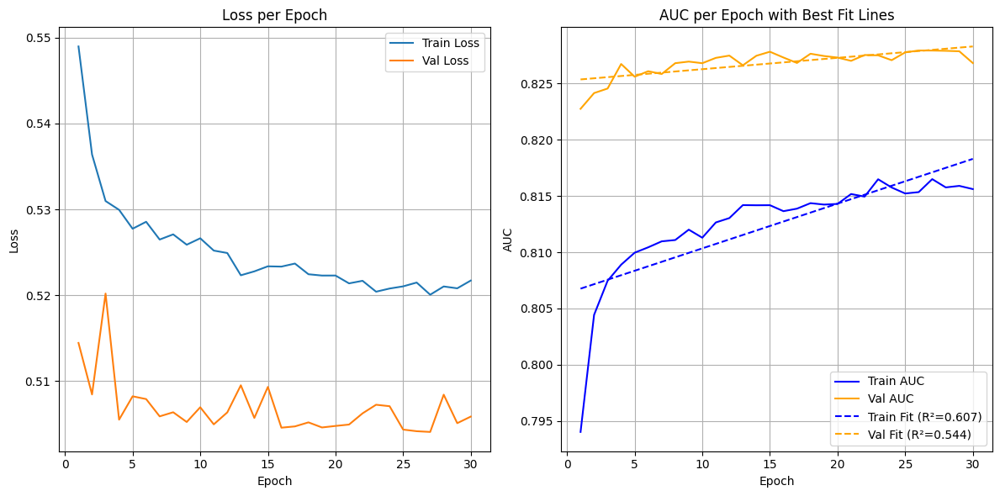


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 13/20
batch_size=128, embed_dim=256, num_heads=8, dropout=0.354, mlp_hidden_dims=(64, 128), lr=0.009548, epochs=55
Using device: cuda
Epoch 1/55 | Train Loss: 49.8461 | Train AUC: 0.5000 | Train Precision: 0.4999 | Train Recall: 0.9899 | Train Accuracy: 0.4998 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/55 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/55 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/55 | Train Loss: 49.9992 | Train AUC: 0

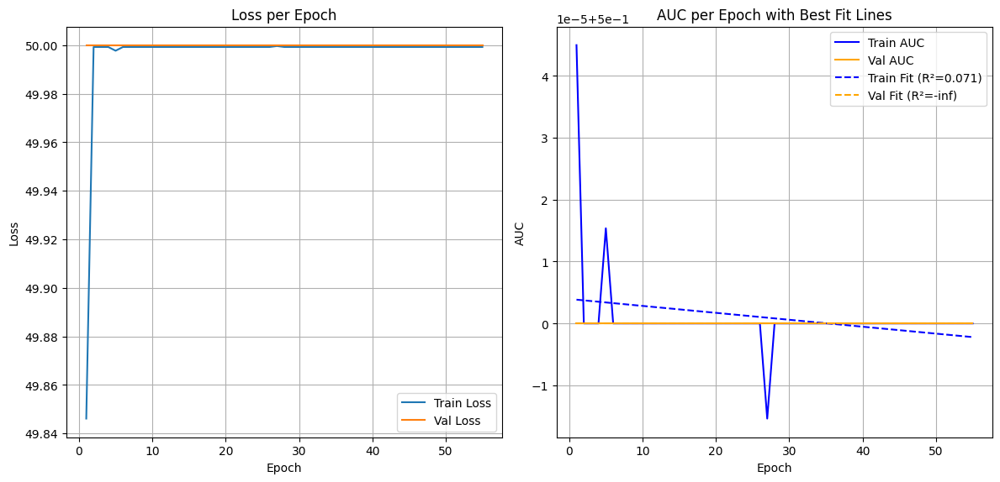

Removed structure: batch_size=128, embed_dim=256, num_heads=8, mlp_hidden_dims=(64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 14/20
batch_size=16, embed_dim=512, num_heads=4, dropout=0.563, mlp_hidden_dims=(8, 16, 32), lr=0.008936, epochs=30
Using device: cuda
Epoch 1/30 | Train Loss: 49.8919 | Train AUC: 0.5008 | Train Precision: 0.5007 | Train Recall: 0.5349 | Train Accuracy: 0.5007 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/30 | Train Loss: 49.8913 | Train AUC: 0.5011 | Train Precision: 0.5074 | Train Recall: 0.0733 | Train Accuracy: 0.5011 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/30 | Train Loss: 49.9920 | Train AUC: 0.5001 | Train Precision: 0.5000 | Train Recall: 0.9972 | Train Accuracy: 0.5001 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 |

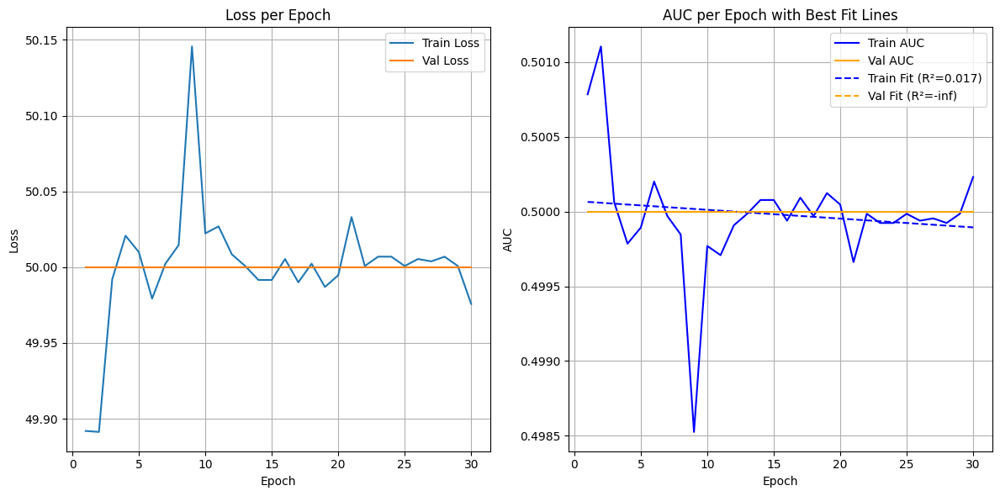

Removed structure: batch_size=16, embed_dim=512, num_heads=4, mlp_hidden_dims=(8, 16, 32)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 15/20
batch_size=64, embed_dim=32, num_heads=16, dropout=0.105, mlp_hidden_dims=(8, 16, 32, 64, 128), lr=0.009645, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5443 | Train AUC: 0.7981 | Train Precision: 0.7004 | Train Recall: 0.8167 | Train Accuracy: 0.7337 || Val Loss: 0.5149 | Val AUC: 0.8228 | Val Precision: 0.7170 | Val Recall: 0.8311 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8228
Epoch 2/10 | Train Loss: 0.5304 | Train AUC: 0.8073 | Train Precision: 0.7071 | Train Recall: 0.8324 | Train Accuracy: 0.7438 || Val Loss: 0.5173 | Val AUC: 0.8228 | Val Precision: 0.7284 | Val Recall: 0.8075 | Val Accuracy: 0.7532
--> Saved best model with Val AUC: 0.8228
Epoch 3/10 | Train Loss: 0.5282 | Train AUC: 0.8083 | Train Precision: 0.7049 | Train Recall: 0.8355 | Train Accuracy: 0.7429 || Val Loss: 0.50

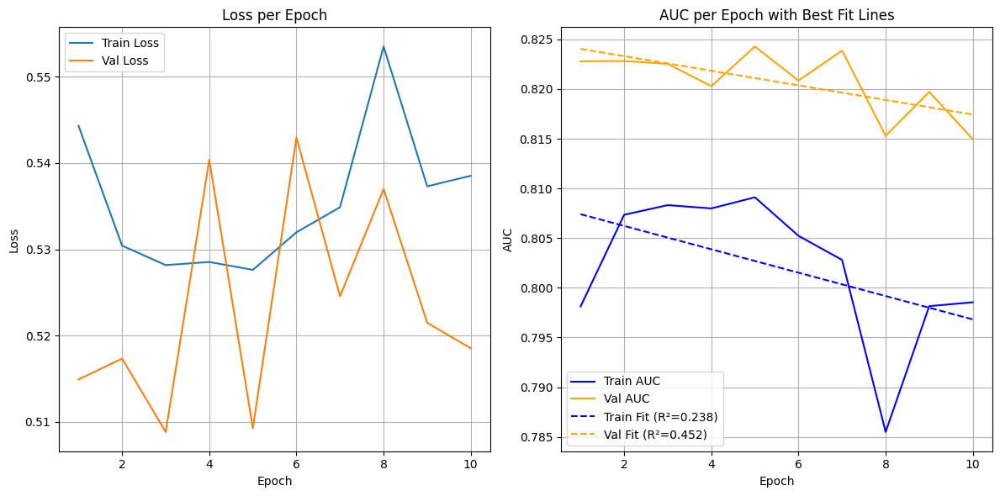


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 16/20
batch_size=16, embed_dim=512, num_heads=8, dropout=0.733, mlp_hidden_dims=(16, 32, 64, 128, 256), lr=0.00356, epochs=45
Using device: cuda
Epoch 1/45 | Train Loss: 0.7504 | Train AUC: 0.4977 | Train Precision: 0.4976 | Train Recall: 0.5501 | Train Accuracy: 0.4973 || Val Loss: 0.6932 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/45 | Train Loss: 1.7920 | Train AUC: 0.4982 | Train Precision: 0.4987 | Train Recall: 0.4669 | Train Accuracy: 0.4988 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 3/45 | Train Loss: 13.9204 | Train AUC: 0.4996 | Train Precision: 0.5010 | Train Recall: 0.4039 | Train Accuracy: 0.5008 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.0000 | Val Recall: 0.0000 | Val Accuracy: 0.5000
Epoch 4/45 | Train Loss: 13.9911 | Trai

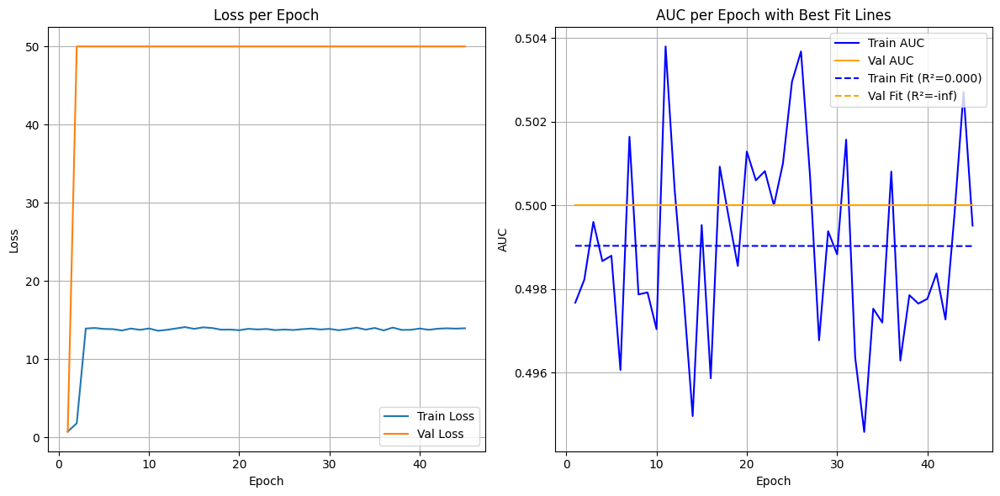

Removed structure: batch_size=16, embed_dim=512, num_heads=8, mlp_hidden_dims=(16, 32, 64, 128, 256)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 17/20
batch_size=64, embed_dim=16, num_heads=2, dropout=0.511, mlp_hidden_dims=(16, 32, 64, 128), lr=0.007435, epochs=15
Using device: cuda
Epoch 1/15 | Train Loss: 0.5451 | Train AUC: 0.7960 | Train Precision: 0.6988 | Train Recall: 0.8228 | Train Accuracy: 0.7340 || Val Loss: 0.5105 | Val AUC: 0.8233 | Val Precision: 0.7166 | Val Recall: 0.8326 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8233
Epoch 2/15 | Train Loss: 0.5313 | Train AUC: 0.8068 | Train Precision: 0.7018 | Train Recall: 0.8478 | Train Accuracy: 0.7437 || Val Loss: 0.5137 | Val AUC: 0.8252 | Val Precision: 0.7188 | Val Recall: 0.8370 | Val Accuracy: 0.7548
--> Saved best model with Val AUC: 0.8252
Epoch 3/15 | Train Loss: 0.5279 | Train AUC: 0.8096 | Train Precision: 0.7038 | Train Recall: 0.8484 | Train Accuracy: 0.7456 || Val Los

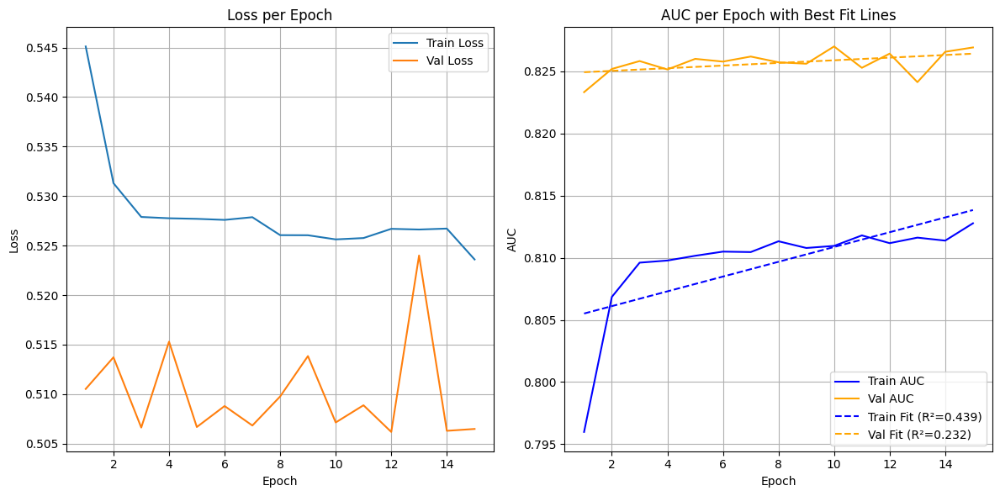


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 18/20
batch_size=256, embed_dim=32, num_heads=16, dropout=0.499, mlp_hidden_dims=(32, 64, 128, 256), lr=0.006874, epochs=10
Using device: cuda
Epoch 1/10 | Train Loss: 0.5552 | Train AUC: 0.7923 | Train Precision: 0.7050 | Train Recall: 0.7901 | Train Accuracy: 0.7298 || Val Loss: 0.5115 | Val AUC: 0.8235 | Val Precision: 0.7149 | Val Recall: 0.8372 | Val Accuracy: 0.7516
--> Saved best model with Val AUC: 0.8235
Epoch 2/10 | Train Loss: 0.5335 | Train AUC: 0.8058 | Train Precision: 0.7046 | Train Recall: 0.8342 | Train Accuracy: 0.7422 || Val Loss: 0.5091 | Val AUC: 0.8241 | Val Precision: 0.7189 | Val Recall: 0.8268 | Val Accuracy: 0.7518
--> Saved best model with Val AUC: 0.8241
Epoch 3/10 | Train Loss: 0.5309 | Train AUC: 0.8072 | Train Precision: 0.7018 | Train Recall: 0.8427 | Train Accuracy: 0.7423 || Val Loss: 0.5079 | Val AUC: 0.8248 | Val Precision: 0.7100 | Val Recall: 0.8531 | Val Accuracy: 0.7523
--

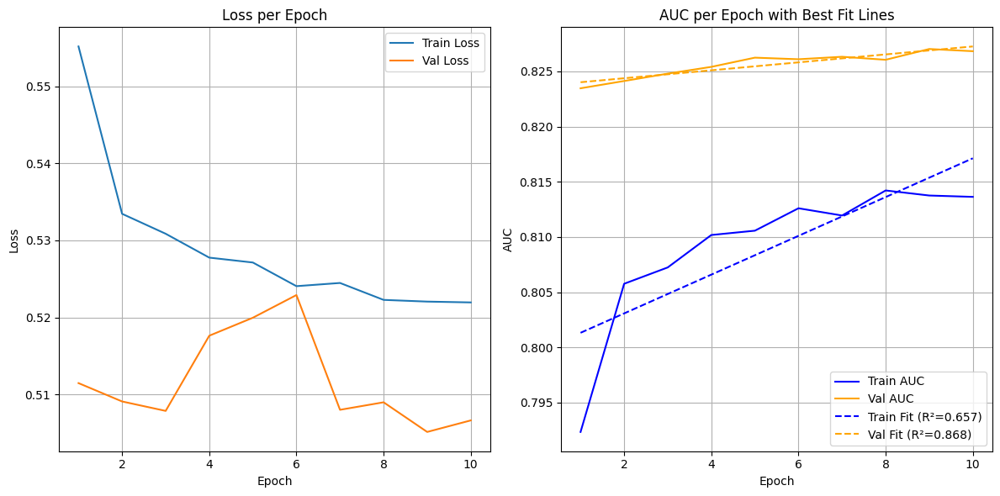


Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 19/20
batch_size=512, embed_dim=512, num_heads=2, dropout=0.223, mlp_hidden_dims=(16, 32, 64, 128), lr=0.006923, epochs=20
Using device: cuda
Epoch 1/20 | Train Loss: 48.9262 | Train AUC: 0.4990 | Train Precision: 0.5003 | Train Recall: 0.9841 | Train Accuracy: 0.5007 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
--> Saved best model with Val AUC: 0.5000
Epoch 2/20 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 3/20 | Train Loss: 49.9992 | Train AUC: 0.5000 | Train Precision: 0.5000 | Train Recall: 1.0000 | Train Accuracy: 0.5000 || Val Loss: 50.0000 | Val AUC: 0.5000 | Val Precision: 0.5000 | Val Recall: 1.0000 | Val Accuracy: 0.5000
Epoch 4/20 | Train Loss: 49.9992 | Trai

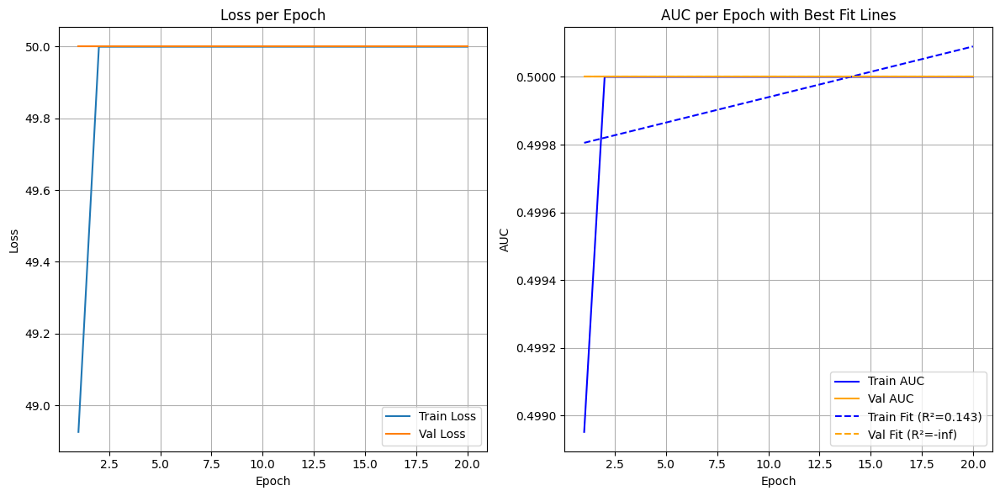

Removed structure: batch_size=512, embed_dim=512, num_heads=2, mlp_hidden_dims=(16, 32, 64, 128)

Saved model and trial summaries to '/content/drive/MyDrive/model8'

Trial 20/20
batch_size=256, embed_dim=64, num_heads=2, dropout=0.381, mlp_hidden_dims=(32, 64, 128), lr=0.006412, epochs=25
Using device: cuda
Epoch 1/25 | Train Loss: 0.5611 | Train AUC: 0.7869 | Train Precision: 0.6979 | Train Recall: 0.8097 | Train Accuracy: 0.7296 || Val Loss: 0.5229 | Val AUC: 0.8211 | Val Precision: 0.7226 | Val Recall: 0.8179 | Val Accuracy: 0.7519
--> Saved best model with Val AUC: 0.8211
Epoch 2/25 | Train Loss: 0.5353 | Train AUC: 0.8043 | Train Precision: 0.6992 | Train Recall: 0.8482 | Train Accuracy: 0.7417 || Val Loss: 0.5288 | Val AUC: 0.8212 | Val Precision: 0.7163 | Val Recall: 0.8346 | Val Accuracy: 0.7520
--> Saved best model with Val AUC: 0.8212
Epoch 3/25 | Train Loss: 0.5355 | Train AUC: 0.8042 | Train Precision: 0.7009 | Train Recall: 0.8414 | Train Accuracy: 0.7411 || Val Loss: 0.51

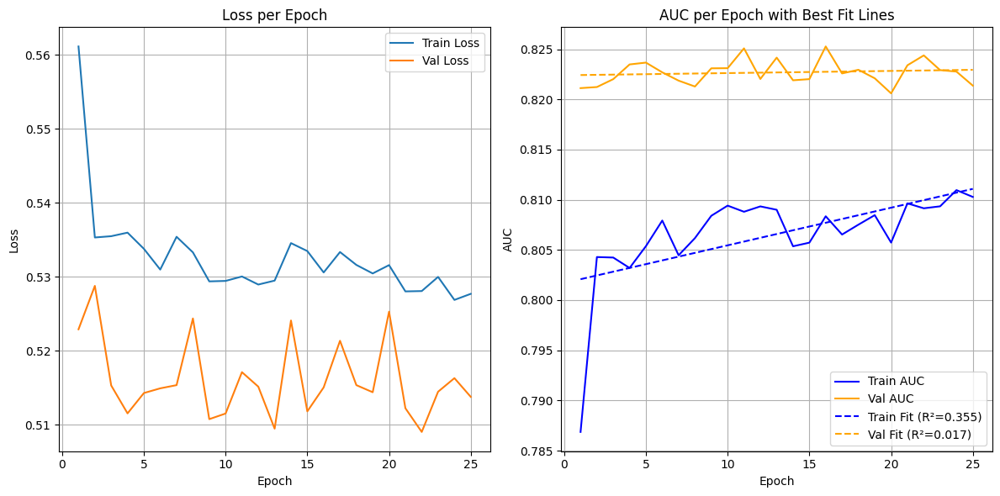


Saved model and trial summaries to '/content/drive/MyDrive/model8'

=== Trial Summary ===

Trial 1 — Removed: True
Params: {'batch_size': 512, 'embed_dim': 512, 'num_heads': 4, 'dropout': 0.124, 'mlp_hidden_dims': [32, 64], 'lr': 0.00436, 'epochs': 20}
Val AUC: 0.5000
Train Fit: y = 0.0000x + 0.4998, R²=0.1429
Val Fit:   y = 0.0000x + 0.5000, R²=-inf
Train Residuals (first 5): [-0.00096883  0.00020396  0.00018697  0.00016997  0.00015297]
Val Residuals   (first 5): [0. 0. 0. 0. 0.]

Trial 2 — Removed: True
Params: {'batch_size': 32, 'embed_dim': 256, 'num_heads': 16, 'dropout': 0.503, 'mlp_hidden_dims': [8, 16, 32], 'lr': 0.009961, 'epochs': 10}
Val AUC: 0.5000
Train Fit: y = 0.0000x + 0.5000, R²=0.2727
Val Fit:   y = -0.0000x + 0.5000, R²=-inf
Train Residuals (first 5): [-3.03913524e-05  1.35072677e-05  1.09746550e-05  8.44204232e-06
  5.90942962e-06]
Val Residuals   (first 5): [0.00000000e+00 0.00000000e+00 5.55111512e-17 5.55111512e-17
 5.55111512e-17]

Trial 3 — Removed: True
Param

In [ ]:
best_model8, best_config8, history8, possible_structures = random_search(input_dim=len(feature_names), device=device, n_trials=20, save_dir="/content/drive/MyDrive/model8")